# IEEE CIS FRAUD DETECTION EDA


In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from lightgbm import LGBMClassifier
import lightgbm as lgb
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from matplotlib import pyplot

In [2]:
#importing data
data_train = pd.read_csv("train_transaction.csv")
data_test = pd.read_csv("test_transaction.csv")
train_identity = pd.read_csv("train_identity.csv")
test_identity = pd.read_csv("test_identity.csv")

In [509]:
# printing train and test data
print(data_train.head(5))
print(train_identity.head(5))

   TransactionID  isFraud  TransactionDT  TransactionAmt ProductCD  card1  \
0        2987002        0          86469            59.0         W   4663   
1        2987003        0          86499            50.0         W  18132   
2        2987005        0          86510            49.0         W   5937   
3        2987006        0          86522           159.0         W  12308   
4        2987008        0          86535            15.0         H   2803   

   card2  card3       card4  card5  card6  addr1  addr2  dist1  dist2  \
0  490.0  150.0        visa  166.0  debit  330.0   87.0  287.0    NaN   
1  567.0  150.0  mastercard  117.0  debit  476.0   87.0    NaN    NaN   
2  555.0  150.0        visa  226.0  debit  272.0   87.0   36.0    NaN   
3  360.0  150.0        visa  166.0  debit  126.0   87.0    0.0    NaN   
4  100.0  150.0        visa  226.0  debit  337.0   87.0    NaN    NaN   

   P_emaildomain R_emaildomain   C1   C2   C3   C4   C5   C6   C7   C8   C9  \
0    outlook.com   

In [510]:
print(data_test.head(5))
print(test_identity.head(5))

   TransactionID  TransactionDT  TransactionAmt ProductCD  card1  card2  \
0        2987000          86400            68.5         W  13926    NaN   
1        2987001          86401            29.0         W   2755  404.0   
2        2987004          86506            50.0         H   4497  514.0   
3        2987007          86529           422.5         W  12695  490.0   
4        2987009          86536           117.0         W  17399  111.0   

   card3       card4  card5   card6  addr1  addr2  dist1  dist2 P_emaildomain  \
0  150.0    discover  142.0  credit  315.0   87.0   19.0    NaN           NaN   
1  150.0  mastercard  102.0  credit  325.0   87.0    NaN    NaN     gmail.com   
2  150.0  mastercard  102.0  credit  420.0   87.0    NaN    NaN     gmail.com   
3  150.0        visa  226.0   debit  325.0   87.0    NaN    NaN      mail.com   
4  150.0  mastercard  224.0   debit  204.0   87.0   19.0    NaN     yahoo.com   

  R_emaildomain   C1   C2   C3   C4   C5   C6   C7   C8   C9  

In [5]:
# now we can see in both the tables TransactionID is common so we can merge these tables using  it
# similary we can do it for test also
train = pd.merge(data_train,train_identity,how='left', on='TransactionID',left_index=True,right_index=True)
test = pd.merge(data_test,test_identity,how='left', on='TransactionID',left_index=True,right_index=True)
print(train.head())
print(test.head())

   TransactionID  isFraud  TransactionDT  TransactionAmt ProductCD  card1  \
0        2987002        0          86469            59.0         W   4663   
1        2987003        0          86499            50.0         W  18132   
2        2987005        0          86510            49.0         W   5937   
3        2987006        0          86522           159.0         W  12308   
4        2987008        0          86535            15.0         H   2803   

   card2  card3       card4  card5  ...               id_31  id_32     id_33  \
0  490.0  150.0        visa  166.0  ...  mobile safari 11.0   32.0  1334x750   
1  567.0  150.0  mastercard  117.0  ...         chrome 62.0    NaN       NaN   
2  555.0  150.0        visa  226.0  ...         chrome 62.0   24.0  1280x800   
3  360.0  150.0        visa  166.0  ...         chrome 62.0    NaN       NaN   
4  100.0  150.0        visa  226.0  ...         chrome 62.0    NaN       NaN   

            id_34  id_35 id_36 id_37  id_38  DeviceType 

In [512]:
print(train.shape)
print(test.shape)

(354324, 434)
(236216, 433)


In [513]:
# checking no number of null values in columns
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
print(train.isnull().sum())
print(test.isnull().sum())

TransactionID          0
isFraud                0
TransactionDT          0
TransactionAmt         0
ProductCD              0
card1                  0
card2               5421
card3                992
card4               1000
card5               2577
card6                997
addr1              39482
addr2              39482
dist1             211467
dist2             331717
P_emaildomain      56750
R_emaildomain     271597
C1                     0
C2                     0
C3                     0
C4                     0
C5                     0
C6                     0
C7                     0
C8                     0
C9                     0
C10                    0
C11                    0
C12                    0
C13                    0
C14                    0
D1                   784
D2                168770
D3                157985
D4                101743
D5                186339
D6                310333
D7                330931
D8                309214
D9                309214


TransactionID          0
TransactionDT          0
TransactionAmt         0
ProductCD              0
card1                  0
card2               3512
card3                573
card4                577
card5               1682
card6                574
addr1              26224
addr2              26224
dist1             140804
dist2             221196
P_emaildomain      37706
R_emaildomain     181652
C1                     0
C2                     0
C3                     0
C4                     0
C5                     0
C6                     0
C7                     0
C8                     0
C9                     0
C10                    0
C11                    0
C12                    0
C13                    0
C14                    0
D1                   485
D2                112027
D3                104893
D4                 67179
D5                123502
D6                207020
D7                220692
D8                206400
D9                206400
D10                30169


In [514]:
#printing percerntage of null values in each column
null_var = train.isnull().sum()/train.shape[0] *100
null_var_test = test.isnull().sum()/test.shape[0] *100
print(null_var)
print(null_var_test)

TransactionID      0.000000
isFraud            0.000000
TransactionDT      0.000000
TransactionAmt     0.000000
ProductCD          0.000000
card1              0.000000
card2              1.529956
card3              0.279970
card4              0.282228
card5              0.727300
card6              0.281381
addr1             11.142909
addr2             11.142909
dist1             59.681817
dist2             93.619681
P_emaildomain     16.016414
R_emaildomain     76.652160
C1                 0.000000
C2                 0.000000
C3                 0.000000
C4                 0.000000
C5                 0.000000
C6                 0.000000
C7                 0.000000
C8                 0.000000
C9                 0.000000
C10                0.000000
C11                0.000000
C12                0.000000
C13                0.000000
C14                0.000000
D1                 0.221266
D2                47.631546
D3                44.587722
D4                28.714679
D5                52

In [515]:
# categorical features in data
x =train.select_dtypes(include=['object'])
x.columns

Index(['ProductCD', 'card4', 'card6', 'P_emaildomain', 'R_emaildomain', 'M1',
       'M2', 'M3', 'M4', 'M5', 'M6', 'M7', 'M8', 'M9', 'id_12', 'id_15',
       'id_16', 'id_23', 'id_27', 'id_28', 'id_29', 'id_30', 'id_31', 'id_33',
       'id_34', 'id_35', 'id_36', 'id_37', 'id_38', 'DeviceType',
       'DeviceInfo'],
      dtype='object')

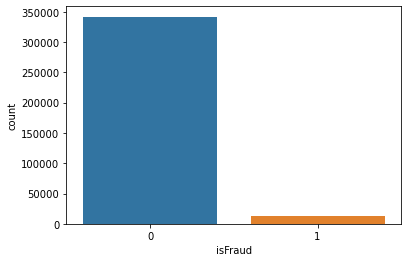

From total data  3.52 % contains fraud train
From total data  96.48 % contains legit train


In [516]:
# using countplot on isfraud we can see it is highly imbalanced data
sns.countplot(train['isFraud'])
plt.show()
print('From total data ',np.round(train[train['isFraud']==1].shape[0]/train.shape[0]*100,2),'% contains fraud train')
print('From total data ',np.round(train[train['isFraud']==0].shape[0]/train.shape[0]*100,2),'% contains legit train')

In [517]:
# transaction id is unique so we can drop this column
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
train.TransactionID.value_counts()

3147775    1
3216247    1
3547463    1
3273579    1
3261293    1
3267438    1
3226482    1
3224435    1
3541227    1
3218294    1
3238776    1
3248999    1
3572832    1
3240827    1
3230588    1
3544407    1
3234686    1
3232639    1
3058560    1
3062658    1
3271528    1
3251046    1
3187521    1
3158867    1
3185478    1
3183431    1
3551878    1
3210058    1
3208011    1
3197772    1
3156816    1
3160914    1
3146581    1
3244901    1
3150679    1
3537313    1
3565826    1
3175259    1
3162973    1
3169118    1
3257187    1
3246948    1
3060611    1
3050372    1
3543673    1
3091376    1
3113893    1
3120038    1
3117991    1
3140520    1
3138473    1
3142571    1
3132332    1
3130285    1
3089329    1
3074952    1
3095474    1
3093427    1
3541314    1
3081141    1
3085239    1
3107768    1
3111866    1
3097533    1
3115940    1
3572257    1
3122081    1
3124128    1
3079050    1
3077003    1
3066764    1
3064717    1
3068815    1
3550096    1
3023761    1
3029906    1
3027859    1

In [518]:
#deleting transaction id
#del train['TransactionID']
#del test['TransactionID']

### Analyzing train and test data for TransactionDT

In [519]:
train['TransactionDT'].describe()

count    3.543240e+05
mean     7.368821e+06
std      4.618388e+06
min      8.646900e+04
25%      3.024168e+06
50%      7.280034e+06
75%      1.124280e+07
max      1.581113e+07
Name: TransactionDT, dtype: float64

Text(0.5, 1.0, 'Test')

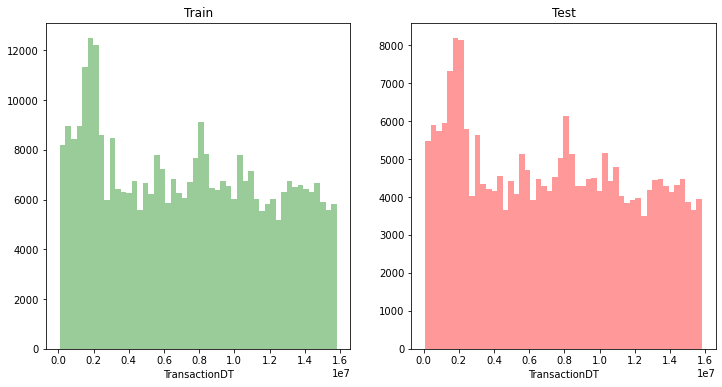

In [520]:
# plotting graph for train and test data
plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
sns.distplot(train['TransactionDT'],kde = False,color ='g' )
plt.title('Train')
plt.subplot(1,2,2)
sns.distplot(test['TransactionDT'],kde=False,color = 'r')
plt.title('Test')

#### From above plot we can see train and test data have almost same TransactionDT distribution

Text(0.5, 1.0, 'Test')

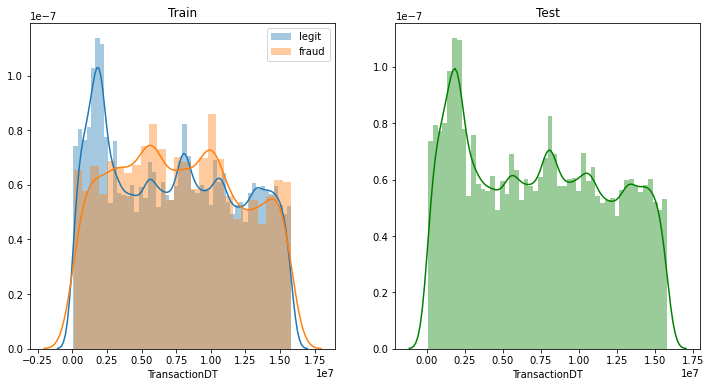

In [521]:
plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
sns.distplot(train[train['isFraud']==0]['TransactionDT'])
sns.distplot(train[train['isFraud']==1]['TransactionDT'])
plt.legend(['legit','fraud'])
plt.title('Train')
plt.subplot(1,2,2)
sns.distplot(test['TransactionDT'],color = 'g')
plt.title('Test')

#### From above plot we can see TransactionDT value from 0.25 to  0.75 and 0.9 t0 1.15 have greater probability  density of fraud transactions. 


we know that Transaction DT features is in in seconds so we can convert it into hours and check at which particular hour fraud rate is high

In [4]:
train['hour'] = (train['TransactionDT']//(3600))%24
test['hour'] = (test['TransactionDT']//(3600))%24

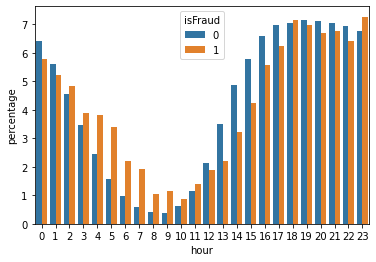

In [523]:
train_hour = (train.groupby(['isFraud'])['hour']
                     .value_counts(normalize=True)
                     .rename('percentage')
                     .mul(100)
                     .reset_index()
                     .sort_values('hour'))
sns.barplot(x="hour", y="percentage", hue="isFraud", data=train_hour)

- We can see in the hour from 3 to 11 rate of fraud transaction is more.
- we can also create a new features in which if hour is 3-11 there should be high alert since rate of fraud transactions is       high

### Analyzing transaction amount for train and test data

In [524]:
# checking null values in transaction amount
print(train.TransactionAmt.head(10))
print('\n')
print(train.TransactionAmt.isnull().value_counts())

0     59.000
1     50.000
2     49.000
3    159.000
4     15.000
5     75.887
6     10.500
7     57.950
8     30.000
9     47.950
Name: TransactionAmt, dtype: float64


False    354324
Name: TransactionAmt, dtype: int64


From above we can see transaction amount contains no null values

Analyzing Transaction amount and it effect on transaction being legit or fraud

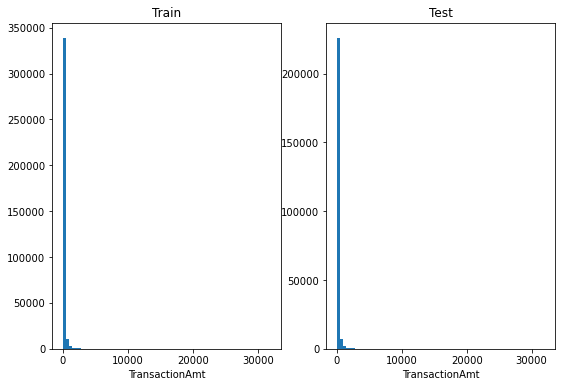

In [525]:
# plot for transaction amount
plt.figure(figsize=(9,6))
plt.subplot(1,2,1)
plt.hist(train['TransactionAmt'],bins=70,label = 'plot')
plt.title('Train')
plt.xlabel("TransactionAmt")
plt.subplot(1,2,2)
plt.hist(test['TransactionAmt'],bins=70,label = 'plot')
plt.title('Test')
plt.xlabel("TransactionAmt")
plt.show()

From above plot we see that data is skewed so we need to transform it using log transformation

In [5]:
# transforming data using log transformation
train['LogTransactionAmt'] = np.log(train['TransactionAmt'])
test['LogTransactionAmt'] = np.log(test['TransactionAmt'])

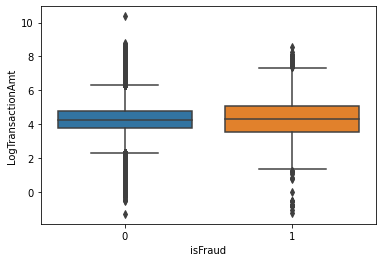

In [527]:
sns.boxplot(x='isFraud',y='LogTransactionAmt', data = train)

There are some outliers in transaction amount so we can repalce it with mean

Text(0.5, 1.0, 'Test After Transformation')

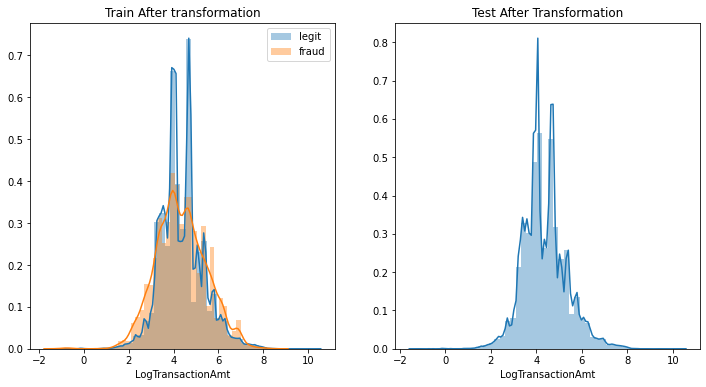

In [528]:
plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
sns.distplot(train[train['isFraud']==0]['LogTransactionAmt'])
sns.distplot(train[train['isFraud']==1]['LogTransactionAmt'])
plt.legend(['legit','fraud'])
plt.title('Train After transformation')
plt.subplot(1,2,2)
sns.distplot(test['LogTransactionAmt'])
plt.title('Test After Transformation')

#### From above plots we can see we have removed skewness from data and also we can note one very inetresting visualization from above plot that if transaction amount is less than 3.2  and more than 5.4 frequency of frauadlent transactions becomes high so this feature will be helpful while training the model and predicting whether a transaction is fraud or legit.

In [6]:
# delete original columns since we have added log transformed columns in data
del train['TransactionAmt']
del test['TransactionAmt']

### Analyzing Product cd for train and test data 

In [530]:
#describing Product Cd
train['ProductCD'].describe()

count     354324
unique         5
top            W
freq      263463
Name: ProductCD, dtype: object

from above we can see product cd is a categorical feature with 5 unique values

In [531]:
#checking null values in ProductCd
print(train['ProductCD'].isnull().sum(axis = 0))
print(test['ProductCD'].isnull().sum(axis = 0))

0
0


product cd contains no null values.

Text(0.5, 1.0, 'Test')

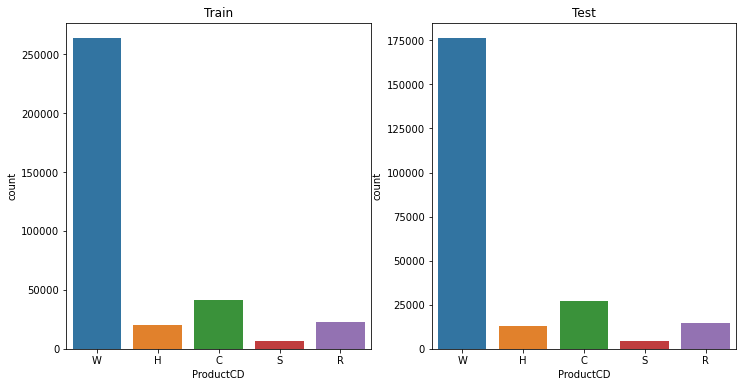

In [532]:
plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
sns.countplot(train['ProductCD'])
plt.title('Train')
plt.subplot(1,2,2)
sns.countplot(test['ProductCD'])
plt.title('Test')

From above plots we can see W has more no of trasactions.

Text(0.5, 1.0, 'Test')

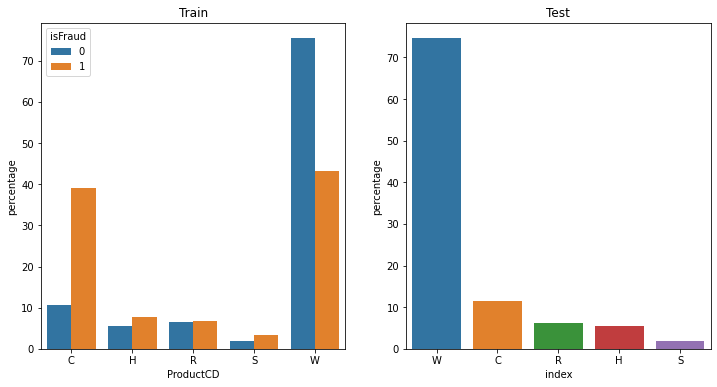

In [533]:
# plotting graph to check percentage of fraud in each unique ProductCd
plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
train_ProductCD = (train[~train['ProductCD'].isnull()].groupby(['isFraud'])['ProductCD']
                     .value_counts(normalize=True)
                     .rename('percentage')
                     .mul(100)
                     .reset_index()
                     .sort_values('ProductCD'))
sns.barplot(x="ProductCD", y="percentage", hue="isFraud", data=train_ProductCD)
plt.title('Train')
plt.subplot(1,2,2)
test_ProductCD =test[~test['ProductCD'].isnull()]['ProductCD'].value_counts(normalize=True).mul(100).rename('percentage')\
.reset_index()
sns.barplot(x="index", y="percentage", data=test_ProductCD)
plt.title('Test')

#### From above plot we see that Product Cd type "C" have majority percentage of fraud transactions so this attribute will be essential to train model. 

### Analysis of Card1-6 columns

card1:ID

card2:bank-branch in some place(NOT bank)
because many value has similar frequency
if a bank-branch don't have so much customers,I think it will be closed.
So I guess each bank has similar amounts of customers.

card3:country
because distribution of card3 is similar to dist2

card4:company of the card

card5:
bind to third party software which hold your money before you receive your goods ，ｅ.g. alipay() ，PayPal or else
because some value has the far greater frequency than others.
Note that Vesta (the host of this competition) is also the third party software company.

card5 has totally 120 values.
I guess this maybe encoded from which website or app the customer use with the 3rd-party software.
There are some websites or app is well-known but the others are not common used.

card6:credit/debit

In [534]:
card_cols = [c for c in train.columns if 'card' in c]
train[card_cols].head()

,card1,card2,card3,card4,card5,card6
0,4663,490.0,150.0,visa,166.0,debit
1,18132,567.0,150.0,mastercard,117.0,debit
2,5937,555.0,150.0,visa,226.0,debit
3,12308,360.0,150.0,visa,166.0,debit
4,2803,100.0,150.0,visa,226.0,debit


In [535]:
train[card_cols].describe()

,card1,card2,card3,card5
count,354324.000000,348903.000000,353332.000000,351747.000000
mean,9883.933259,362.755459,153.201966,199.274814
std,4902.339244,157.735513,11.336384,41.222378
min,1000.000000,100.000000,100.000000,100.000000
25%,6019.000000,215.000000,150.000000,166.000000
50%,9633.000000,361.000000,150.000000,226.000000
75%,14182.000000,512.000000,150.000000,226.000000
max,18395.000000,600.000000,231.000000,237.000000


In [536]:
train[card_cols].isnull().sum()

card1       0
card2    5421
card3     992
card4    1000
card5    2577
card6     997
dtype: int64

#### we see 2 are categorical ,4 are numerical cols , lets see their plots

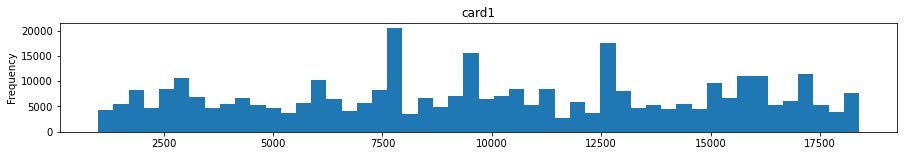

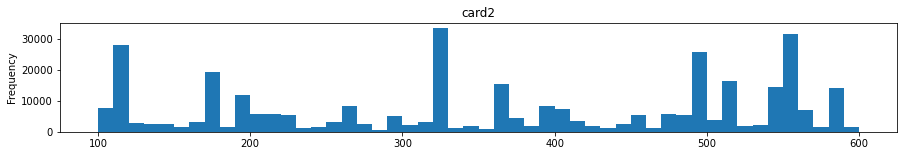

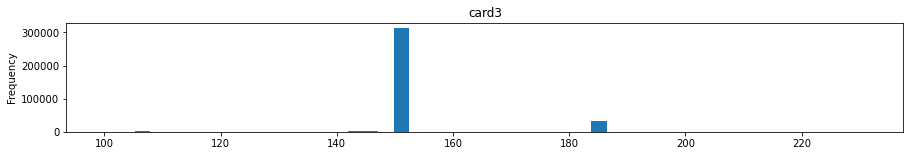

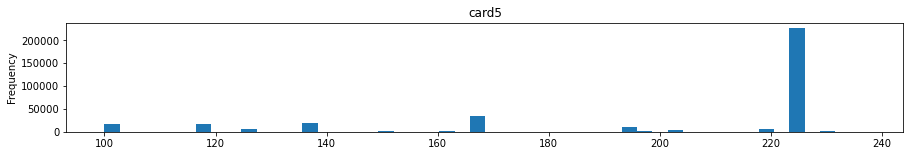

In [537]:
for c in card_cols:
    if train[c].dtype in ['float64','int64']:
        train[c].plot(kind='hist',
                                      title=c,
                                      bins=50,
                                      figsize=(15, 2))
    plt.show()

## Card 1

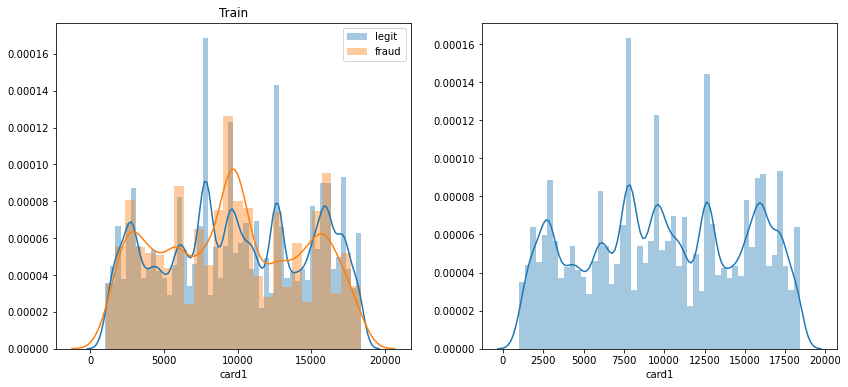

In [538]:
plt.figure(figsize=(14,6))
plt.subplot(1,2,1)
sns.distplot(train[train['isFraud']==0]['card1'])
sns.distplot(train[train['isFraud']==1]['card1'])
plt.legend(['legit','fraud'])
plt.title('Train')
plt.subplot(1,2,2)
sns.distplot(test['card1'])

## card 2

Text(0.5, 1.0, 'Test')

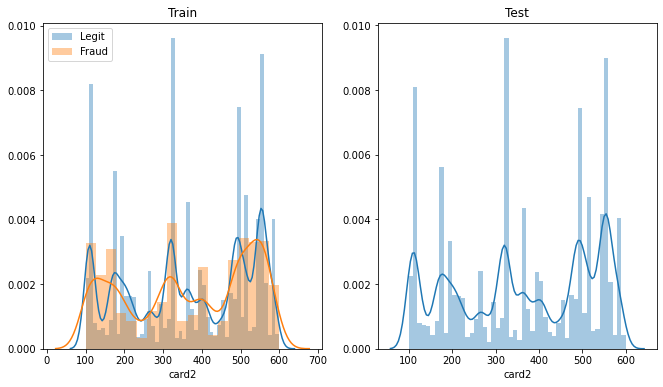

In [539]:
plt.figure(figsize=(11,6))
plt.subplot(1,2,1)
sns.distplot(train[(train['isFraud']==0)]['card2'])
sns.distplot(train[(train['isFraud']==1)]['card2'])
plt.legend(['Legit','Fraud'])
plt.title('Train')
plt.subplot(1,2,2)
sns.distplot(test[~test['card2'].isnull()]['card2'])
plt.title('Test')

## card 3

C:\Users\shivam\anaconda\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\shivam\anaconda\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


Text(0.5, 1.0, 'Test')

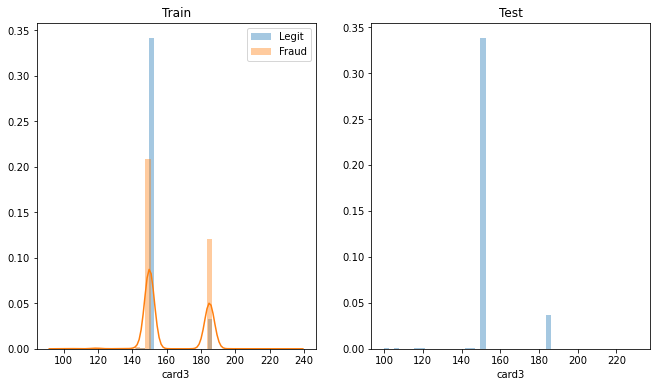

In [540]:
plt.figure(figsize=(11,6))
plt.subplot(1,2,1)
sns.distplot(train[(train['isFraud']==0)]['card3'])
sns.distplot(train[(train['isFraud']==1)]['card3'])
plt.legend(['Legit','Fraud'])
plt.title('Train')
plt.subplot(1,2,2)
sns.distplot(test[~test['card3'].isnull()]['card3'])
plt.title('Test')

- From plot it can be found that card3 contains only majority of  2 values only.
- And if the value is greater than 150 the probability of transaction being fraud increases.
- We can create another feature like if the value is greater than 150 marked it as T(means fraud) otherwise F.

In [541]:
def card3Values(val):
    if val==np.nan:
        return val
    else:
        if val > 150:
            return 'T'
        else:
            return 'F'

In [542]:
train['card3Values'] = train['card3'].apply(card3Values)

In [543]:
test['card3Values'] = test['card3'].apply(card3Values)

In [544]:
train.head()

,TransactionID,isFraud,TransactionDT,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,dist2,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15,M1,M2,M3,M4,M5,M6,M7,M8,M9,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29,V30,V31,V32,V33,V34,V35,V36,V37,V38,V39,V40,V41,V42,V43,V44,V45,V46,V47,V48,V49,V50,V51,V52,V53,V54,V55,V56,V57,V58,V59,V60,V61,V62,V63,V64,V65,V66,V67,V68,V69,V70,V71,V72,V73,V74,V75,V76,V77,V78,V79,V80,V81,V82,V83,V84,V85,V86,V87,V88,V89,V90,V91,V92,V93,V94,V95,V96,V97,V98,V99,V100,V101,V102,V103,V104,V105,V106,V107,V108,V109,V110,V111,V112,V113,V114,V115,V116,V117,V118,V119,V120,V121,V122,V123,V124,V125,V126,V127,V128,V129,V130,V131,V132,V133,V134,V135,V136,V137,V138,V139,V140,V141,V142,V143,V144,V145,V146,V147,V148,V149,V150,V151,V152,V153,V154,V155,V156,V157,V158,V159,V160,V161,V162,V163,V164,V165,V166,V167,V168,V169,V170,V171,V172,V173,V174,V175,V176,V177,V178,V179,V180,V181,V182,V183,V184,V185,V186,V187,V188,V189,V190,V191,V192,V193,V194,V195,V196,V197,V198,V199,V200,V201,V202,V203,V204,V205,V206,V207,V208,V209,V210,V211,V212,V213,V214,V215,V216,V217,V218,V219,V220,V221,V222,V223,V224,V225,V226,V227,V228,V229,V230,V231,V232,V233,V234,V235,V236,V237,V238,V239,V240,V241,V242,V243,V244,V245,V246,V247,V248,V249,V250,V251,V252,V253,V254,V255,V256,V257,V258,V259,V260,V261,V262,V263,V264,V265,V266,V267,V268,V269,V270,V271,V272,V273,V274,V275,V276,V277,V278,V279,V280,V281,V282,V283,V284,V285,V286,V287,V288,V289,V290,V291,V292,V293,V294,V295,V296,V297,V298,V299,V300,V301,V302,V303,V304,V305,V306,V307,V308,V309,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321,V322,V323,V324,V325,V326,V327,V328,V329,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,id_10,id_11,id_12,id_13,id_14,id_15,id_16,id_17,id_18,id_19,id_20,id_21,id_22,id_23,id_24,id_25,id_26,id_27,id_28,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo,hour,LogTransactionAmt,card3Values
0,2987002,0,86469,W,4663,490.0,150.0,visa,166.0,debit,330.0,87.0,287.0,NaN,outlook.com,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,0.0,315.0,NaN,NaN,NaN,315.0,T,T,T,M0,F,F,F,F,F,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-5.0,98945.0,NaN,NaN,0.0,-5.0,NaN,NaN,NaN,NaN,100.0,NotFound,49.0,-300.0,New,NotFound,166.0,NaN,621.0,500.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,New,NotFound,iOS 11.1.2,mobile safari 11.0,32.0,1334x750,match_status:1,T,F,F,T,mobile,iOS Device,0,4.077537,F
1,2987003,0,86499,W,18132,567.0,150

## card 4

In [545]:
x1 = train["card4"].unique()

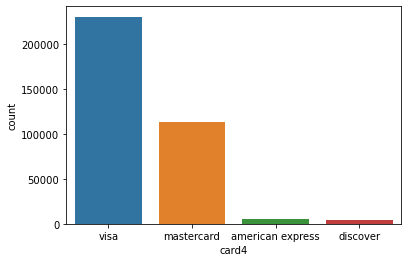

In [546]:
sns.countplot(train["card4"])

,isFraud,card4,percentage
0,0,visa,65.274824
1,0,mastercard,32.207069
2,0,american express,1.433009
3,0,discover,1.085098
4,1,visa,64.883777
5,1,mastercard,31.408349
6,1,discover,2.469235
7,1,american express,1.238639


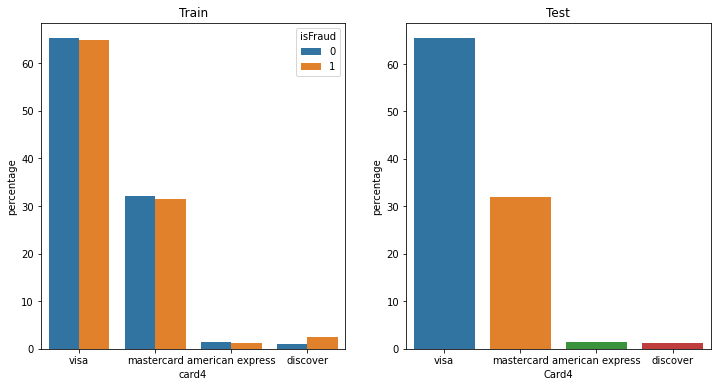

In [547]:
plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
train_card4 = (train[~train['card4'].isnull()].groupby(['isFraud'])['card4']
                     .value_counts(normalize=True)
                     .rename('percentage')
                     .mul(100)
                     .reset_index())
sns.barplot(x="card4", y="percentage", hue="isFraud", data=train_card4)
plt.title('Train')
plt.subplot(1,2,2)
test_card4 =test[~test['card4'].isnull()]['card4'].value_counts(normalize=True).mul(100).rename('percentage')\
.reset_index()
sns.barplot(x="index", y="percentage", data=test_card4)
plt.xlabel("Card4")
plt.title('Test')
train_card4

- Most of the transaction happend through visa card type.
- One observation is that percentage of fraud in card discover is more than the legit transaction.

## card5

Text(0.5, 1.0, 'Test')

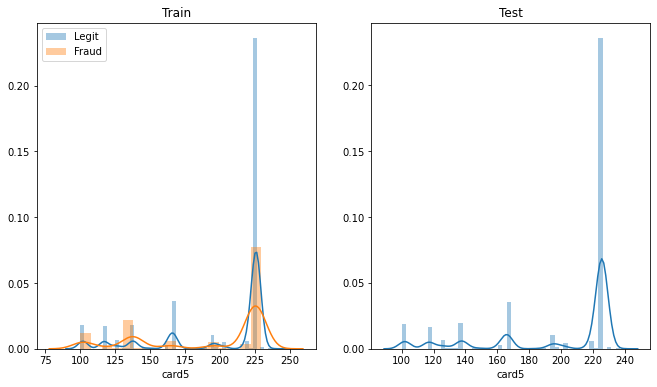

In [548]:
plt.figure(figsize=(11,6))
plt.subplot(1,2,1)
sns.distplot(train[(train['isFraud']==0) & (~train['card5'].isnull())]['card5'])
sns.distplot(train[(train['isFraud']==1) & (~train['card5'].isnull())]['card5'])
plt.legend(['Legit','Fraud'])
plt.title('Train')
plt.subplot(1,2,2)
sns.distplot(test[~test['card5'].isnull()]['card5'])
plt.title('Test')

- In some intervals frquency is high for fraud and in some intervals frequency is high for legit transaction.

## card 6

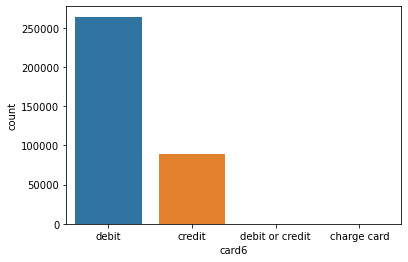

In [549]:
sns.countplot(train['card6'])

,isFraud,card6,percentage
0,0,debit,75.542179
1,0,credit,24.449607
2,0,debit or credit,0.005280
3,0,charge card,0.002933
4,1,debit,51.898022
5,1,credit,48.101978


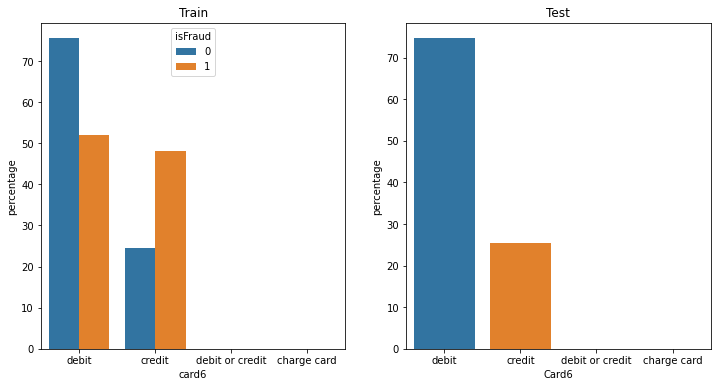

In [550]:
plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
train_card6 = (train[~train['card6'].isnull()].groupby(['isFraud'])['card6']
                     .value_counts(normalize=True)
                     .rename('percentage')
                     .mul(100)
                     .reset_index())
sns.barplot(x="card6", y="percentage", hue="isFraud", data=train_card6)
plt.title('Train')
plt.subplot(1,2,2)
test_card6 =test[~test['card6'].isnull()]['card6'].value_counts(normalize=True).mul(100).rename('percentage')\
.reset_index()
sns.barplot(x="index", y="percentage", data=test_card6)
plt.title('Test')
plt.xlabel("Card6")
train_card6

- Debit or credit and charge card are almost 0% in the dataset.
- Lets combine them in to other card category.
- Credit card holders tends to have more percentage of fraud transaction then legit transactions means most of fraud are done using credit card.

In [8]:
def replaceToOther(value):
    if value==np.nan:
        return value
    if value=='debit or credit' or value=='charge card':
        return 'debit'
    else:
        return value

In [9]:
train['card6'] = train['card6'].apply(replaceToOther)
test['card6'] = test['card6'].apply(replaceToOther)

Text(0.5, 1.0, 'Test')

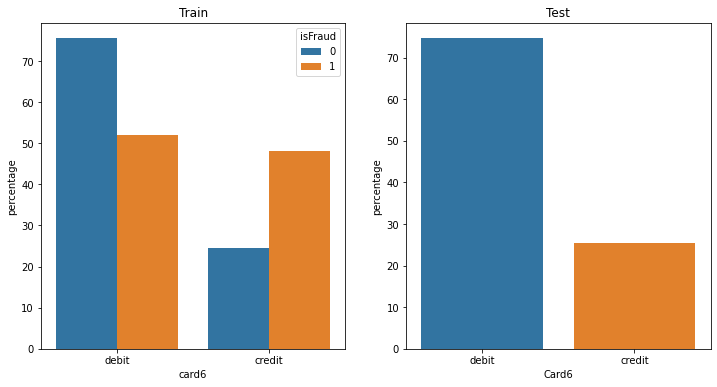

In [553]:
plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
train_card6 = (train[~train['card6'].isnull()].groupby(['isFraud'])['card6']
                     .value_counts(normalize=True)
                     .rename('percentage')
                     .mul(100)
                     .reset_index())
sns.barplot(x="card6", y="percentage", hue="isFraud", data=train_card6)
plt.title('Train')
plt.subplot(1,2,2)
test_card6 =test[~test['card6'].isnull()]['card6'].value_counts(normalize=True).mul(100).rename('percentage')\
.reset_index()
sns.barplot(x="index", y="percentage", data=test_card6)
plt.xlabel("Card6")
plt.title('Test')

### Analysis of device type vs fraud

In [554]:
# describing device type attribute 
train['DeviceType'].describe()

count       84892
unique          2
top       desktop
freq        51329
Name: DeviceType, dtype: object

#### we can see that device type attribute consists of two unique values and is a categorical feature

In [555]:
#checking null values in ProductCd
print(train['DeviceType'].isnull().sum(axis = 0))
print(test['DeviceType'].isnull().sum(axis = 0))

269432
180298


Text(0.5, 1.0, 'Test')

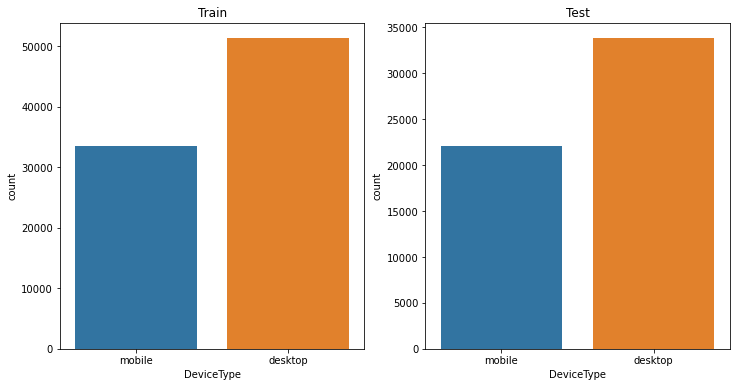

In [556]:
plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
sns.countplot(train['DeviceType'])
plt.title('Train')
plt.subplot(1,2,2)
sns.countplot(test['DeviceType'])
plt.title('Test')

#### From above plot we can see majority of transactions are done through dekstop

Text(0.5, 1.0, 'Test')

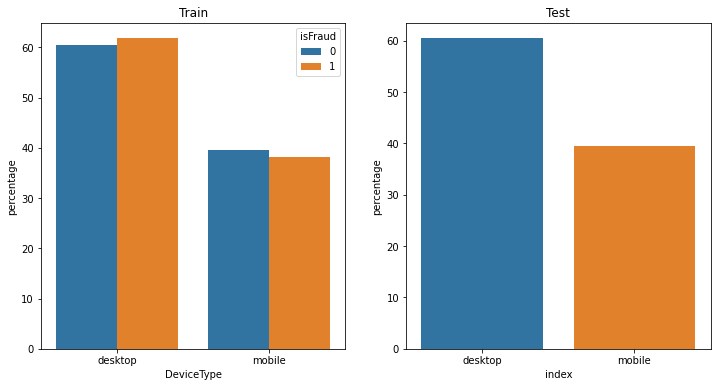

In [557]:
plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
train_devicetype = (train[~train['DeviceType'].isnull()].groupby(['isFraud'])['DeviceType']
                     .value_counts(normalize=True)
                     .rename('percentage')
                     .mul(100)
                     .reset_index())
sns.barplot(x="DeviceType", y="percentage", hue="isFraud", data=train_devicetype)
plt.title('Train')
plt.subplot(1,2,2)
test_devicetype =test[~test['DeviceType'].isnull()]['DeviceType'].value_counts(normalize=True).mul(100).rename('percentage')\
.reset_index()
sns.barplot(x="index", y="percentage", data=test_devicetype)
plt.title('Test')

#### From the above plot we can see dekstop and mobile almost have same percentage of fraud and legit transactions hence it doesnot provide us any important imformation and can be excluded while training model. 

In [558]:
# deleting device type attribute
#del train['DeviceType']
#del test['DeviceType']

### Analysis of device info

In [559]:
# describing device info
train['DeviceInfo'].describe()

count       71634
unique       1570
top       Windows
freq        28732
Name: DeviceInfo, dtype: object

In [560]:
# checking null value
print(train['DeviceInfo'].isnull().sum(axis = 0))
print(test['DeviceInfo'].isnull().sum(axis = 0))

282690
189184


In [561]:
#counting sum of device info of each type 
y = train['DeviceInfo'].value_counts()
y

Windows                                        28732
iOS Device                                     12022
MacOS                                           7595
Trident/7.0                                     4527
rv:11.0                                         1148
rv:57.0                                          572
SM-J700M Build/MMB29K                            337
SM-G610M Build/MMB29K                            285
SM-G531H Build/LMY48B                            252
rv:59.0                                          222
ALE-L23 Build/HuaweiALE-L23                      200
SM-G935F Build/NRD90M                            198
SM-G532M Build/MMB29T                            195
SM-G955U Build/NRD90M                            191
rv:58.0                                          175
SM-G950U Build/NRD90M                            172
SM-G930V Build/NRD90M                            156
rv:52.0                                          146
SM-N950U Build/NMF26X                         

In [562]:
#top used devices info
top_devices = y[0:9]

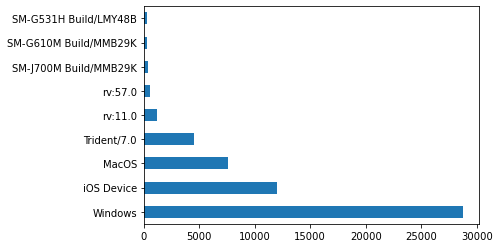

In [563]:
#plot 
top_devices.plot.barh(stacked=True)

In [564]:
top_devices

Windows                  28732
iOS Device               12022
MacOS                     7595
Trident/7.0               4527
rv:11.0                   1148
rv:57.0                    572
SM-J700M Build/MMB29K      337
SM-G610M Build/MMB29K      285
SM-G531H Build/LMY48B      252
Name: DeviceInfo, dtype: int64

In [565]:
df = train.loc[train['DeviceInfo'].isin(['Windows','iOS Device','MacOS','Trident/7.0','rv:11.0','rv:57.0'])]
df.head(10)

,TransactionID,isFraud,TransactionDT,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,dist2,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15,M1,M2,M3,M4,M5,M6,M7,M8,M9,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29,V30,V31,V32,V33,V34,V35,V36,V37,V38,V39,V40,V41,V42,V43,V44,V45,V46,V47,V48,V49,V50,V51,V52,V53,V54,V55,V56,V57,V58,V59,V60,V61,V62,V63,V64,V65,V66,V67,V68,V69,V70,V71,V72,V73,V74,V75,V76,V77,V78,V79,V80,V81,V82,V83,V84,V85,V86,V87,V88,V89,V90,V91,V92,V93,V94,V95,V96,V97,V98,V99,V100,V101,V102,V103,V104,V105,V106,V107,V108,V109,V110,V111,V112,V113,V114,V115,V116,V117,V118,V119,V120,V121,V122,V123,V124,V125,V126,V127,V128,V129,V130,V131,V132,V133,V134,V135,V136,V137,V138,V139,V140,V141,V142,V143,V144,V145,V146,V147,V148,V149,V150,V151,V152,V153,V154,V155,V156,V157,V158,V159,V160,V161,V162,V163,V164,V165,V166,V167,V168,V169,V170,V171,V172,V173,V174,V175,V176,V177,V178,V179,V180,V181,V182,V183,V184,V185,V186,V187,V188,V189,V190,V191,V192,V193,V194,V195,V196,V197,V198,V199,V200,V201,V202,V203,V204,V205,V206,V207,V208,V209,V210,V211,V212,V213,V214,V215,V216,V217,V218,V219,V220,V221,V222,V223,V224,V225,V226,V227,V228,V229,V230,V231,V232,V233,V234,V235,V236,V237,V238,V239,V240,V241,V242,V243,V244,V245,V246,V247,V248,V249,V250,V251,V252,V253,V254,V255,V256,V257,V258,V259,V260,V261,V262,V263,V264,V265,V266,V267,V268,V269,V270,V271,V272,V273,V274,V275,V276,V277,V278,V279,V280,V281,V282,V283,V284,V285,V286,V287,V288,V289,V290,V291,V292,V293,V294,V295,V296,V297,V298,V299,V300,V301,V302,V303,V304,V305,V306,V307,V308,V309,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321,V322,V323,V324,V325,V326,V327,V328,V329,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,id_10,id_11,id_12,id_13,id_14,id_15,id_16,id_17,id_18,id_19,id_20,id_21,id_22,id_23,id_24,id_25,id_26,id_27,id_28,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo,hour,LogTransactionAmt,card3Values
0,2987002,0,86469,W,4663,490.0,150.0,visa,166.0,debit,330.0,87.0,287.0,NaN,outlook.com,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,0.0,315.0,NaN,NaN,NaN,315.0,T,T,T,M0,F,F,F,F,F,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-5.0,98945.0,NaN,NaN,0.0,-5.0,NaN,NaN,NaN,NaN,100.0,NotFound,49.0,-300.0,New,NotFound,166.0,NaN,621.0,500.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,New,NotFound,iOS 11.1.2,mobile safari 11.0,32.0,1334x750,matc

Text(0.5, 1.0, 'Train')

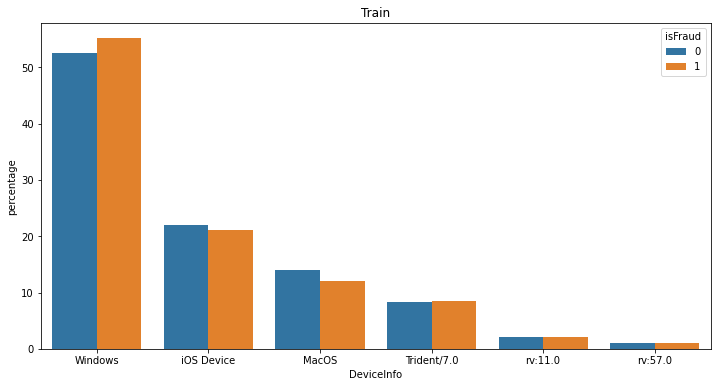

In [566]:
plt.figure(figsize=(12,6))

train_deviceInfo = (df[~df['DeviceInfo'].isnull()].groupby(['isFraud'])['DeviceInfo']
                     .value_counts(normalize=True)
                     .rename('percentage')
                     .mul(100)
                     .reset_index())
sns.barplot(x="DeviceInfo", y="percentage", hue="isFraud", data=train_deviceInfo)
plt.title('Train')


#### From the above plot we can see all top device info  have almost same percentage of fraud and legit transactions hence it doesnot provide us any important imformation and can be excluded while training model. 

In [567]:
#deleting columns
#del train['DeviceInfo']
#del test['DeviceInfo']

### Analyzing addr1 and addr2 attribute here addr1 represent billing zip addr2 represents billing country

In [568]:
train['addr1'].describe()

count    314842.000000
mean        290.712989
std         101.857741
min         100.000000
25%         204.000000
50%         299.000000
75%         330.000000
max         540.000000
Name: addr1, dtype: float64

In [569]:
# checking null values
print(train['addr1'].isnull().sum(axis = 0))
print(test['addr1'].isnull().sum(axis = 0))

39482
26224


Text(0.5, 1.0, 'Test')

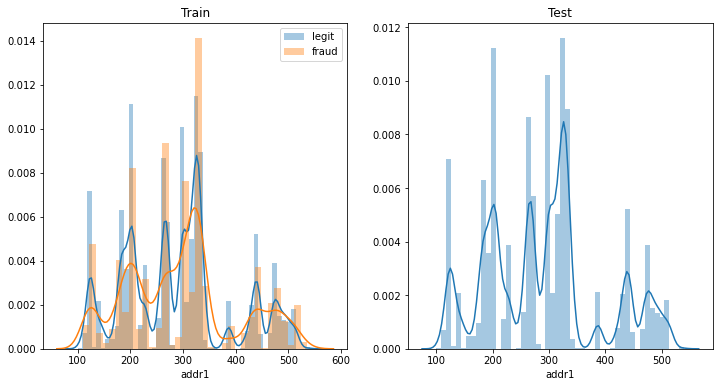

In [570]:
plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
sns.distplot(train[(train['isFraud']==0)]['addr1'])
sns.distplot(train[(train['isFraud']==1)]['addr1'])
plt.legend(['legit','fraud'])
plt.title('Train')
plt.subplot(1,2,2)
sns.distplot(test['addr1'])
plt.title('Test')

#### From the above plot we can see for some value of addr1(zipcode)  rate of fraud transaction is high like from value 220-250 ,350-380 so it will be important parameter while training the model.

In [571]:
train['addr2'].describe()

count    314842.000000
mean         86.804712
std           2.681134
min          10.000000
25%          87.000000
50%          87.000000
75%          87.000000
max         102.000000
Name: addr2, dtype: float64

#### we can see that majority of transaction has a value 87 for addr2 it means data consists trasaction data mainly from one country

In [572]:
# checking null values
print(train['addr2'].isnull().sum(axis = 0))
print(test['addr2'].isnull().sum(axis = 0))

39482
26224


C:\Users\shivam\anaconda\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\shivam\anaconda\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\shivam\anaconda\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


Text(0.5, 1.0, 'Test')

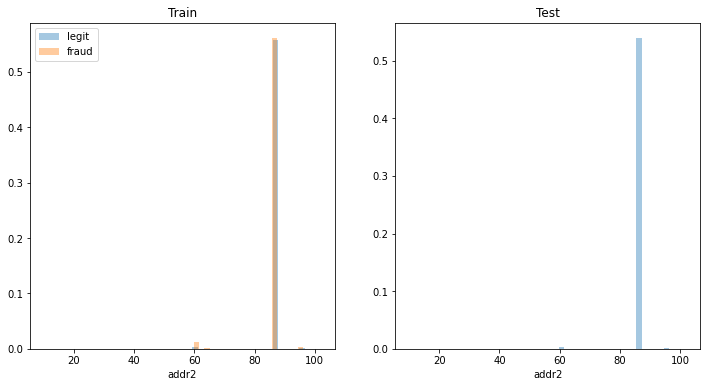

In [573]:
plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
sns.distplot(train[(train['isFraud']==0)]['addr2'])
sns.distplot(train[(train['isFraud']==1)]['addr2'])
plt.legend(['legit','fraud'])
plt.title('Train')
plt.subplot(1,2,2)
sns.distplot(test['addr2'])
plt.title('Test')

#### from above plot we can see majority values of transaction  is 87 and rate of fraud and legit transaction is almost equal for 87 but for value 60 fraud rate is high

In [574]:
df = train.loc[train['addr2'].isin([60,87])]
df.head(100)

,TransactionID,isFraud,TransactionDT,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,dist1,dist2,P_emaildomain,R_emaildomain,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15,M1,M2,M3,M4,M5,M6,M7,M8,M9,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29,V30,V31,V32,V33,V34,V35,V36,V37,V38,V39,V40,V41,V42,V43,V44,V45,V46,V47,V48,V49,V50,V51,V52,V53,V54,V55,V56,V57,V58,V59,V60,V61,V62,V63,V64,V65,V66,V67,V68,V69,V70,V71,V72,V73,V74,V75,V76,V77,V78,V79,V80,V81,V82,V83,V84,V85,V86,V87,V88,V89,V90,V91,V92,V93,V94,V95,V96,V97,V98,V99,V100,V101,V102,V103,V104,V105,V106,V107,V108,V109,V110,V111,V112,V113,V114,V115,V116,V117,V118,V119,V120,V121,V122,V123,V124,V125,V126,V127,V128,V129,V130,V131,V132,V133,V134,V135,V136,V137,V138,V139,V140,V141,V142,V143,V144,V145,V146,V147,V148,V149,V150,V151,V152,V153,V154,V155,V156,V157,V158,V159,V160,V161,V162,V163,V164,V165,V166,V167,V168,V169,V170,V171,V172,V173,V174,V175,V176,V177,V178,V179,V180,V181,V182,V183,V184,V185,V186,V187,V188,V189,V190,V191,V192,V193,V194,V195,V196,V197,V198,V199,V200,V201,V202,V203,V204,V205,V206,V207,V208,V209,V210,V211,V212,V213,V214,V215,V216,V217,V218,V219,V220,V221,V222,V223,V224,V225,V226,V227,V228,V229,V230,V231,V232,V233,V234,V235,V236,V237,V238,V239,V240,V241,V242,V243,V244,V245,V246,V247,V248,V249,V250,V251,V252,V253,V254,V255,V256,V257,V258,V259,V260,V261,V262,V263,V264,V265,V266,V267,V268,V269,V270,V271,V272,V273,V274,V275,V276,V277,V278,V279,V280,V281,V282,V283,V284,V285,V286,V287,V288,V289,V290,V291,V292,V293,V294,V295,V296,V297,V298,V299,V300,V301,V302,V303,V304,V305,V306,V307,V308,V309,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321,V322,V323,V324,V325,V326,V327,V328,V329,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,id_10,id_11,id_12,id_13,id_14,id_15,id_16,id_17,id_18,id_19,id_20,id_21,id_22,id_23,id_24,id_25,id_26,id_27,id_28,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo,hour,LogTransactionAmt,card3Values
0,2987002,0,86469,W,4663,490.0,150.0,visa,166.0,debit,330.0,87.0,287.0,NaN,outlook.com,NaN,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,0.0,315.0,NaN,NaN,NaN,315.0,T,T,T,M0,F,F,F,F,F,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-5.0,98945.0,NaN,NaN,0.0,-5.0,NaN,NaN,NaN,NaN,100.000000,NotFound,49.0,-300.0,New,NotFound,166.0,NaN,621.0,500.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,New,NotFound,iOS 11.1.2,mobile safari 11.

Text(0.5, 1.0, 'Train')

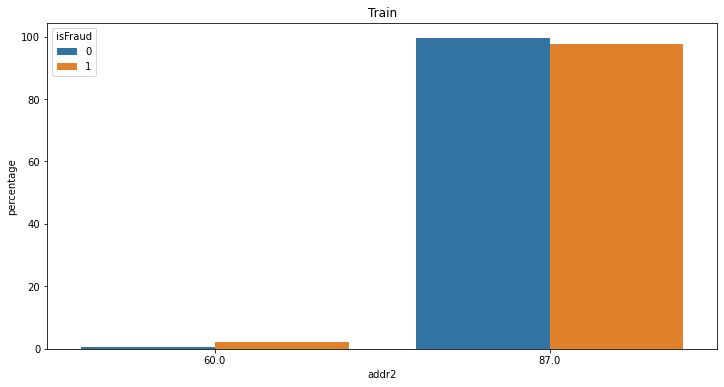

In [575]:
plt.figure(figsize=(12,6))

train_addr2 = (df[~df['addr2'].isnull()].groupby(['isFraud'])['addr2']
                     .value_counts(normalize=True)
                     .rename('percentage')
                     .mul(100)
                     .reset_index())
sns.barplot(x="addr2", y="percentage", hue="isFraud", data=train_addr2)
plt.title('Train')

#### From above plot we can see that that percentage of fraud transaction for addr2 value 60 is high so it will be important parameter in training model

#### As we have seen majority of transactions are having value 87 so we can replace NULL values with 87

In [10]:
# filling null values for train and test data
train['addr2'].fillna(87,inplace = True)
test['addr2'].fillna(87,inplace = True)
print(train['addr2'].isnull().sum(axis = 0))

0


### Analyzing dist1 ,dist2 attributes

In [577]:
train['dist1'].describe()

count    142857.000000
mean        118.817755
std         373.764372
min           0.000000
25%           3.000000
50%           8.000000
75%          24.000000
max       10286.000000
Name: dist1, dtype: float64

In [578]:
# checking null values
print(train['dist1'].isnull().sum(axis = 0))
print(test['dist1'].isnull().sum(axis = 0))

211467
140804


C:\Users\shivam\anaconda\lib\site-packages\numpy\lib\histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
C:\Users\shivam\anaconda\lib\site-packages\numpy\lib\histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


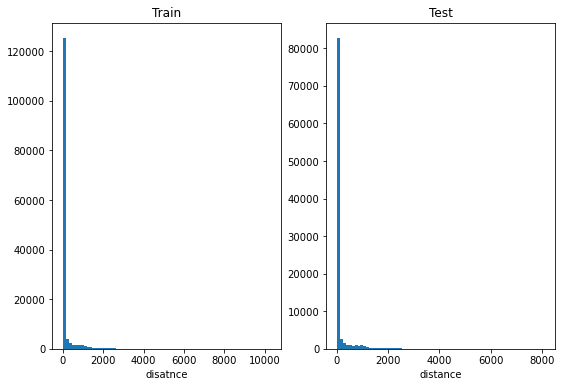

In [579]:
# plot for dist1
plt.figure(figsize=(9,6))
plt.subplot(1,2,1)
plt.hist(train['dist1'],bins=70,label = 'plot')
plt.title('Train')
plt.xlabel("disatnce")
plt.subplot(1,2,2)
plt.hist(test['dist1'],bins=70,label = 'plot')
plt.title('Test')
plt.xlabel("distance")
plt.show()

#### As we can see from plot dist1 is highly skewed so we need to tranform it using log tranformation

In [11]:
# transforming data using log transformation
train['Logdist1'] = np.log(train['dist1']+1)
test['Logdist1'] = np.log(test['dist1']+1)

Text(0.5, 1.0, 'Test After Transformation')

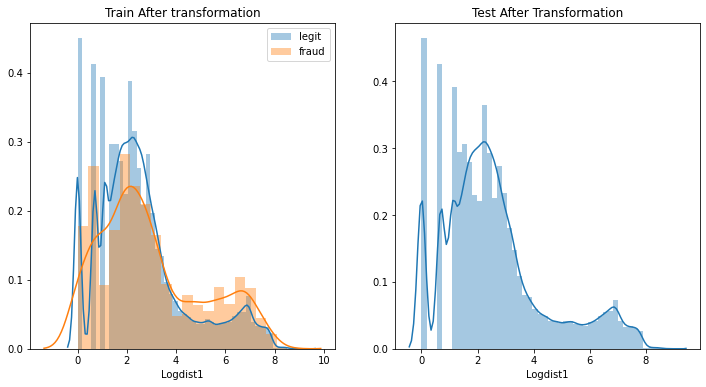

In [581]:
# plotting graph to check percentage of fraud for dist1 
plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
sns.distplot(train[train['isFraud']==0]['Logdist1'])
sns.distplot(train[train['isFraud']==1]['Logdist1'])
plt.legend(['legit','fraud'])
plt.title('Train After transformation')
plt.subplot(1,2,2)
sns.distplot(test['Logdist1'])
plt.title('Test After Transformation')

#### from above plots we see that dist1 value >4 have higher rate of fraud which specifies scammers tend to illegally swipe the card in a longer average distance from the cardholders address

In [12]:
# deleteing original columns
del train['dist1']
del test['dist1']

In [583]:
train['dist2'].describe()

count    22607.000000
mean       233.463706
std        535.992449
min          0.000000
25%          7.000000
50%         37.000000
75%        206.000000
max      11623.000000
Name: dist2, dtype: float64

In [584]:
# checking null values
print(train['dist2'].isnull().sum(axis = 0))
print(test['dist2'].isnull().sum(axis = 0))

331717
221196


C:\Users\shivam\anaconda\lib\site-packages\numpy\lib\histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
C:\Users\shivam\anaconda\lib\site-packages\numpy\lib\histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


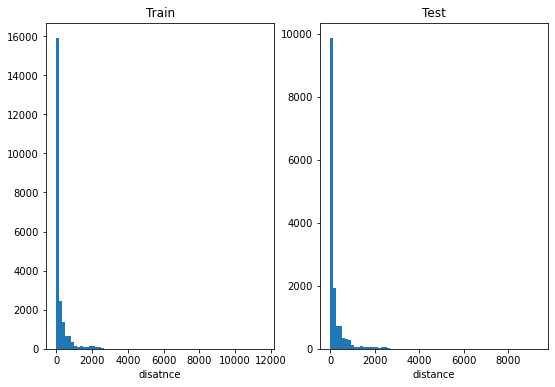

In [585]:
# plot for dist2
plt.figure(figsize=(9,6))
plt.subplot(1,2,1)
plt.hist(train['dist2'],bins=70)
plt.title('Train')
plt.xlabel("disatnce")
plt.subplot(1,2,2)
plt.hist(test['dist2'], bins=70)
plt.title('Test')
plt.xlabel("distance")
plt.show()

#### As we can see from plot dist2 is highly skewed so we need to tranform it using log tranformation

In [13]:
# transforming data using log transformation
train['Logdist2'] = np.log(train['dist2']+1)
test['Logdist2'] = np.log(test['dist2']+1)

Text(0.5, 1.0, 'Test After Transformation')

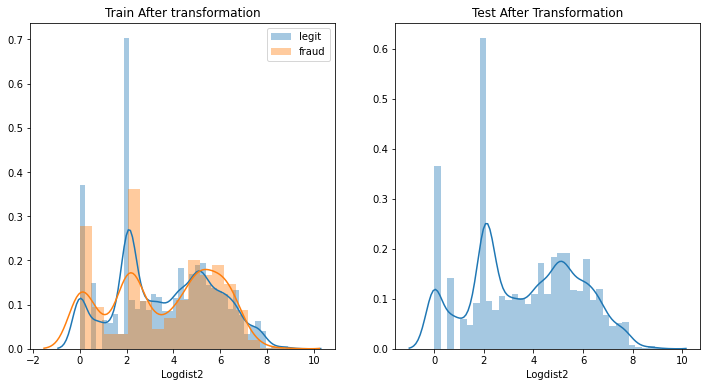

In [587]:
# plotting graph to check percentage of fraud for dist2
plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
sns.distplot(train[train['isFraud']==0]['Logdist2'])
sns.distplot(train[train['isFraud']==1]['Logdist2'])
plt.legend(['legit','fraud'])
plt.title('Train After transformation')
plt.subplot(1,2,2)
sns.distplot(test['Logdist2'])
plt.title('Test After Transformation')

#### From above plot we see tht dis2 from 5 to 7 have higher rate of fraud 

In [14]:
# deleteing original columns
del train['dist2']
del test['dist2']

## part-2

## Analyzing P_emaildomain and R_emaildomain

#### P_emaildomain represents purchaser email address domain
#### R-emaildomain represent reciptent email address domain

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
        51, 52, 53, 54, 55, 56, 57, 58]),
 <a list of 59 Text major ticklabel objects>)

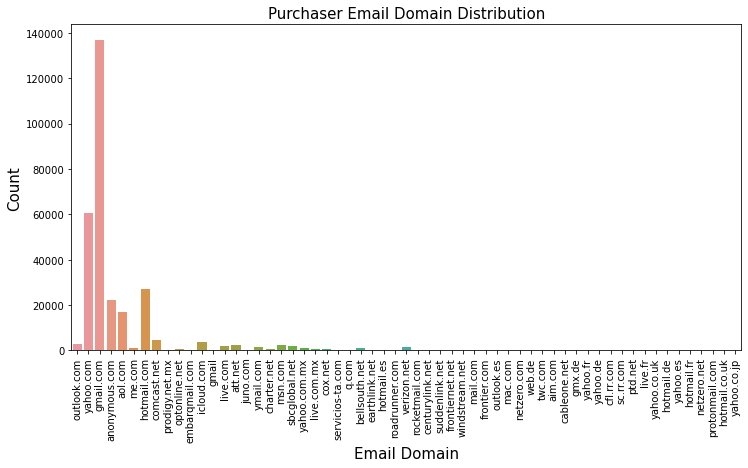

In [589]:
plt.figure(figsize=(12,6))
g = sns.countplot(x = 'P_emaildomain', data = train)
g.set_title('Purchaser Email Domain Distribution', fontsize = 15)
g.set_xlabel("Email Domain", fontsize=15)
g.set_ylabel("Count", fontsize=15)
plt.xticks(rotation='vertical')

 we can see alot of domains came from the same distributors such as hotmail.com, hotmail.fr, yahoo.com, yahoo.fr, yahoo.de, etc. We can group these domains together under the parent distributors.

so we Create P_parent_emaildomain field that remove the part after '.'

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41, 42, 43]),
 <a list of 44 Text major ticklabel objects>)

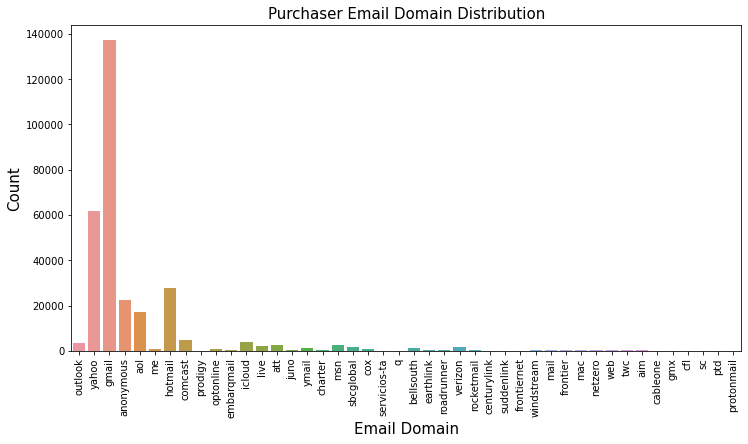

In [15]:
train["P_parent_emaildomain"] = train["P_emaildomain"].str.split('.', expand = True)[[0]]
test["P_parent_emaildomain"] = test["P_emaildomain"].str.split('.', expand = True)[[0]]
plt.figure(figsize=(12,6))

g = sns.countplot(x = 'P_parent_emaildomain', data = train)
g.set_title('Purchaser Email Domain Distribution', fontsize = 15)
g.set_xlabel("Email Domain", fontsize=15)
g.set_ylabel("Count", fontsize=15)
plt.xticks(rotation= "vertical")

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36, 37, 38, 39, 40, 41, 42, 43]),
 <a list of 44 Text major ticklabel objects>)

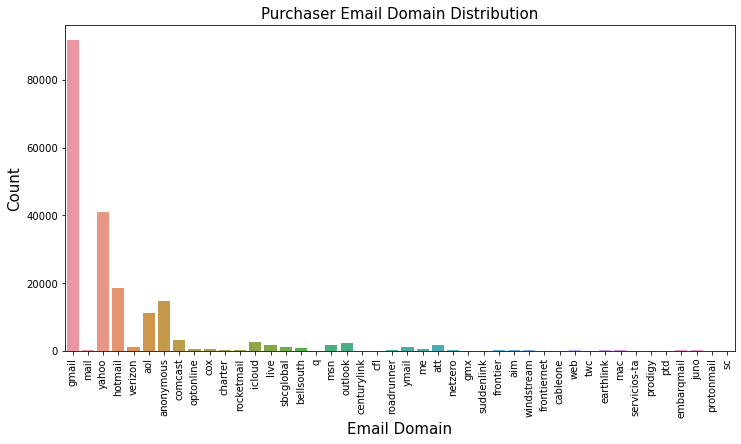

In [591]:
# for test data
plt.figure(figsize=(12,6))

g = sns.countplot(x = 'P_parent_emaildomain', data = test)
g.set_title('Purchaser Email Domain Distribution', fontsize = 15)
g.set_xlabel("Email Domain", fontsize=15)
g.set_ylabel("Count", fontsize=15)
plt.xticks(rotation= "vertical")

Test and train data follow same distribution

In [16]:
del(train["P_emaildomain"])
del(test["P_emaildomain"])

Text(0, 0.5, 'Fraud Rate')

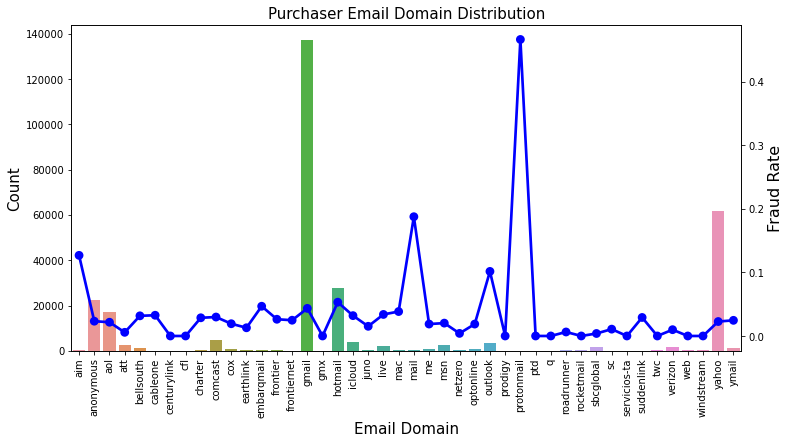

In [593]:
P_emaildomain_fraud_rate = train.groupby('P_parent_emaildomain')['isFraud'].value_counts(normalize = True).unstack().fillna(0)[1]

plt.figure(figsize=(12,6))

g = sns.countplot(x = 'P_parent_emaildomain', data = train, order = P_emaildomain_fraud_rate.index)
g.set_title('Purchaser Email Domain Distribution', fontsize = 15)
g.set_xlabel("Email Domain", fontsize=15)
g.set_ylabel("Count", fontsize=15)
plt.xticks(rotation= "vertical")

r = g.twinx()
r = sns.pointplot(x = P_emaildomain_fraud_rate.index, y = P_emaildomain_fraud_rate, color = 'blue')
r.set_ylabel("Fraud Rate", fontsize = 16, color = "black")

Protonmail returns an exemely high fraud rate. Almost 46% of transactions from purchaser using protonmail.com were label fraud. Now let's check number of rows for fraud.

In [594]:
protonmail_fraud = len(train[(train['P_parent_emaildomain'] == "protonmail") & (train['isFraud'] == 1)])
protonmail_non_fraud = len(train[(train['P_parent_emaildomain'] == "protonmail") & (train['isFraud'] == 0)])

protonmail_fraud_rate = protonmail_fraud/ (protonmail_fraud + protonmail_non_fraud)
print("Number of protonmail fraud transactions:", protonmail_fraud)
print("Number of protonmail non-fraud transactions:", protonmail_non_fraud)
print("Protonmail fraud rate:", protonmail_fraud_rate)

Number of protonmail fraud transactions: 21
Number of protonmail non-fraud transactions: 24
Protonmail fraud rate: 0.4666666666666667


Protonmail returns high rate as compared to others.

### Now we can perform similar analysis for R_emaildomain

Text(0, 0.5, 'Fraud Rate')

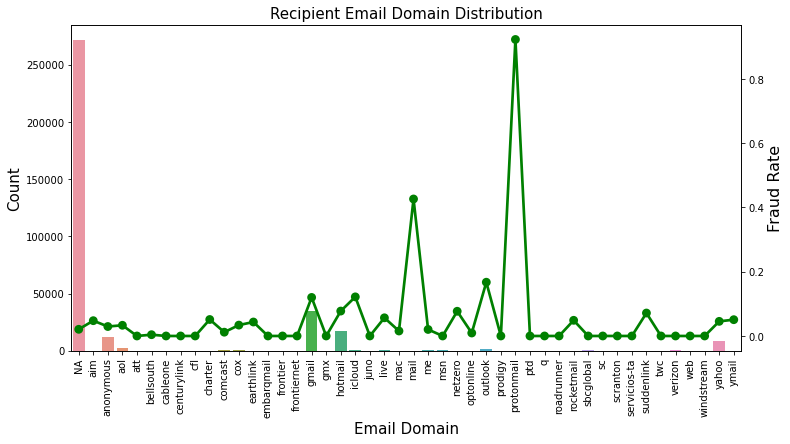

In [17]:
train["R_parent_emaildomain"] = train["R_emaildomain"].str.split('.', expand = True)[[0]]
train["R_parent_emaildomain"].fillna("NA", inplace=True)
test["R_parent_emaildomain"] = test["R_emaildomain"].str.split('.', expand = True)[[0]]
test["R_parent_emaildomain"].fillna("NA", inplace=True)

R_emaildomain_fraud_rate = train.groupby('R_parent_emaildomain')['isFraud'].value_counts(normalize = True).unstack().fillna(0)[1]

plt.figure(figsize=(12,6))

g = sns.countplot(x = 'R_parent_emaildomain', data = train, order = R_emaildomain_fraud_rate.index)
g.set_title('Recipient Email Domain Distribution', fontsize = 15)
g.set_xlabel("Email Domain", fontsize=15)
g.set_ylabel("Count", fontsize=15)
plt.xticks(rotation= "vertical")

r = g.twinx()
r = sns.pointplot(x = R_emaildomain_fraud_rate.index, y = R_emaildomain_fraud_rate, color = "green")
r.set_ylabel("Fraud Rate", fontsize = 16, color = "black")


In [18]:
del(train["R_emaildomain"])
del(test["R_emaildomain"])

In R_emaildomain also protonmail gives 80% above fraud rate. So we can conclude that chances of fraud is more if emaildomain is protonmail.

## Analyzing C1 to C14 Columns

Columns C1 to C4 store counting, such as how many addresses are found to be associated with payment card etc.

In [597]:
c_cols = [c for c in train if c[0] == 'C']
train[c_cols].head()

,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14
0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0
1,2.0,5.0,0.0,0.0,0.0,4.0,0.0,0.0,1.0,0.0,1.0,0.0,25.0,1.0
2,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0
3,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0
4,1.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0


In [598]:
print(train[c_cols].isnull().sum(axis = 0))

C1     0
C2     0
C3     0
C4     0
C5     0
C6     0
C7     0
C8     0
C9     0
C10    0
C11    0
C12    0
C13    0
C14    0
dtype: int64


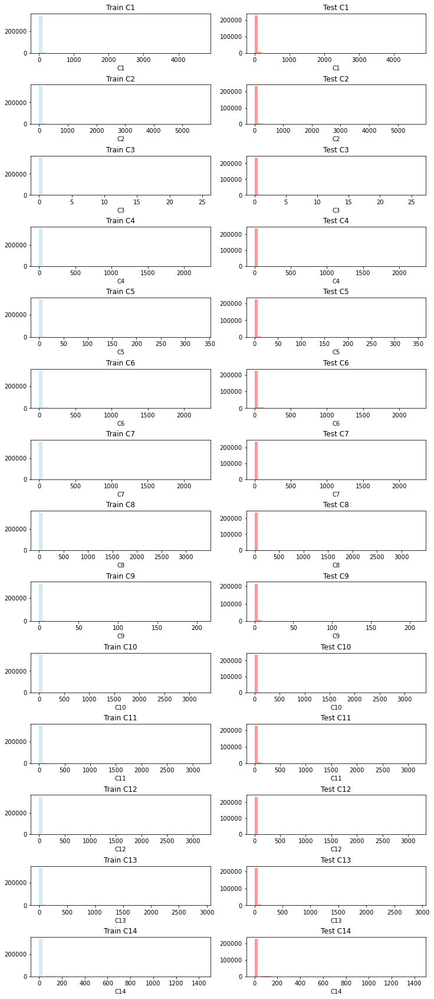

In [599]:
plt.figure(figsize=(12,30))

i = 1
for col in c_cols:
    plt.subplot(14,2,i)
    sns.distplot(train[col],color = 'skyblue',kde = False)
    plt.title('Train '+ col)
    i += 1
    plt.subplot(14,2,i)
    sns.distplot(test[col],color = 'red',kde = False)
    plt.title('Test '+ col)
    i += 1
plt.subplots_adjust(hspace = 0.8)
plt.show()

We have built a decribe function which is used to describe features for test , train with fraud and without fraud.

In [600]:
def describe(datatrain,datatest,feature):
    d = pd.DataFrame(columns=[feature,'Train','TrainFraud','TrainLegit','Test'])
    d[feature] = ['count','mean','std','min','25%','50%','75%','max','unique','NaN','NaNshare']
    for i in range(0,8):
        d['Train'].iloc[i] = datatrain[feature].describe().iloc[i]
        d['TrainFraud'].iloc[i]=datatrain[datatrain['isFraud']==1][feature].describe().iloc[i]
        d['TrainLegit'].iloc[i]=datatrain[datatrain['isFraud']==0][feature].describe().iloc[i]
        d['Test'].iloc[i]=datatest[feature].describe().iloc[i]
    d['Train'].iloc[8] = len(datatrain[feature].unique())
    d['TrainFraud'].iloc[8]=len(datatrain[datatrain['isFraud']==1][feature].unique())
    d['TrainLegit'].iloc[8]=len(datatrain[datatrain['isFraud']==0][feature].unique())
    d['Test'].iloc[8]=len(datatest[feature].unique())
    d['Train'].iloc[9] = datatrain[feature].isnull().sum()
    d['TrainFraud'].iloc[9] = datatrain[datatrain['isFraud']==1][feature].isnull().sum()
    d['TrainLegit'].iloc[9] = datatrain[datatrain['isFraud']==0][feature].isnull().sum()
    d['Test'].iloc[9]=datatest[feature].isnull().sum()
    d['Train'].iloc[10] = datatrain[feature].isnull().sum()/len(datatrain)
    d['TrainFraud'].iloc[10] = datatrain[datatrain['isFraud']==1][feature].isnull().sum()/len(datatrain[datatrain['isFraud']==1])
    d['TrainLegit'].iloc[10] = datatrain[datatrain['isFraud']==0][feature].isnull().sum()/len(datatrain[datatrain['isFraud']==0])
    d['Test'].iloc[10]=datatest[feature].isnull().sum()/len(datatest)
    return d

In [601]:
c1Des = describe(train,test,'C1')
c1Des

,C1,Train,TrainFraud,TrainLegit,Test
0,count,354324,12459,341865,236216
1,mean,14.2322,36.5254,13.4197,13.8829
2,std,134.676,248.238,128.586,131.891
3,min,0,0,0,0
4,25%,1,1,1,1
5,50%,1,2,1,1
6,75%,3,6,3,3
7,max,4685,4682,4685,4684
8,unique,1266,397,1167,981
9,NaN,0,0,0,0


75% of values lies between 3 then in increases drastically. Now we will visulaize this to detect outliers.

Text(0.5, 1.0, 'C1 Test')

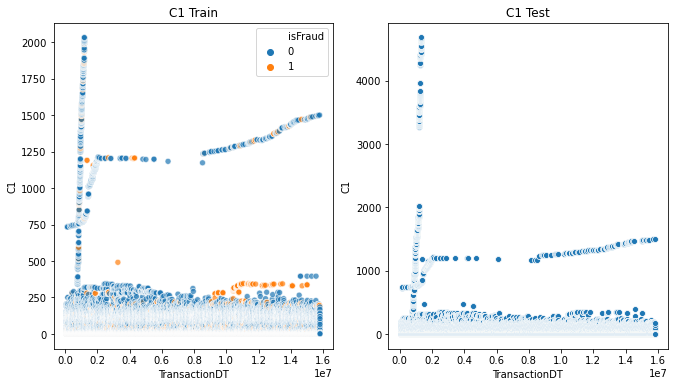

In [17]:
plt.figure(figsize=(11,6))
plt.subplot(1,2,1)
sns.scatterplot(x="TransactionDT",y="C1",hue="isFraud",data=train,alpha=0.7,hue_order=[0,1])
plt.title('C1 Train')
plt.subplot(1,2,2)
sns.scatterplot(x="TransactionDT",y="C1",data=test)
plt.title('C1 Test')

We can see that till 2000 it is okay but after that it goes above 3000.

In [603]:
c2Des = describe(train,test,'C2')
c2Des

,C2,Train,TrainFraud,TrainLegit,Test
0,count,354324,12459,341865,236216
1,mean,15.4292,46.7554,14.2875,15.0306
2,std,155.89,293.553,148.358,152.819
3,min,0,0,0,0
4,25%,1,1,1,1
5,50%,1,2,1,1
6,75%,3,7,3,3
7,max,5691,5690,5691,5691
8,unique,1028,466,896,848
9,NaN,0,0,0,0


Like C1 in C2 also 75% values are between 3. Lets see outliers.

Text(0.5, 1.0, 'C2 Test')

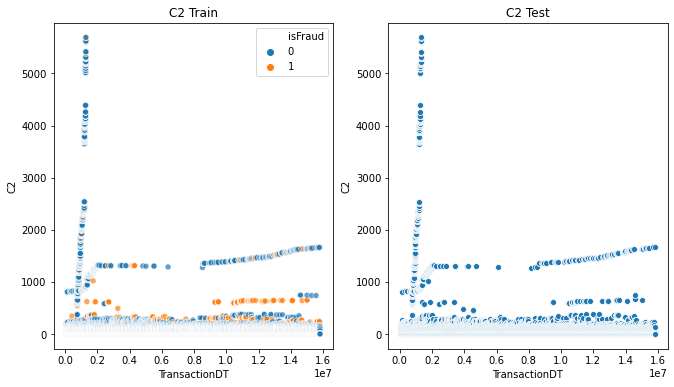

In [604]:
plt.figure(figsize=(11,6))
plt.subplot(1,2,1)
sns.scatterplot(x="TransactionDT",y="C2",hue="isFraud",data=train,alpha=0.7,hue_order=[0,1])
plt.title('C2 Train')
plt.subplot(1,2,2)
sns.scatterplot(x="TransactionDT",y="C2",data=test[~test['C2'].isnull()])
plt.title('C2 Test')

Both train and test data have outliers. So we will remove values above 2000.

In [605]:
c3Des = describe(train,test,'C3')
c3Des

,C3,Train,TrainFraud,TrainLegit,Test
0,count,354324,12459,341865,236216
1,mean,0.00579695,0.00024079,0.00599944,0.00541454
2,std,0.153071,0.0155162,0.155804,0.14665
3,min,0,0,0,0
4,25%,0,0,0,0
5,50%,0,0,0,0
6,75%,0,0,0,0
7,max,25,1,25,26
8,unique,21,2,21,17
9,NaN,0,0,0,0


75% of values are 0. TrainFraud contains only two values 0 and 1. So based on C3 we can say that if value > 1 then it is legit Transaction. 

Text(0.5, 1.0, 'C3 Test')

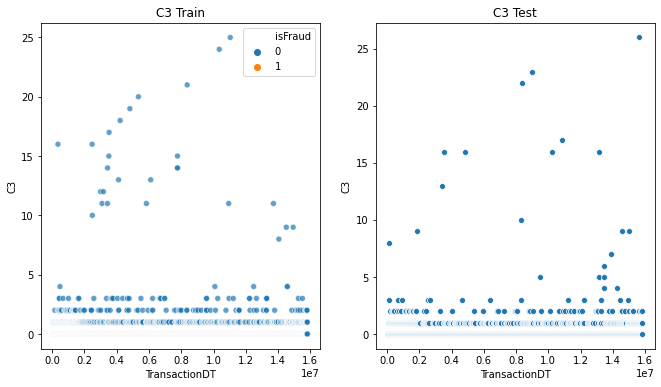

In [606]:
plt.figure(figsize=(11,6))
plt.subplot(1,2,1)
sns.scatterplot(x="TransactionDT",y="C3",hue="isFraud",data=train,alpha=0.7,hue_order=[0,1])
plt.title('C3 Train')
plt.subplot(1,2,2)
sns.scatterplot(x="TransactionDT",y="C3",data=test)
plt.title('C3 Test')

In [ ]:
c4Des = describe(train,test,'C4')
c4Des

75% of values are 0.

Text(0.5, 1.0, 'C4 Test')

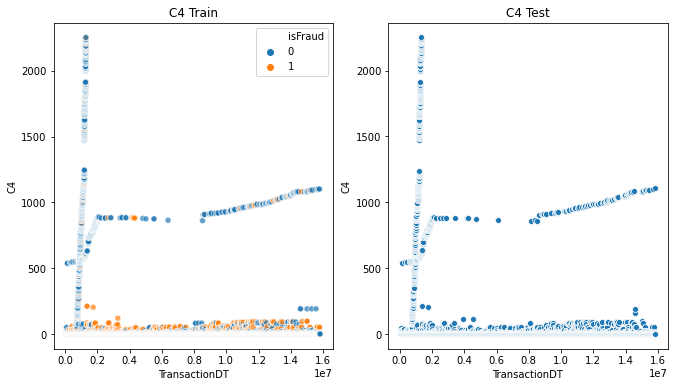

In [608]:
plt.figure(figsize=(11,6))
plt.subplot(1,2,1)
sns.scatterplot(x="TransactionDT",y="C4",hue="isFraud",data=train,alpha=0.7,hue_order=[0,1])
plt.title('C4 Train')
plt.subplot(1,2,2)
sns.scatterplot(x="TransactionDT",y="C4",data=test)
plt.title('C4 Test')

In [609]:
c5Des = describe(train,test,'C5')
c5Des

,C5,Train,TrainFraud,TrainLegit,Test
0,count,354324,12459,341865,236216
1,mean,5.5934,1.41504,5.74568,5.53871
2,std,25.8557,12.8886,26.1948,25.6835
3,min,0,0,0,0
4,25%,0,0,0,0
5,50%,0,0,0,0
6,75%,1,0,1,1
7,max,335,269,335,349
8,unique,310,100,310,306
9,NaN,0,0,0,0


Text(0.5, 1.0, 'C5 Test')

C:\Users\shivam\anaconda\lib\site-packages\IPython\core\pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


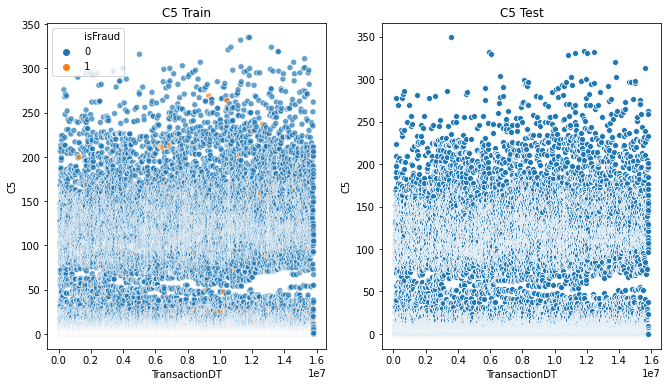

In [610]:
plt.figure(figsize=(11,6))
plt.subplot(1,2,1)
sns.scatterplot(x="TransactionDT",y="C5",hue="isFraud",data=train,alpha=0.7,hue_order=[0,1])
plt.title('C5 Train')
plt.subplot(1,2,2)
sns.scatterplot(x="TransactionDT",y="C5",data=test)
plt.title('C5 Test')

In [611]:
c6Des = describe(train,test,'C6')
c6Des

,C6,Train,TrainFraud,TrainLegit,Test
0,count,354324,12459,341865,236216
1,mean,9.14599,17.3842,8.84575,8.95873
2,std,72.0803,128.481,69.1434,70.6421
3,min,0,0,0,0
4,25%,1,1,1,1
5,50%,1,1,1,1
6,75%,2,3,2,2
7,max,2253,2251,2253,2252
8,unique,1032,225,984,810
9,NaN,0,0,0,0


Text(0.5, 1.0, 'C6 Test')

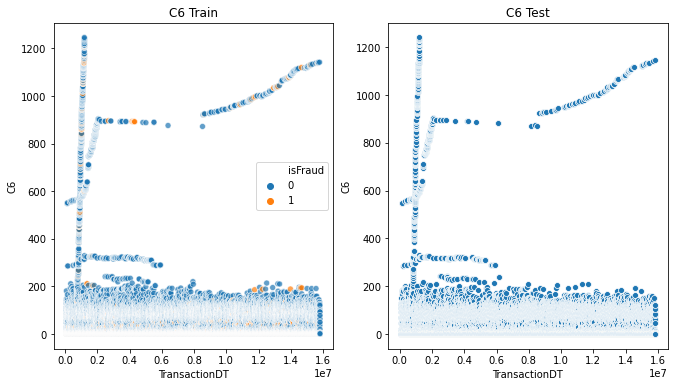

In [26]:
plt.figure(figsize=(11,6))
plt.subplot(1,2,1)
sns.scatterplot(x="TransactionDT",y="C6",hue="isFraud",data=train,alpha=0.7,hue_order=[0,1])
plt.title('C6 Train')
plt.subplot(1,2,2)
sns.scatterplot(x="TransactionDT",y="C6",data=test)
plt.title('C6 Test')

It is almost similar to C4. So these two columns can be related to each other.

In [613]:
c7Des = describe(train,test,'C7')
c7Des

,C7,Train,TrainFraud,TrainLegit,Test
0,count,354324,12459,341865,236216
1,mean,2.8852,12.5053,2.5346,2.7934
2,std,62.1279,118.047,59.0698,61.1215
3,min,0,0,0,0
4,25%,0,0,0,0
5,50%,0,0,0,0
6,75%,0,1,0,0
7,max,2255,2253,2255,2254
8,unique,771,160,695,544
9,NaN,0,0,0,0


Text(0.5, 1.0, 'C7 Test')

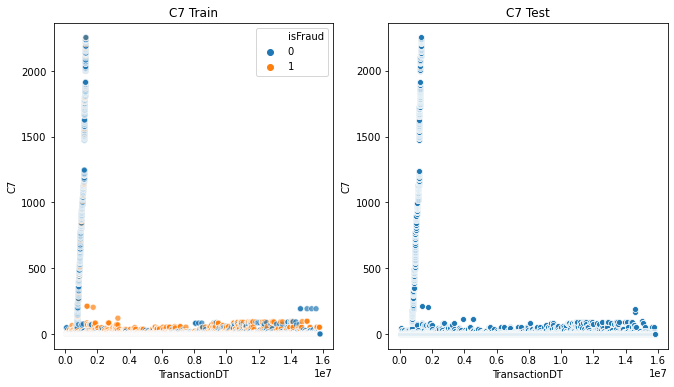

In [614]:
plt.figure(figsize=(11,6))
plt.subplot(1,2,1)
sns.scatterplot(x="TransactionDT",y="C7",hue="isFraud",data=train,alpha=0.7,hue_order=[0,1])
plt.title('C7 Train')
plt.subplot(1,2,2)
sns.scatterplot(x="TransactionDT",y="C7",data=test)
plt.title('C7 Test')

In [615]:
c8Des = describe(train,test,'C8')
c8Des

,C8,Train,TrainFraud,TrainLegit,Test
0,count,354324,12459,341865,236216
1,mean,5.21728,21.9062,4.60907,5.03551
2,std,96.0803,181.196,91.4379,94.3164
3,min,0,0,0,0
4,25%,0,0,0,0
5,50%,0,1,0,0
6,75%,0,2,0,0
7,max,3331,3328,3331,3330
8,unique,916,251,792,693
9,NaN,0,0,0,0


Text(0.5, 1.0, 'C8 Test')

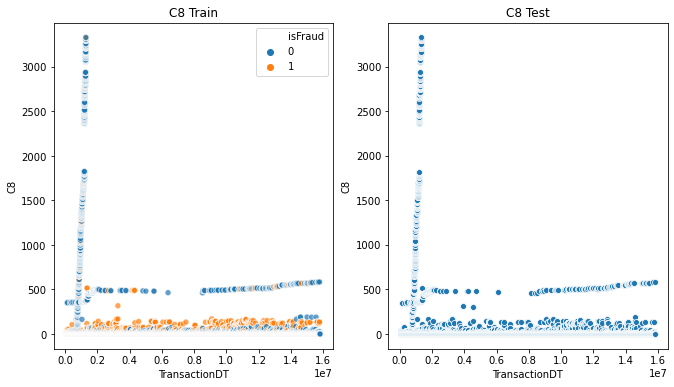

In [616]:
plt.figure(figsize=(11,6))
plt.subplot(1,2,1)
sns.scatterplot(x="TransactionDT",y="C8",hue="isFraud",data=train,alpha=0.7,hue_order=[0,1])
plt.title('C8 Train')
plt.subplot(1,2,2)
sns.scatterplot(x="TransactionDT",y="C8",data=test)
plt.title('C8 Test')

In [617]:
c9Des = describe(train,test,'C9')
c9Des

,C9,Train,TrainFraud,TrainLegit,Test
0,count,354324,12459,341865,236216
1,mean,4.49393,1.73256,4.59457,4.4597
2,std,16.7134,8.68875,16.9257,16.6169
3,min,0,0,0,0
4,25%,0,0,0,0
5,50%,1,0,1,1
6,75%,2,1,2,2
7,max,207,192,207,210
8,unique,200,91,200,200
9,NaN,0,0,0,0


Text(0.5, 1.0, 'C9 Test')

C:\Users\shivam\anaconda\lib\site-packages\IPython\core\pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


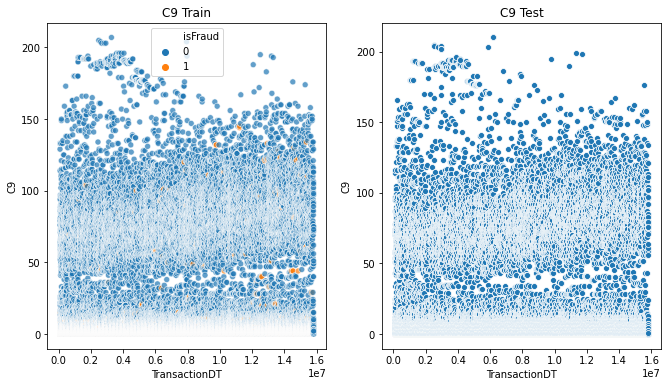

In [618]:
plt.figure(figsize=(11,6))
plt.subplot(1,2,1)
sns.scatterplot(x="TransactionDT",y="C9",hue="isFraud",data=train,alpha=0.7,hue_order=[0,1])
plt.title('C9 Train')
plt.subplot(1,2,2)
sns.scatterplot(x="TransactionDT",y="C9",data=test)
plt.title('C9 Test')

In [619]:
c10Des = describe(train,test,'C10')
c10Des

,C10,Train,TrainFraud,TrainLegit,Test
0,count,354324,12459,341865,236216
1,mean,5.31272,20.2739,4.76747,5.13178
2,std,96.2345,181.545,91.592,94.5934
3,min,0,0,0,0
4,25%,0,0,0,0
5,50%,0,1,0,0
6,75%,0,2,0,0
7,max,3257,3254,3257,3256
8,unique,929,194,870,700
9,NaN,0,0,0,0


Text(0.5, 1.0, 'C10 Test')

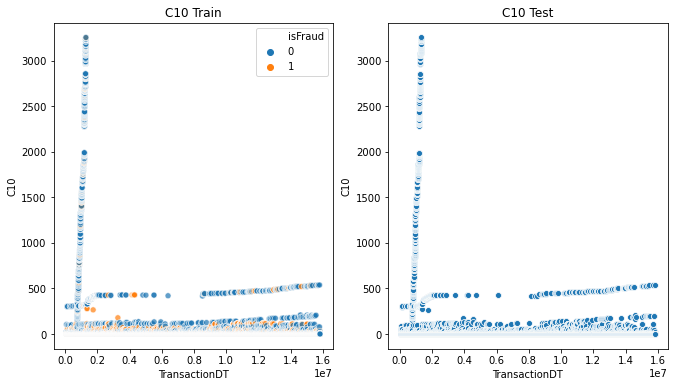

In [620]:
plt.figure(figsize=(11,6))
plt.subplot(1,2,1)
sns.scatterplot(x="TransactionDT",y="C10",hue="isFraud",data=train,alpha=0.7,hue_order=[0,1])
plt.title('C10 Train')
plt.subplot(1,2,2)
sns.scatterplot(x="TransactionDT",y="C10",data=test)
plt.title('C10 Test')

In [621]:
c11Des = describe(train,test,'C11')
c11Des

,C11,Train,TrainFraud,TrainLegit,Test
0,count,354324,12459,341865,236216
1,mean,10.34,24.4711,9.82498,10.0938
2,std,95.0764,174.441,90.8434,93.2151
3,min,0,0,0,0
4,25%,1,1,1,1
5,50%,1,2,1,1
6,75%,2,4,2,2
7,max,3188,3186,3188,3187
8,unique,1128,281,1062,876
9,NaN,0,0,0,0


Text(0.5, 1.0, 'C11 Test')

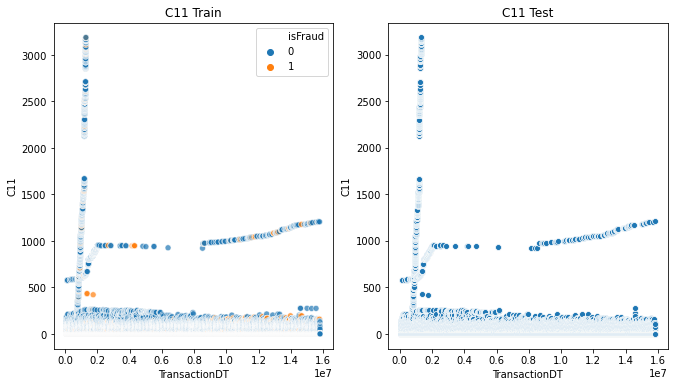

In [622]:
plt.figure(figsize=(11,6))
plt.subplot(1,2,1)
sns.scatterplot(x="TransactionDT",y="C11",hue="isFraud",data=train,alpha=0.7,hue_order=[0,1])
plt.title('C11 Train')
plt.subplot(1,2,2)
sns.scatterplot(x="TransactionDT",y="C11",data=test)
plt.title('C11 Test')

In [623]:
c12Des = describe(train,test,'C12')
c12Des

,C12,Train,TrainFraud,TrainLegit,Test
0,count,354324,12459,341865,236216
1,mean,4.12663,19.2931,3.5739,4.00062
2,std,87.2525,166.144,82.9207,85.7795
3,min,0,0,0,0
4,25%,0,0,0,0
5,50%,0,0,0,0
6,75%,0,2,0,0
7,max,3188,3186,3188,3187
8,unique,854,240,706,618
9,NaN,0,0,0,0


Text(0.5, 1.0, 'C12 Test')

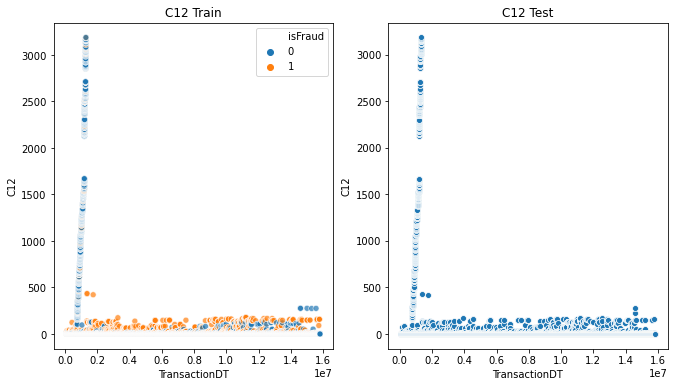

In [624]:
plt.figure(figsize=(11,6))
plt.subplot(1,2,1)
sns.scatterplot(x="TransactionDT",y="C12",hue="isFraud",data=train,alpha=0.7,hue_order=[0,1])
plt.title('C12 Train')
plt.subplot(1,2,2)
sns.scatterplot(x="TransactionDT",y="C12",data=test)
plt.title('C12 Test')

In [625]:
c13Des = describe(train,test,'C13')
c13Des

,C13,Train,TrainFraud,TrainLegit,Test
0,count,354324,12459,341865,236216
1,mean,32.6715,25.6346,32.9279,32.3426
2,std,129.891,169.396,128.214,128.572
3,min,0,0,0,0
4,25%,1,1,1,1
5,50%,3,1,3,3
6,75%,12,6,13,12
7,max,2918,2915,2918,2917
8,unique,1372,310,1341,1215
9,NaN,0,0,0,0


Text(0.5, 1.0, 'C13 Test')

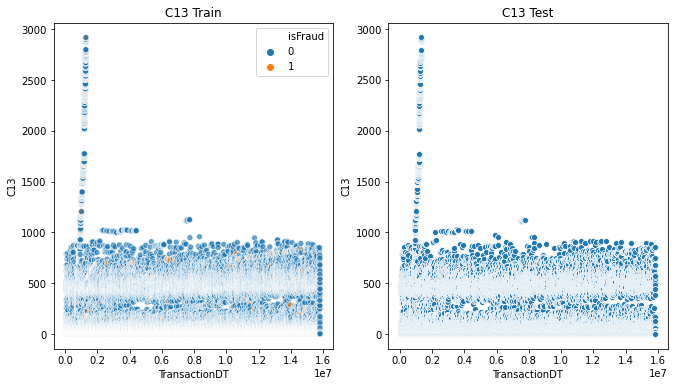

In [626]:
plt.figure(figsize=(11,6))
plt.subplot(1,2,1)
sns.scatterplot(x="TransactionDT",y="C13",hue="isFraud",data=train,alpha=0.7,hue_order=[0,1])
plt.title('C13 Train')
plt.subplot(1,2,2)
sns.scatterplot(x="TransactionDT",y="C13",data=test)
plt.title('C13 Test')

In [627]:
c14Des = describe(train,test,'C14')
c14Des

,C14,Train,TrainFraud,TrainLegit,Test
0,count,354324,12459,341865,236216
1,mean,8.35418,10.6317,8.27118,8.20676
2,std,49.9336,84.2609,48.2214,48.9545
3,min,0,0,0,0
4,25%,1,0,1,1
5,50%,1,1,1,1
6,75%,2,2,2,2
7,max,1429,1426,1429,1428
8,unique,892,189,864,738
9,NaN,0,0,0,0


Text(0.5, 1.0, 'C14 Test')

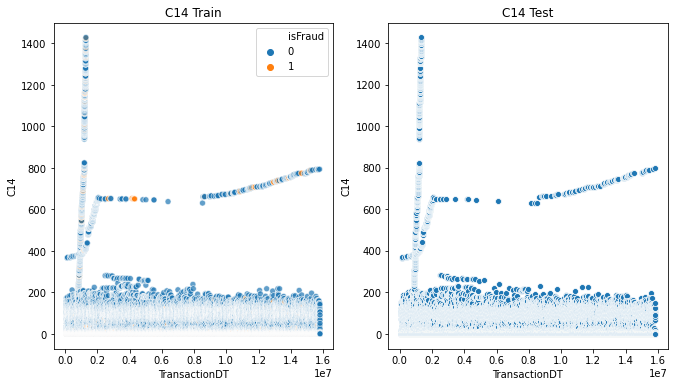

In [628]:
plt.figure(figsize=(11,6))
plt.subplot(1,2,1)
sns.scatterplot(x="TransactionDT",y="C14",hue="isFraud",data=train,alpha=0.7,hue_order=[0,1])
plt.title('C14 Train')
plt.subplot(1,2,2)
sns.scatterplot(x="TransactionDT",y="C14",data=test)
plt.title('C14 Test')

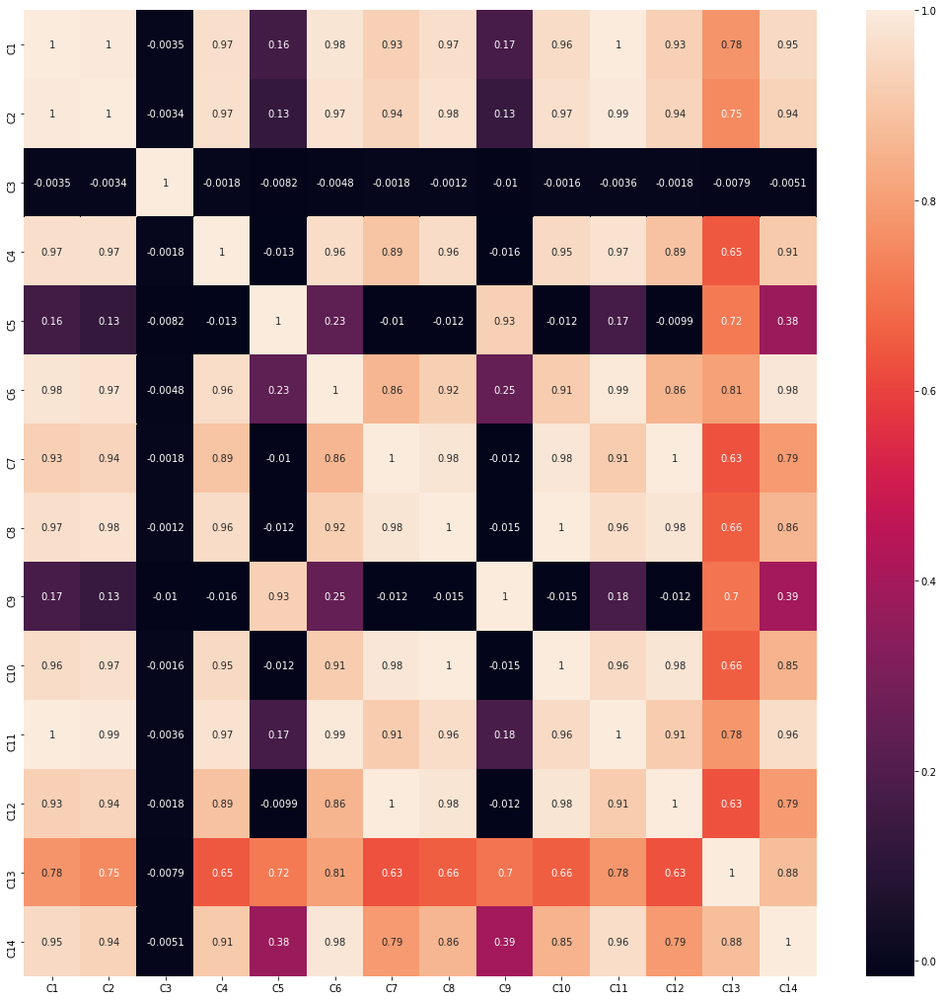

In [629]:
#plotting correlation graph
cor_c = train[['C1', 'C2', 'C3', 'C4', 'C5', 'C6', 'C7', 'C8', 'C9', 'C10', 'C11', 'C12', 'C13', 'C14']]
corre = cor_c.corr()
plt.figure(1,figsize=(18,18))
sns.heatmap(corre,annot=True)

- As we can see from above heatmap there are some highly correlated c columns 
- c1 and c2 and c4 and c6 and c11 and c14 are highly correlated
- c2,c8,c10 are also highly correlated
- we will remove these columns lateron after checking whether they effect model accuracy or not

## Columns M1-M9

- Values are T F or NaN
- Column M4 appears to be different with values like M2 and M0
- match, such as names on card and address, etc.

In [630]:
m_cols = [c for c in train if c[0] == 'M']
train[m_cols].head()

,M1,M2,M3,M4,M5,M6,M7,M8,M9
0,T,T,T,M0,F,F,F,F,F
1,NaN,NaN,NaN,M0,T,F,NaN,NaN,NaN
2,T,T,T,M1,F,T,NaN,NaN,NaN
3,T,T,T,M0,F,F,T,T,T
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


#### lets see the count plots and number of null values

In [631]:
train[m_cols].isnull().sum(axis=0)

M1    162794
M2    162794
M3    162794
M4    168882
M5    210340
M6    101936
M7    207878
M8    207868
M9    207868
dtype: int64

In [632]:
train[m_cols].describe()

,M1,M2,M3,M4,M5,M6,M7,M8,M9
count,191530,191530,191530,185442,143984,252388,146446,146456,146456
unique,2,2,2,3,2,2,2,2,2
top,T,T,T,M0,F,F,F,F,T
freq,191516,171148,150894,117868,79637,136417,126609,93025,123246


#### checking all the count plots

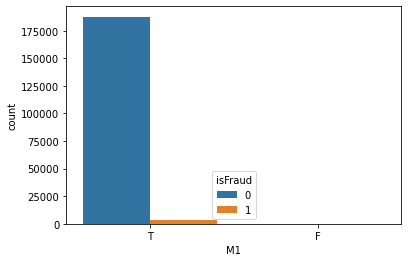

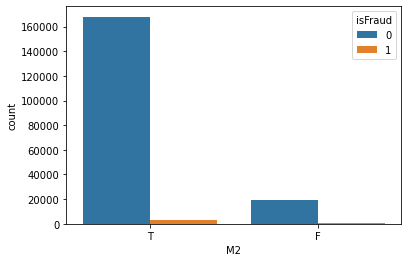

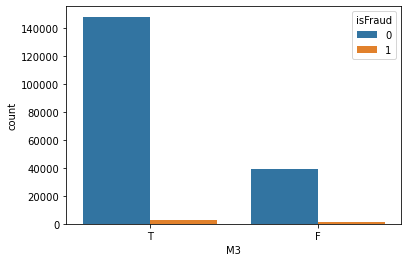

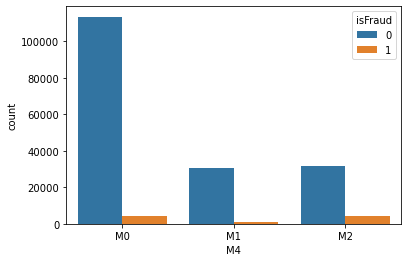

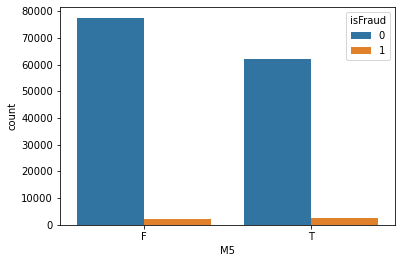

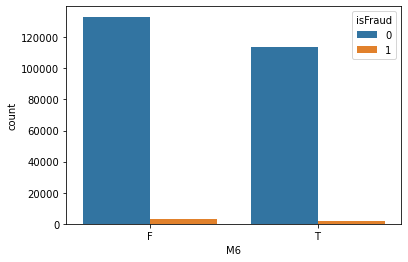

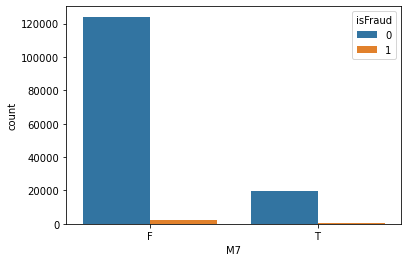

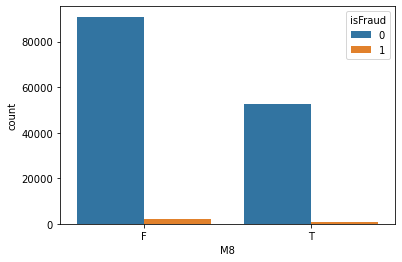

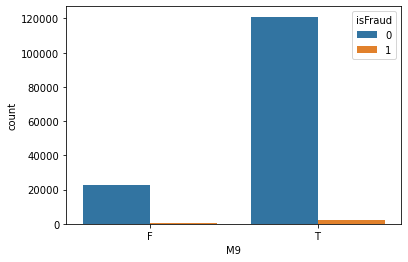

In [633]:
for i in m_cols:
    sns.countplot(train[i],hue=train["isFraud"])
    plt.show()

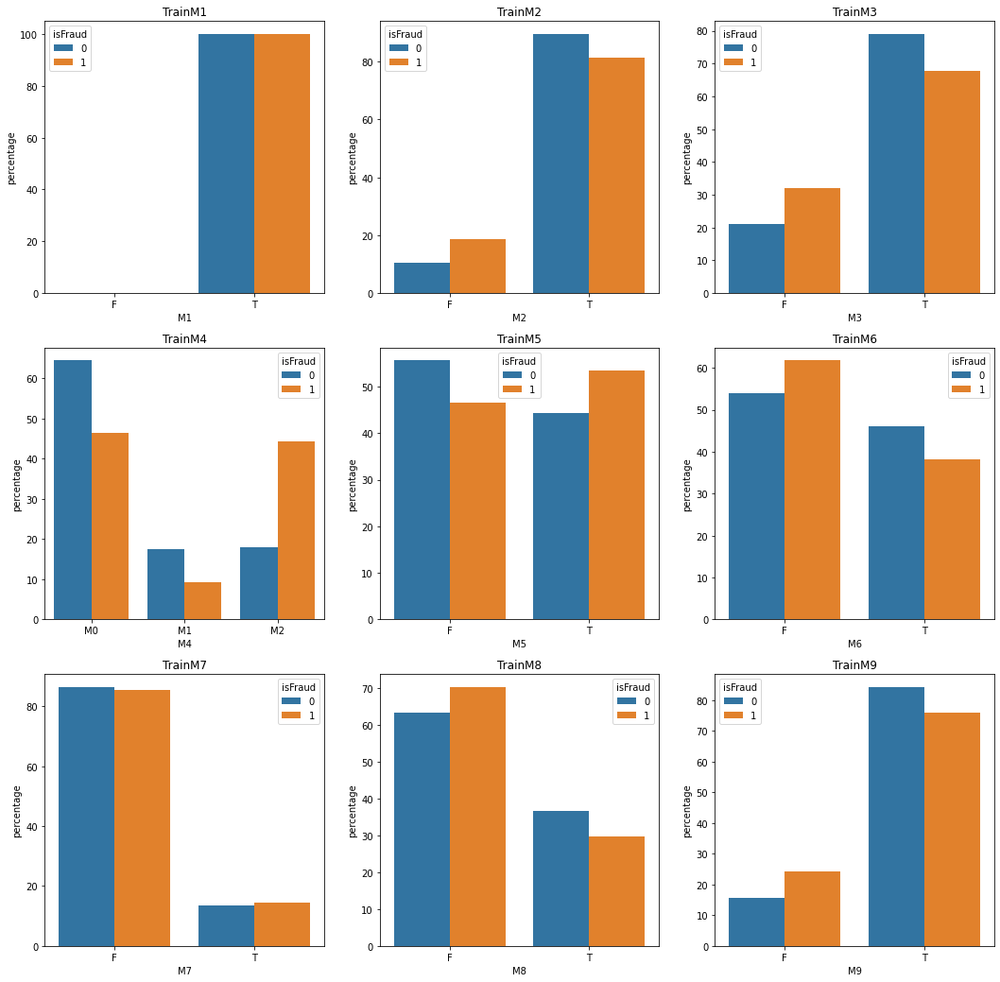

In [634]:
plt.figure(figsize=(18,18))
for i in range(1,10):
    plt.subplot(3,3,i)

    t = (train.groupby(['isFraud'])["M"+str(i)]
                     .value_counts(normalize=True)
                     .rename('percentage')
                     .mul(100)
                     .reset_index()
                     .sort_values("M"+str(i)))
    sns.barplot(x="M"+str(i), y="percentage", hue="isFraud", data=t)
    plt.title("TrainM"+str(i))
    

#### Here we see the different % b/w fraud and non fraud ,for each M col , only M4 is a little interesting , in M4 - value M2 has a high % for fraud

### Analysis of D columns

The first thing to note is they are all timedeltas, in units of days, from the transaction to some other time reference point.

- D1: Timedelta since first transaction for one card
- D2: This appears to be the same as D1, except D1 = 0 values have been replaced by NaN.- 
- D3: Timedelta since the previous transaction for one card.
- D4: Timedelta since first transaction for all cards on the account. 
- D5: Timedelta since the previous transaction for all cards on the account.
- D8: Timedelta since the card was issued and activated.
- D9: It is simply D8 minus its integer part which means  D9 indicates the difference between the time of day when the card was       issue/activated and when it was used in the transaction.



In [37]:
# extracting d columns
d_cols = [c for c in train if c[0] == 'D']
d_cols = d_cols[0:15]
train[d_cols].head(50)

,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15
0,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,0.0,315.0,NaN,NaN,NaN,315.0
1,112.0,112.0,0.0,94.0,0.0,NaN,NaN,NaN,NaN,84.0,NaN,NaN,NaN,NaN,111.0
2,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,0.0
3,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,0.0
4,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,1.0,1.0,0.0,0.0,0.0,0.0,0.0,83.0,0.0,0.0,NaN,0.0,0.0,0.0,0.0
6,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,0.0
7,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,465.0,423.0,NaN,NaN,NaN,0.0
8,0.0,NaN,NaN,NaN,NaN,NaN,NaN,26.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN
9,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,0.0,237.0,NaN,NaN,NaN,0.0


- After viewing D colums we found there are large no of NAN values so lets calcuate the NAN value percentage for each column
- D2 is similar to D1 only Nan value in D2 is replaced by 0 in D1 
- since D1 and D2 are equal almost and D2 contains many null values we can drop D2

In [636]:
for i, col in enumerate(d_cols):
    print(col)
    print(train[col].describe())

D1
count    353540.000000
mean         94.195027
std         157.487640
min           0.000000
25%           0.000000
50%           3.000000
75%         122.000000
max         640.000000
Name: D1, dtype: float64
D2
count    185554.000000
mean        169.469362
std         177.149661
min           0.000000
25%          26.000000
50%          97.000000
75%         276.000000
max         640.000000
Name: D2, dtype: float64
D3
count    196339.000000
mean         28.373512
std          62.597422
min           0.000000
25%           1.000000
50%           8.000000
75%          27.000000
max         819.000000
Name: D3, dtype: float64
D4
count    252581.000000
mean        139.266520
std         190.650426
min        -122.000000
25%           0.000000
50%          25.000000
75%         252.000000
max         869.000000
Name: D4, dtype: float64
D5
count    167985.000000
mean         42.010930
std          88.459911
min           0.000000
25%           1.000000
50%           9.000000
75%        

In [637]:
# checking null value percentage for D columns for test and train data
x = train[['D1','D2','D3','D4','D5','D6','D7','D8','D9','D10','D11','D12','D13','D14','D15']]
y = test[['D1','D2','D3','D4','D5','D6','D7','D8','D9','D10','D11','D12','D13','D14','D15']]
null_var = x.isnull().sum()/x.shape[0] *100
null_var_test = y.isnull().sum()/y.shape[0] *100
print(null_var)
print(null_var_test)

D1      0.221266
D2     47.631546
D3     44.587722
D4     28.714679
D5     52.590002
D6     87.584527
D7     93.397851
D8     87.268715
D9     87.268715
D10    12.940981
D11    47.333514
D12    89.036306
D13    89.488717
D14    89.423522
D15    15.159289
dtype: float64
D1      0.205321
D2     47.425661
D3     44.405544
D4     28.439648
D5     52.283503
D6     87.640126
D7     93.428049
D8     87.377654
D9     87.377654
D10    12.771785
D11    47.233464
D12    89.048159
D13    89.540082
D14    89.538389
D15    14.986284
dtype: float64


C:\Users\shivam\anaconda\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\shivam\anaconda\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\shivam\anaconda\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


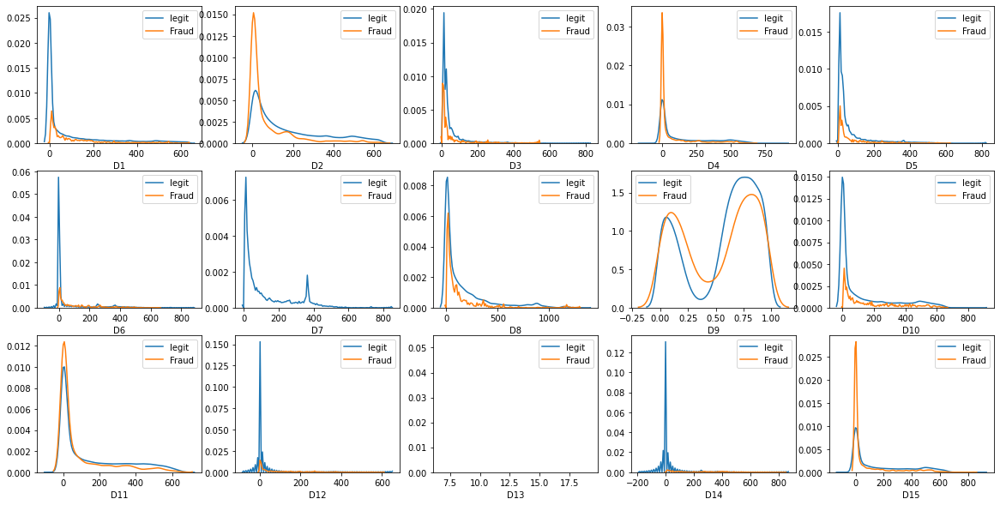

In [638]:
fig, ax = plt.subplots(ncols= 5, nrows= 3, figsize = (20, 10))
ax = ax.ravel()

for i, col in enumerate(d_cols):
    sns.distplot(train[col][train['isFraud'] == 0] ,ax = ax[i], label = 'legit', hist = False)
    sns.distplot(train[col][train['isFraud'] == 1] ,ax = ax[i], label = 'Fraud', hist = False)
    ax[i].set_xlabel(col)


- from above plot we can see some plots have same distribution so there might be good correlation among D columns so we need to   check it
- some D columns have negative values and we know time delay cannot be negative

In [38]:
#calcuating percentage for D columns which conatins -ve values 
for i, col in enumerate(d_cols):
    count = sum(map(lambda x : x<0, train[col]))
    print("train",col,"-ve value perecentage:",count/train.shape[0] *100)
    count = sum(map(lambda x : x<0, test[col]))
    print("test",col,"-ve value perecentage:",count/test.shape[0] *100)

train D1 -ve value perecentage: 0.0
test D1 -ve value perecentage: 0.0
train D2 -ve value perecentage: 0.0
test D2 -ve value perecentage: 0.0
train D3 -ve value perecentage: 0.0
test D3 -ve value perecentage: 0.0
train D4 -ve value perecentage: 0.0
test D4 -ve value perecentage: 0.0
train D5 -ve value perecentage: 0.0
test D5 -ve value perecentage: 0.0
train D6 -ve value perecentage: 0.0
test D6 -ve value perecentage: 0.0
train D7 -ve value perecentage: 0.0
test D7 -ve value perecentage: 0.0
train D8 -ve value perecentage: 0.0
test D8 -ve value perecentage: 0.0
train D9 -ve value perecentage: 0.0
test D9 -ve value perecentage: 0.0
train D10 -ve value perecentage: 0.0
test D10 -ve value perecentage: 0.0
train D11 -ve value perecentage: 0.0
test D11 -ve value perecentage: 0.0
train D12 -ve value perecentage: 0.0
test D12 -ve value perecentage: 0.0
train D13 -ve value perecentage: 0.0
test D13 -ve value perecentage: 0.0
train D14 -ve value perecentage: 0.0
test D14 -ve value perecentage: 

In [36]:
replaceoutliers_less('D4',0)
replaceoutliers_less('D6',0)
replaceoutliers_less('D11',0)
replaceoutliers_less('D12',0)
replaceoutliers_less('D14',0)
replaceoutliers_less('D15',0)

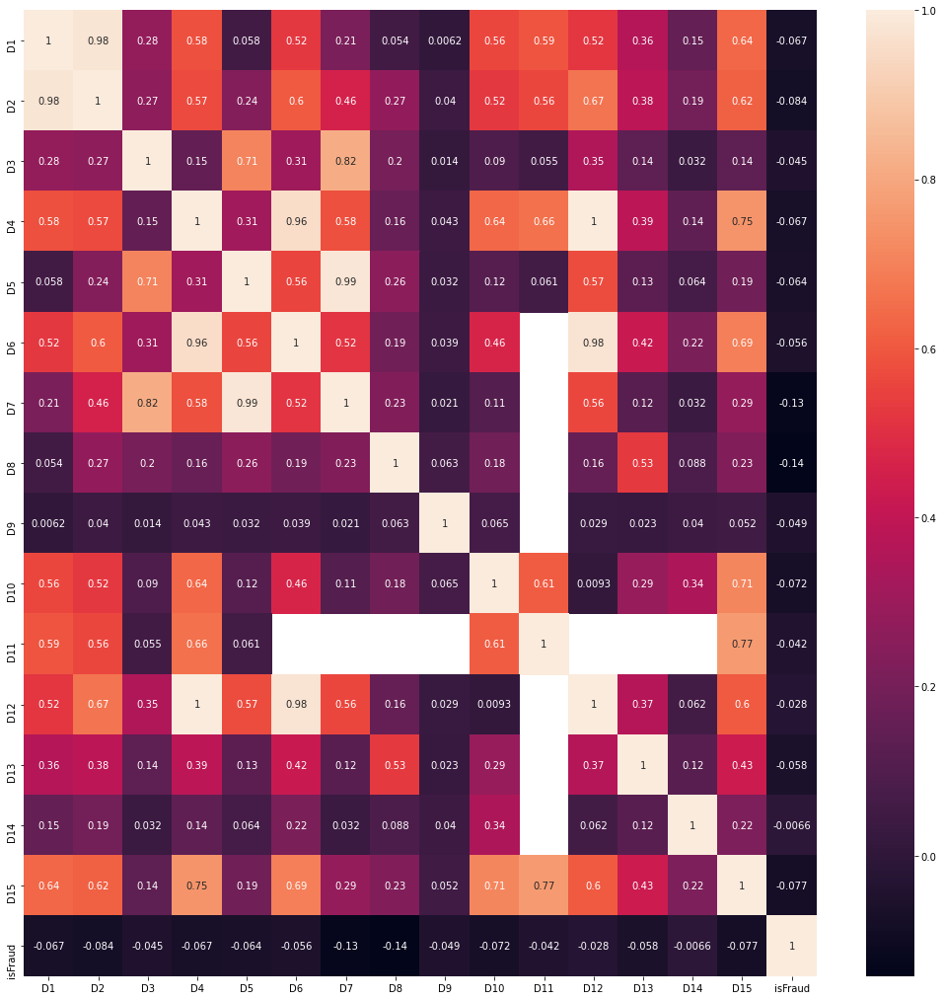

In [640]:
cor_c = train[['D1','D2','D3','D4','D5','D6','D7','D8','D9','D10','D11','D12','D13','D14','D15','isFraud']]
correlation = cor_c.corr()
plt.figure(1,figsize=(18,18))
sns.heatmap(correlation,annot=True)

- From above plot we see there are some highly correlated D columns like D4 and D12 and D6 , D5 and D7 , D1,D2
- we can drop columns d2,d6,d7,d12 since these columns can be derived from other columns

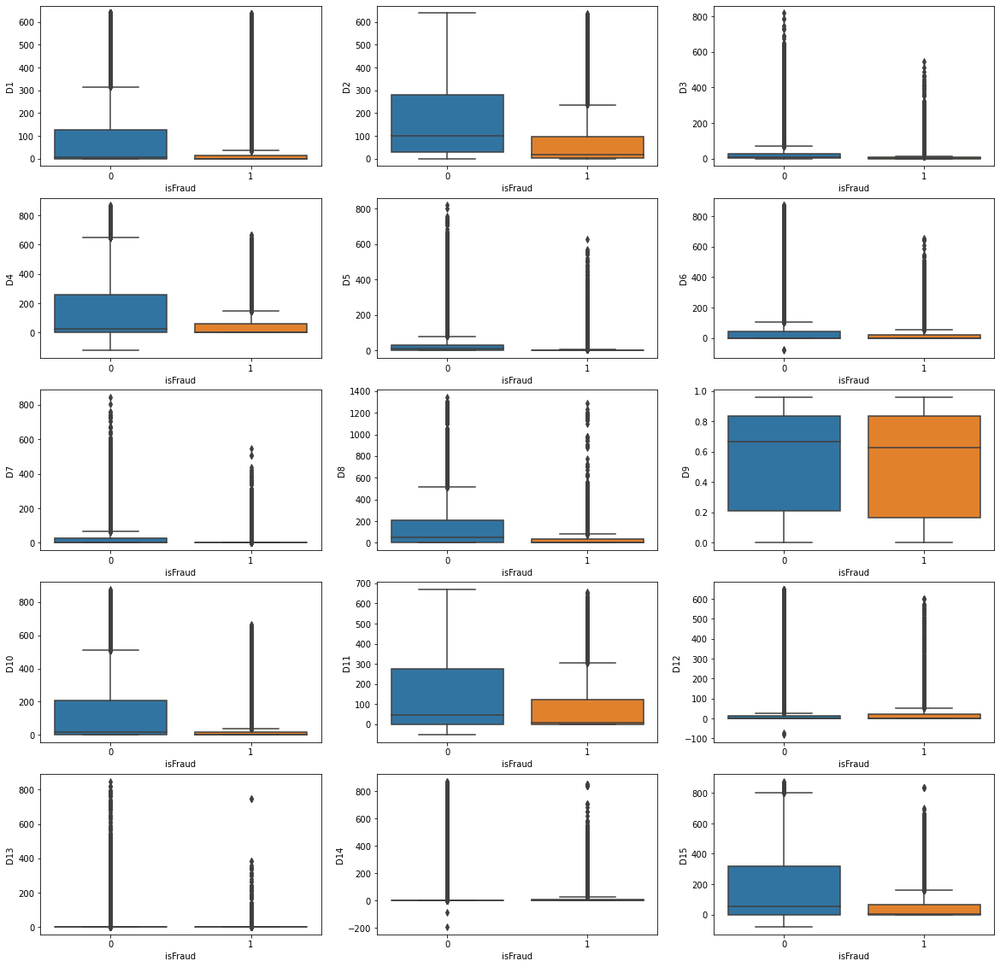

In [641]:
# using boxplot we can check outliers and how values are distributed
plt.figure(figsize = (20, 20))

for i, col in enumerate(d_cols):
    plt.subplot(5, 3, i+1)
    sns.boxplot(x = "isFraud", y = col, data = train)
    ax[i].set_xlabel(col)


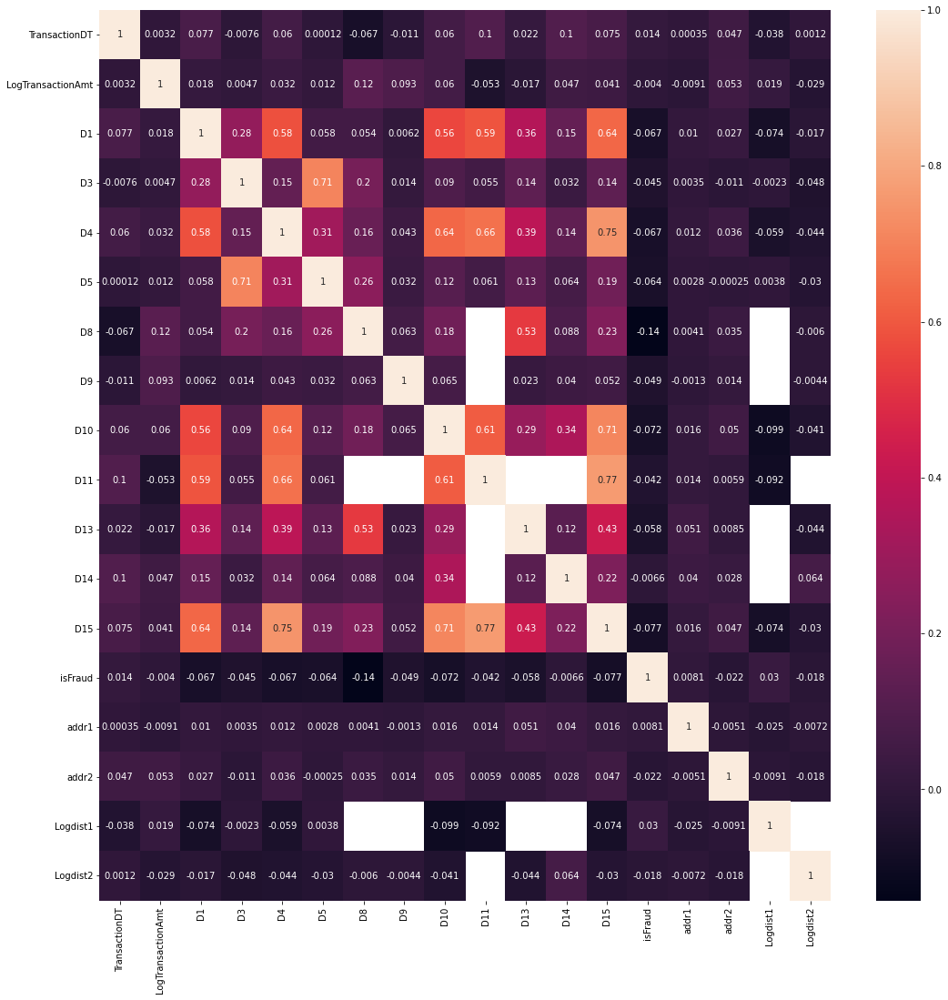

In [642]:
# checking correlation bw different numerical columns
cor_c = train[['TransactionDT','LogTransactionAmt','D1','D3','D4','D5','D8','D9','D10','D11','D13','D14','D15','isFraud','addr1','addr2','Logdist1','Logdist2']]
corre = cor_c.corr()
plt.figure(1,figsize=(18,18))
sns.heatmap(corre,annot=True)

### Analysis of v features

In [19]:
# extracting V columns
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
v_cols = [c for c in train if c[0] == 'V']
train[v_cols].head(50)

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29,V30,V31,V32,V33,V34,V35,V36,V37,V38,V39,V40,V41,V42,V43,V44,V45,V46,V47,V48,V49,V50,V51,V52,V53,V54,V55,V56,V57,V58,V59,V60,V61,V62,V63,V64,V65,V66,V67,V68,V69,V70,V71,V72,V73,V74,V75,V76,V77,V78,V79,V80,V81,V82,V83,V84,V85,V86,V87,V88,V89,V90,V91,V92,V93,V94,V95,V96,V97,V98,V99,V100,V101,V102,V103,V104,V105,V106,V107,V108,V109,V110,V111,V112,V113,V114,V115,V116,V117,V118,V119,V120,V121,V122,V123,V124,V125,V126,V127,V128,V129,V130,V131,V132,V133,V134,V135,V136,V137,V138,V139,V140,V141,V142,V143,V144,V145,V146,V147,V148,V149,V150,V151,V152,V153,V154,V155,V156,V157,V158,V159,V160,V161,V162,V163,V164,V165,V166,V167,V168,V169,V170,V171,V172,V173,V174,V175,V176,V177,V178,V179,V180,V181,V182,V183,V184,V185,V186,V187,V188,V189,V190,V191,V192,V193,V194,V195,V196,V197,V198,V199,V200,V201,V202,V203,V204,V205,V206,V207,V208,V209,V210,V211,V212,V213,V214,V215,V216,V217,V218,V219,V220,V221,V222,V223,V224,V225,V226,V227,V228,V229,V230,V231,V232,V233,V234,V235,V236,V237,V238,V239,V240,V241,V242,V243,V244,V245,V246,V247,V248,V249,V250,V251,V252,V253,V254,V255,V256,V257,V258,V259,V260,V261,V262,V263,V264,V265,V266,V267,V268,V269,V270,V271,V272,V273,V274,V275,V276,V277,V278,V279,V280,V281,V282,V283,V284,V285,V286,V287,V288,V289,V290,V291,V292,V293,V294,V295,V296,V297,V298,V299,V300,V301,V302,V303,V304,V305,V306,V307,V308,V309,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321,V322,V323,V324,V325,V326,V327,V328,V329,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339
0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,48.0,28.0,0.0,10.0,4.0,1.0,38.0,24.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,50.000000,1758.000000,925.000000,0.000000,354.000000,135.000000,50.0,1404.000000,790.000000,0.0,0.000000,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

In [644]:
train[v_cols].describe()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,V29,V30,V31,V32,V33,V34,V35,V36,V37,V38,V39,V40,V41,V42,V43,V44,V45,V46,V47,V48,V49,V50,V51,V52,V53,V54,V55,V56,V57,V58,V59,V60,V61,V62,V63,V64,V65,V66,V67,V68,V69,V70,V71,V72,V73,V74,V75,V76,V77,V78,V79,V80,V81,V82,V83,V84,V85,V86,V87,V88,V89,V90,V91,V92,V93,V94,V95,V96,V97,V98,V99,V100,V101,V102,V103,V104,V105,V106,V107,V108,V109,V110,V111,V112,V113,V114,V115,V116,V117,V118,V119,V120,V121,V122,V123,V124,V125,V126,V127,V128,V129,V130,V131,V132,V133,V134,V135,V136,V137,V138,V139,V140,V141,V142,V143,V144,V145,V146,V147,V148,V149,V150,V151,V152,V153,V154,V155,V156,V157,V158,V159,V160,V161,V162,V163,V164,V165,V166,V167,V168,V169,V170,V171,V172,V173,V174,V175,V176,V177,V178,V179,V180,V181,V182,V183,V184,V185,V186,V187,V188,V189,V190,V191,V192,V193,V194,V195,V196,V197,V198,V199,V200,V201,V202,V203,V204,V205,V206,V207,V208,V209,V210,V211,V212,V213,V214,V215,V216,V217,V218,V219,V220,V221,V222,V223,V224,V225,V226,V227,V228,V229,V230,V231,V232,V233,V234,V235,V236,V237,V238,V239,V240,V241,V242,V243,V244,V245,V246,V247,V248,V249,V250,V251,V252,V253,V254,V255,V256,V257,V258,V259,V260,V261,V262,V263,V264,V265,V266,V267,V268,V269,V270,V271,V272,V273,V274,V275,V276,V277,V278,V279,V280,V281,V282,V283,V284,V285,V286,V287,V288,V289,V290,V291,V292,V293,V294,V295,V296,V297,V298,V299,V300,V301,V302,V303,V304,V305,V306,V307,V308,V309,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321,V322,V323,V324,V325,V326,V327,V328,V329,V330,V331,V332,V333,V334,V335,V336,V337,V338,V339
count,186610.000000,186610.000000,186610.000000,186610.000000,186610.000000,186610.000000,186610.000000,186610.000000,186610.000000,186610.000000,186610.000000,308446.000000,308446.000000,308446.000000,308446.000000,308446.000000,308446.000000,308446.000000,308446.000000,308446.000000,308446.000000,308446.000000,308446.000000,308446.000000,308446.000000,308446.000000,308446.000000,308446.000000,308446.000000,308446.00000,308446.000000,308446.000000,308446.000000,308446.000000,252550.000000,252550.000000,252550.000000,252550.000000,252550.000000,252550.000000,252550.000000,252550.000000,252550.000000,252550.000000,252550.000000,252550.000000,252550.000000,252550.000000,252550.000000,252550.000000,252550.00000,252550.000000,307811.000000,307811.000000,307811.000000,307811.000000,307811.000000,307811.000000,307811.000000,307811.000000,307811.000000,307811.00000,307811.000000,307811.000000,307811.000000,307811.000000,307811.000000,307811.000000,307811.000000,307811.000000,307811.000000,307811.000000,307811.000000,307811.000000,300581.000000,300581.000000,300581.000000,300581.000000,300581.000000,300581.000000,300581.000000,300581.000000,300581.000000,300581.000000,300581.000000,300581.000000,300581.000000,300581.000000,300581.000000,300581.000000,300581.000000,300581.000000,300581.000000,300581.000000,354134.000000,354134.000000,354134.000000,354134.000000,354134.000000,354134.000000,354134.000000,354134.000000,354134.000000,354134.000000,354134.000000,354134.000000,354134.000000,354134.000000,354134.000000,354134.000000,354134.000000,354134.000000,354134.000000,354134.000000,354134.000000,354134.000000,354134.000000,354134.000000,354134.000000,354134.000000,354134.000000,354134.000000,354134.000000,354134.000000,354134.000000,354134.000000,354134.000000,354134.000000,354134.000000,354134.000000,354134.000000,354134.000000,354134.000000,354134.000000,354134.000000,354134.000000,354134.000000,49488.000000,49488.000000,49488.000000,49488.000000,49488.000000,49492.000000,49492.000000,49492.000000,49488.000000,49488.000000,49488.000000,49488.000000,49492.000000,49492.000000,49492.000000,49488.000000,49488.000000,49488.000000,49488.000000,49488.000000,49488.000000,49492.000000,49492.000000,49488.000000,49488.000000,49488.000000,49492.000000,49492.000000,49492.000000,84186.000000,84186.000000,84291.000000,84291.000000,84291.000000,84186.000000,84186.000000,84291.000000,84291.0000

- As we can see  there are 339 v columns and it is very difficult to analyze each and every column.
- V columns have large no of NAN values.

In [20]:
x_pca = train[['V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10', 'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20', 'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'V29', 'V30', 'V31', 'V32', 'V33', 'V34', 'V35', 'V36', 'V37', 'V38', 'V39', 'V40', 'V41', 'V42', 'V43', 'V44', 'V45', 'V46', 'V47', 'V48', 'V49', 'V50', 'V51', 'V52', 'V53', 'V54', 'V55', 'V56', 'V57', 'V58', 'V59', 'V60', 'V61', 'V62', 'V63', 'V64', 'V65', 'V66', 'V67', 'V68', 'V69', 'V70', 'V71', 'V72', 'V73', 'V74', 'V75', 'V76', 'V77', 'V78', 'V79', 'V80', 'V81', 'V82', 'V83', 'V84', 'V85', 'V86', 'V87', 'V88', 'V89', 'V90', 'V91', 'V92', 'V93', 'V94', 'V95', 'V96', 'V97', 'V98', 'V99', 'V100', 'V101', 'V102', 'V103', 'V104', 'V105', 'V106', 'V107', 'V108', 'V109', 'V110', 'V111', 'V112', 'V113', 'V114', 'V115', 'V116', 'V117', 'V118', 'V119', 'V120', 'V121', 'V122', 'V123', 'V124', 'V125', 'V126', 'V127', 'V128', 'V129', 'V130', 'V131', 'V132', 'V133', 'V134', 'V135', 'V136', 'V137', 'V138', 'V139', 'V140', 'V141', 'V142', 'V143', 'V144', 'V145', 'V146', 'V147', 'V148', 'V149', 'V150', 'V151', 'V152', 'V153', 'V154', 'V155', 'V156', 'V157', 'V158', 'V159', 'V160', 'V161', 'V162', 'V163', 'V164', 'V165', 'V166', 'V167', 'V168', 'V169', 'V170', 'V171', 'V172', 'V173', 'V174', 'V175', 'V176', 'V177', 'V178', 'V179', 'V180', 'V181', 'V182', 'V183', 'V184', 'V185', 'V186', 'V187', 'V188', 'V189', 'V190', 'V191', 'V192', 'V193', 'V194', 'V195', 'V196', 'V197', 'V198', 'V199', 'V200', 'V201', 'V202', 'V203', 'V204', 'V205', 'V206', 'V207', 'V208', 'V209', 'V210', 'V211', 'V212', 'V213', 'V214', 'V215', 'V216', 'V217', 'V218', 'V219', 'V220', 'V221', 'V222', 'V223', 'V224', 'V225', 'V226', 'V227', 'V228', 'V229', 'V230', 'V231', 'V232', 'V233', 'V234', 'V235', 'V236', 'V237', 'V238', 'V239', 'V240', 'V241', 'V242', 'V243', 'V244', 'V245', 'V246', 'V247', 'V248', 'V249', 'V250', 'V251', 'V252', 'V253', 'V254', 'V255', 'V256', 'V257', 'V258', 'V259', 'V260', 'V261', 'V262', 'V263', 'V264', 'V265', 'V266', 'V267', 'V268', 'V269', 'V270', 'V271', 'V272', 'V273', 'V274', 'V275', 'V276', 'V277', 'V278', 'V279', 'V280', 'V281', 'V282', 'V283', 'V284', 'V285', 'V286', 'V287', 'V288', 'V289', 'V290', 'V291', 'V292', 'V293', 'V294', 'V295', 'V296', 'V297', 'V298', 'V299', 'V300', 'V301', 'V302', 'V303', 'V304', 'V305', 'V306', 'V307', 'V308', 'V309', 'V310', 'V311', 'V312', 'V313', 'V314', 'V315', 'V316', 'V317', 'V318', 'V319', 'V320', 'V321', 'V322', 'V323', 'V324', 'V325', 'V326', 'V327', 'V328', 'V329', 'V330', 'V331', 'V332', 'V333', 'V334', 'V335', 'V336', 'V337', 'V338', 'V339','isFraud']]
y_pca = test[['V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10', 'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20', 'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'V29', 'V30', 'V31', 'V32', 'V33', 'V34', 'V35', 'V36', 'V37', 'V38', 'V39', 'V40', 'V41', 'V42', 'V43', 'V44', 'V45', 'V46', 'V47', 'V48', 'V49', 'V50', 'V51', 'V52', 'V53', 'V54', 'V55', 'V56', 'V57', 'V58', 'V59', 'V60', 'V61', 'V62', 'V63', 'V64', 'V65', 'V66', 'V67', 'V68', 'V69', 'V70', 'V71', 'V72', 'V73', 'V74', 'V75', 'V76', 'V77', 'V78', 'V79', 'V80', 'V81', 'V82', 'V83', 'V84', 'V85', 'V86', 'V87', 'V88', 'V89', 'V90', 'V91', 'V92', 'V93', 'V94', 'V95', 'V96', 'V97', 'V98', 'V99', 'V100', 'V101', 'V102', 'V103', 'V104', 'V105', 'V106', 'V107', 'V108', 'V109', 'V110', 'V111', 'V112', 'V113', 'V114', 'V115', 'V116', 'V117', 'V118', 'V119', 'V120', 'V121', 'V122', 'V123', 'V124', 'V125', 'V126', 'V127', 'V128', 'V129', 'V130', 'V131', 'V132', 'V133', 'V134', 'V135', 'V136', 'V137', 'V138', 'V139', 'V140', 'V141', 'V142', 'V143', 'V144', 'V145', 'V146', 'V147', 'V148', 'V149', 'V150', 'V151', 'V152', 'V153', 'V154', 'V155', 'V156', 'V157', 'V158', 'V159', 'V160', 'V161', 'V162', 'V163', 'V164', 'V165', 'V166', 'V167', 'V168', 'V169', 'V170', 'V171', 'V172', 'V173', 'V174', 'V175', 'V176', 'V177', 'V178', 'V179', 'V180', 'V181', 'V182', 'V183', 'V184', 'V185', 'V186', 'V187', 'V188', 'V189', 'V190', 'V191', 'V192', 'V193', 'V194', 'V195', 'V196', 'V197', 'V198', 'V199', 'V200', 'V201', 'V202', 'V203', 'V204', 'V205', 'V206', 'V207', 'V208', 'V209', 'V210', 'V211', 'V212', 'V213', 'V214', 'V215', 'V216', 'V217', 'V218', 'V219', 'V220', 'V221', 'V222', 'V223', 'V224', 'V225', 'V226', 'V227', 'V228', 'V229', 'V230', 'V231', 'V232', 'V233', 'V234', 'V235', 'V236', 'V237', 'V238', 'V239', 'V240', 'V241', 'V242', 'V243', 'V244', 'V245', 'V246', 'V247', 'V248', 'V249', 'V250', 'V251', 'V252', 'V253', 'V254', 'V255', 'V256', 'V257', 'V258', 'V259', 'V260', 'V261', 'V262', 'V263', 'V264', 'V265', 'V266', 'V267', 'V268', 'V269', 'V270', 'V271', 'V272', 'V273', 'V274', 'V275', 'V276', 'V277', 'V278', 'V279', 'V280', 'V281', 'V282', 'V283', 'V284', 'V285', 'V286', 'V287', 'V288', 'V289', 'V290', 'V291', 'V292', 'V293', 'V294', 'V295', 'V296', 'V297', 'V298', 'V299', 'V300', 'V301', 'V302', 'V303', 'V304', 'V305', 'V306', 'V307', 'V308', 'V309', 'V310', 'V311', 'V312', 'V313', 'V314', 'V315', 'V316', 'V317', 'V318', 'V319', 'V320', 'V321', 'V322', 'V323', 'V324', 'V325', 'V326', 'V327', 'V328', 'V329', 'V330', 'V331', 'V332', 'V333', 'V334', 'V335', 'V336', 'V337', 'V338', 'V339']]

In [21]:
# calcuating null value percentage for V columns
null_var = x_pca.isnull().sum()/x_pca.shape[0] *100
null_var_test = y_pca.isnull().sum()/y_pca.shape[0] *100
print("Train" ,null_var)
print("\n")
print("Test" ,null_var_test)

Train V1         47.333514
V2         47.333514
V3         47.333514
V4         47.333514
V5         47.333514
V6         47.333514
V7         47.333514
V8         47.333514
V9         47.333514
V10        47.333514
V11        47.333514
V12        12.948036
V13        12.948036
V14        12.948036
V15        12.948036
V16        12.948036
V17        12.948036
V18        12.948036
V19        12.948036
V20        12.948036
V21        12.948036
V22        12.948036
V23        12.948036
V24        12.948036
V25        12.948036
V26        12.948036
V27        12.948036
V28        12.948036
V29        12.948036
V30        12.948036
V31        12.948036
V32        12.948036
V33        12.948036
V34        12.948036
V35        28.723428
V36        28.723428
V37        28.723428
V38        28.723428
V39        28.723428
V40        28.723428
V41        28.723428
V42        28.723428
V43        28.723428
V44        28.723428
V45        28.723428
V46        28.723428
V47        28.723428
V48    

since we can see majority of values in  v columns lies in bw 0 and 1 we can replace NAN values with mean

In [22]:
x_pca.fillna(x_pca.mean(),inplace=True)
y_pca.fillna(y_pca.mean(),inplace=True)

C:\Users\shivam\anaconda\lib\site-packages\pandas\core\generic.py:6245: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._update_inplace(new_data)


Now it is very difficult to analyze all these features so what we can do is check feature importance of v columns and give only that v features to model which is required and can effect accuracy of model

In [23]:
y_train = x_pca['isFraud'].copy()
y_train.shape

(354324,)

In [24]:
X_train = x_pca.drop('isFraud', axis=1)

In [25]:
# spillting the training data into test and train data
from sklearn.model_selection import train_test_split
X_train1, X_test1, y_train1, y_test1 = train_test_split(X_train, y_train, test_size=0.33)
print(X_train1.shape, X_test1.shape, y_train1.shape, y_test1.shape)

(237397, 339) (116927, 339) (237397,) (116927,)


In [26]:
# training classifier with train data and calcuating prediction accuracy
rf = LGBMClassifier()
rf.fit(X_train1,y_train1)
predict_y=rf.predict_proba(X_test1)
print('score:',roc_auc_score(y_test1,predict_y[:,1]))

score: 0.8672544935276738


Now lets see the feature importance of each v features annd eliminate all the v features whose contribution is less

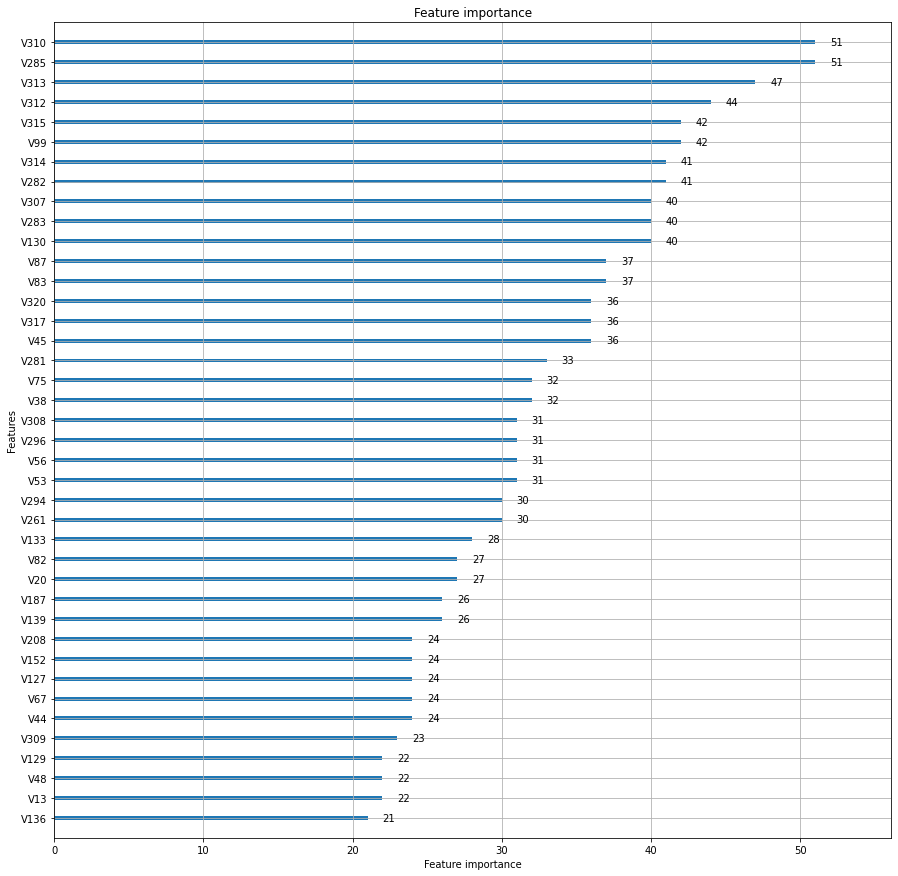

In [27]:
# top 40 V features and their contribution
ax = lgb.plot_importance(rf, max_num_features=40, figsize=(15,15))
plt.show()

In [30]:
# adding features in array whose importance score is 0 or1
g = rf.feature_importances_
j=1
vremove=[]
for i in g:
    if i<3:
        vremove.append('V'+str(j))
    j+=1

In [31]:
# these are the V columns to be dropped 
remove = list(vremove)
remove

['V1',
 'V11',
 'V14',
 'V16',
 'V17',
 'V18',
 'V21',
 'V22',
 'V27',
 'V28',
 'V31',
 'V32',
 'V41',
 'V50',
 'V57',
 'V68',
 'V71',
 'V72',
 'V84',
 'V88',
 'V89',
 'V92',
 'V93',
 'V98',
 'V100',
 'V104',
 'V106',
 'V107',
 'V108',
 'V110',
 'V112',
 'V113',
 'V116',
 'V117',
 'V118',
 'V119',
 'V120',
 'V121',
 'V122',
 'V123',
 'V125',
 'V135',
 'V137',
 'V141',
 'V142',
 'V143',
 'V144',
 'V148',
 'V151',
 'V153',
 'V154',
 'V155',
 'V157',
 'V163',
 'V167',
 'V168',
 'V173',
 'V175',
 'V176',
 'V177',
 'V181',
 'V182',
 'V183',
 'V185',
 'V186',
 'V191',
 'V192',
 'V193',
 'V194',
 'V195',
 'V196',
 'V199',
 'V205',
 'V211',
 'V217',
 'V228',
 'V230',
 'V231',
 'V235',
 'V236',
 'V237',
 'V238',
 'V240',
 'V241',
 'V246',
 'V247',
 'V248',
 'V249',
 'V250',
 'V252',
 'V253',
 'V255',
 'V259',
 'V263',
 'V269',
 'V275',
 'V286',
 'V290',
 'V299',
 'V300',
 'V302',
 'V304',
 'V305',
 'V322',
 'V324',
 'V325',
 'V326',
 'V327',
 'V328',
 'V329',
 'V330',
 'V333',
 'V336',
 'V337',

In [655]:
x_lgdm = x_pca.drop(columns = remove)
x_lgdm.shape

(354324, 236)

In [656]:
x_lgdm.columns

Index(['V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V9', 'V10', 'V11', 'V12',
       ...
       'V331', 'V332', 'V333', 'V334', 'V335', 'V336', 'V337', 'V338', 'V339',
       'isFraud'],
      dtype='object', length=236)

In [657]:
#now checking will the dropped v values effect model accuracy
X_train_check = x_lgdm.drop('isFraud', axis=1)

In [658]:
# spillting the training data into test and train data
from sklearn.model_selection import train_test_split
X_train1, X_test1, y_train1, y_test1 = train_test_split(X_train_check, y_train, test_size=0.33)
print(X_train1.shape, X_test1.shape, y_train1.shape, y_test1.shape)

(237397, 235) (116927, 235) (237397,) (116927,)


In [659]:
# training classifier with train data and calcuating prediction accuracy
rf = LGBMClassifier()
rf.fit(X_train1,y_train1)
predict_y=rf.predict_proba(X_test1)
print('score:',roc_auc_score(y_test1,predict_y[:,1]))

score: 0.8630290312762441


we can see after dropping some v columns model accuracy remains same hence we can drop them

Now we have seen  most of the  Vcolumns individually have very low importance and gets removed during feature selection process.Now we have to try something different and try to apply PCA on v columns and project them to different dimensional space such that maximum data variance is captured.

### PCA  ON V COLUMNS

In [660]:
X_train.shape

(354324, 339)

In [661]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(X_train)
X_train = scaler.transform(X_train)

In [662]:
from sklearn.decomposition import PCA
pca = PCA(.95)
pca.fit(X_train)
pca.n_components_

91

In [663]:
new_data = pca.transform(X_train)
new_data

array([[-0.59110647, -2.54964655,  0.12175832, ...,  0.13048373,
        -0.08444584,  0.09568516],
       [ 1.56833093, -2.95122676, -0.13538723, ...,  0.42058896,
        -0.05015883, -0.26095318],
       [-0.59110647, -2.54964655,  0.12175832, ...,  0.13048373,
        -0.08444584,  0.09568516],
       ...,
       [-0.66620768, -3.62284481,  0.24414973, ..., -0.17733   ,
         0.06527072, -0.14839959],
       [ 0.27641985, -1.01780134,  0.51425965, ...,  1.23351177,
         0.02767663, -1.15169667],
       [ 0.34654688, -4.08698467,  1.48195962, ..., -0.31703071,
         0.18096317,  0.01416449]])

In [664]:
y_train = train['isFraud'].copy()
y_train.shape

(354324,)

In [665]:
X_train = new_data

In [666]:
# spillting the training data into test and train data
from sklearn.model_selection import train_test_split
X_train1, X_test1, y_train1, y_test1 = train_test_split(X_train, y_train, test_size=0.33)
print(X_train1.shape, X_test1.shape, y_train1.shape, y_test1.shape)

(237397, 91) (116927, 91) (237397,) (116927,)


In [667]:

# training classifier with train data and calcuating prediction accuracy
rf = LGBMClassifier()
rf.fit(X_train1,y_train1)
predict_y=rf.predict_proba(X_test1)
print('score:',roc_auc_score(y_test1,predict_y[:,1]))

score: 0.8568253566801256


we can see a slight fall in model accuracy the reason behind this may be we are capturing 95% variance in data

In [32]:
train.drop(remove , inplace = True,axis =1)
test.drop(remove,inplace = True,axis =1)

## Analysis Of  id-01 to id 38

In [13]:
id_cols = [c for c in train.columns if "id" in c ]
train[id_cols].head(50)

,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,id_10,...,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38
0,-5.0,98945.000000,0.05776,-0.062469,0.000000,-5.000000,13.330742,-38.672822,0.090911,-0.310308,...,NotFound,iOS 11.1.2,mobile safari 11.0,32.000000,1334x750,match_status:1,T,F,F,T
1,-5.0,191631.000000,0.00000,0.000000,0.000000,0.000000,13.330742,-38.672822,0.000000,0.000000,...,Found,NA,chrome 62.0,26.514515,NA,NA,F,F,T,T
2,0.0,7460.000000,0.00000,0.000000,1.000000,0.000000,13.330742,-38.672822,0.000000,0.000000,...,Found,Mac OS X 10_11_6,chrome 62.0,24.000000,1280x800,match_status:2,T,F,T,T
3,-10.0,116098.000000,0.00000,0.000000,0.000000,0.000000,13.330742,-38.672822,0.000000,0.000000,...,Found,NA,chrome 62.0,26.514515,NA,NA,F,F,T,T
4,-5.0,257037.000000,0.05776,-0.062469,0.000000,0.000000,13.330742,-38.672822,0.090911,-0.310308,...,NotFound,NA,chrome 62.0,26.514515,NA,NA,F,F,T,T
5,-5.0,287959.000000,0.05776,-0.062469,1.000000,-11.000000,13.330742,-38.672822,0.090911,-0.310308,...,NotFound,NA,chrome 62.0,26.514515,NA,NA,F,F,T,T
6,0.0,88525.000000,0.05776,-0.062469,1.627425,-6.702342,13.330742,-38.672822,0.090911,-0.310308,...,NotFound,Android 7.0,chrome 62.0 for android,32.000000,1920x1080,match_status:2,T,F,T,T
7,0.0,69542.000000,0.00000,0.000000,2.000000,-4.000000,13.330742,-38.672822,0.000000,0.000000,...,Found,Linux,chrome 62.0,32.000000,1920x1080,match_status:2,T,F,T,T
8,0.0,132356.000000,0.05776,-0.062469,1.000000,-6.000000,13.330742,-38.672822,0.090911,-0.310308,...,NotFound,iOS 11.1.2,mobile safari 11.0,32.000000,1136x640,match_status:1,T,F,T,T
9,0.0,275611.000000,0.05776,-0.062469,0.000000,0.000000,13.330742,-38.672822,0.090911,-0.310308,...,NotFound,NA,chrome 62.0 for android,26.514515,NA,NA,F,F,T,T


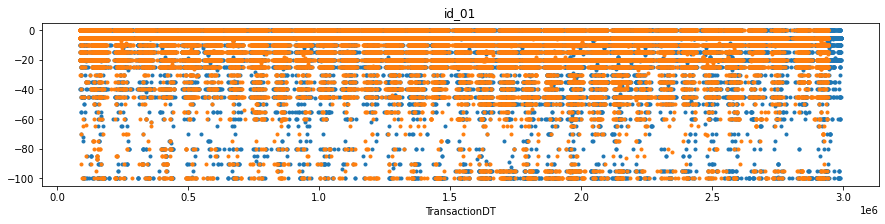

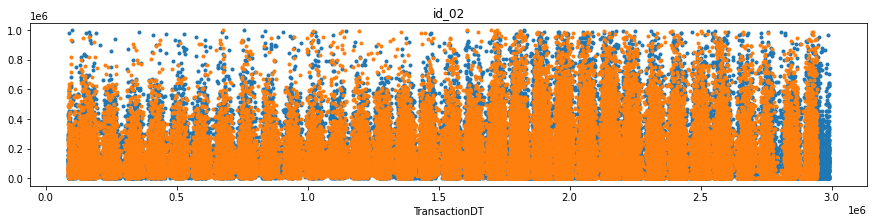

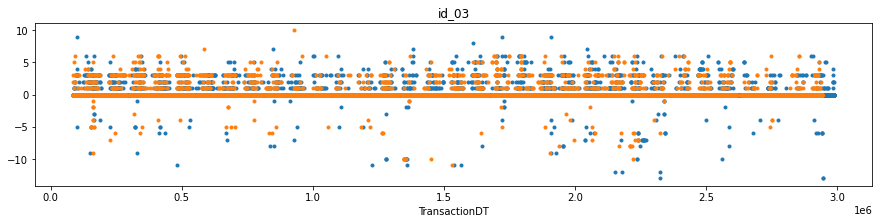

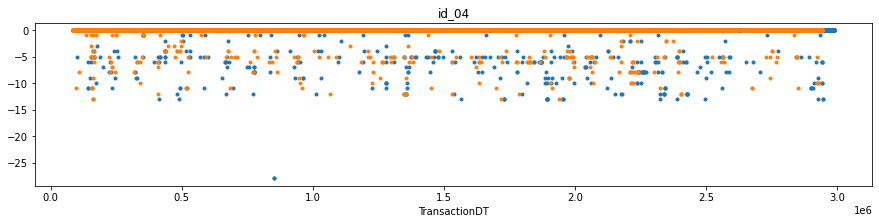

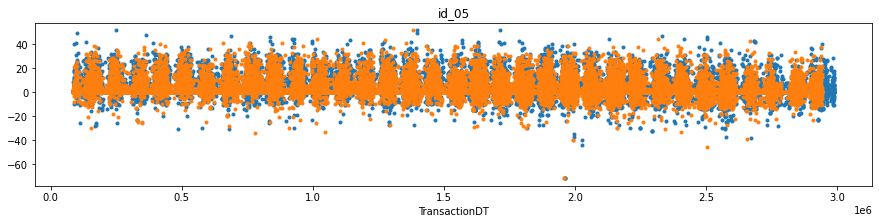

...

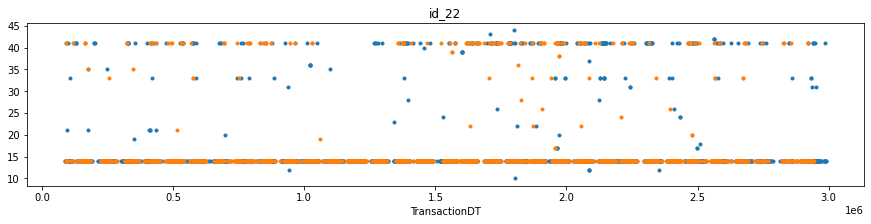

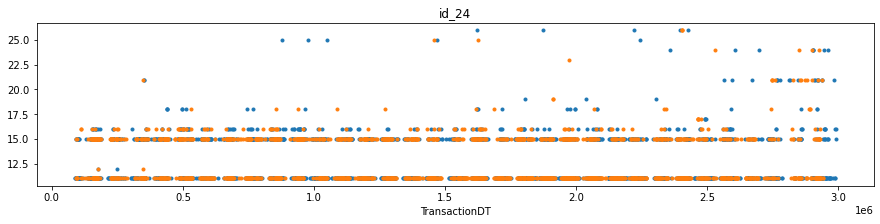

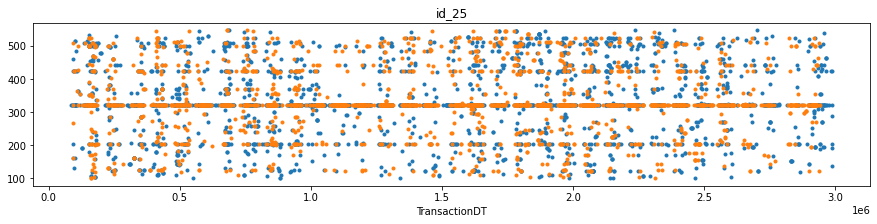

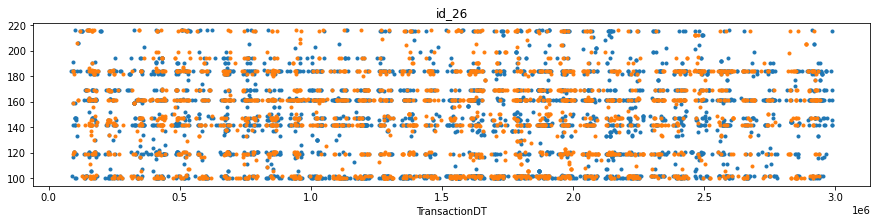

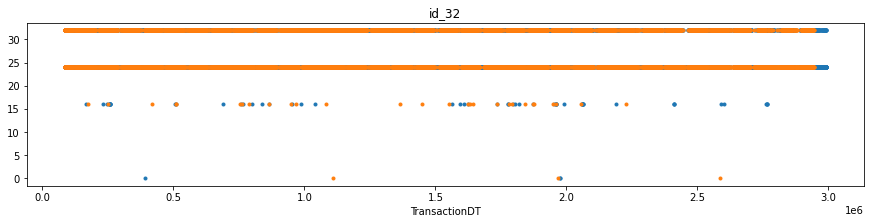

In [670]:
for i in id_cols:
    try:
        train.set_index('TransactionDT')[i].plot(style='.', title=i, figsize=(15, 3))
        test.set_index('TransactionDT')[i].plot(style='.', title=i, figsize=(15, 3))
        plt.show()
    except TypeError:
        pass

### Here we are looking for idinfo in relation to transaction time , but no such relation is seen 

In [671]:
train[id_cols].isnull().sum(axis=0)

id_01    267389
id_02    269387
id_03    314400
id_04    314400
id_05    271793
id_06    271793
id_07    351237
id_08    351237
id_09    309214
id_10    309214
id_11    269326
id_12    267389
id_13    277592
id_14    305950
id_15    269320
id_16    276264
id_17    270257
id_18    327049
id_19    270288
id_20    270330
id_21    351232
id_22    351228
id_23    351228
id_24    351487
id_25    351248
id_26    351232
id_27    351228
id_28    269326
id_29    269326
id_30    307453
id_31    269729
id_32    307441
id_33    310005
id_34    307327
id_35    269320
id_36    269320
id_37    269320
id_38    269320
dtype: int64

In [672]:
id_cols_cat = train[id_cols].select_dtypes(include=['object'])

In [673]:
id_cols_cat.head(5)

,id_12,id_15,id_16,id_23,id_27,id_28,id_29,id_30,id_31,id_33,id_34,id_35,id_36,id_37,id_38
0,NotFound,New,NotFound,NaN,NaN,New,NotFound,iOS 11.1.2,mobile safari 11.0,1334x750,match_status:1,T,F,F,T
1,NotFound,Found,Found,NaN,NaN,Found,Found,NaN,chrome 62.0,NaN,NaN,F,F,T,T
2,NotFound,Found,Found,NaN,NaN,Found,Found,Mac OS X 10_11_6,chrome 62.0,1280x800,match_status:2,T,F,T,T
3,NotFound,Found,Found,NaN,NaN,Found,Found,NaN,chrome 62.0,NaN,NaN,F,F,T,T
4,NotFound,New,NotFound,NaN,NaN,New,NotFound,NaN,chrome 62.0,NaN,NaN,F,F,T,T


In [674]:
id_cols_cat.columns

Index(['id_12', 'id_15', 'id_16', 'id_23', 'id_27', 'id_28', 'id_29', 'id_30',
       'id_31', 'id_33', 'id_34', 'id_35', 'id_36', 'id_37', 'id_38'],
      dtype='object')

### lets seperate categorical id's from numerical ones

In [675]:
id_cols_noncat = [c for c in train[id_cols].columns if c not in id_cols_cat.columns ]
train[id_cols_noncat].head(5)

,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,id_10,id_11,id_13,id_14,id_17,id_18,id_19,id_20,id_21,id_22,id_24,id_25,id_26,id_32
0,-5.0,98945.0,NaN,NaN,0.0,-5.0,NaN,NaN,NaN,NaN,100.0,49.0,-300.0,166.0,NaN,621.0,500.0,NaN,NaN,NaN,NaN,NaN,32.0
1,-5.0,191631.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0,0.0,100.0,52.0,NaN,121.0,NaN,410.0,142.0,NaN,NaN,NaN,NaN,NaN,NaN
2,0.0,7460.0,0.0,0.0,1.0,0.0,NaN,NaN,0.0,0.0,100.0,NaN,-300.0,166.0,15.0,529.0,575.0,NaN,NaN,NaN,NaN,NaN,24.0
3,-10.0,116098.0,0.0,0.0,0.0,0.0,NaN,NaN,0.0,0.0,100.0,52.0,NaN,121.0,NaN,410.0,142.0,NaN,NaN,NaN,NaN,NaN,NaN
4,-5.0,257037.0,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,100.0,52.0,NaN,225.0,NaN,484.0,507.0,NaN,NaN,NaN,NaN,NaN,NaN


### now lets see some count plots

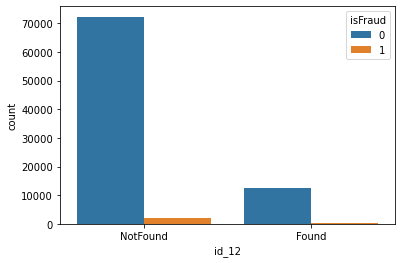

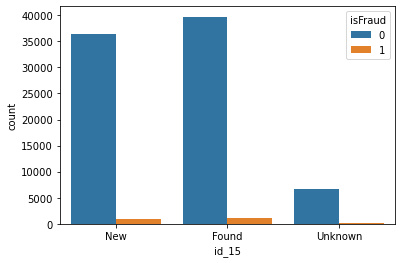

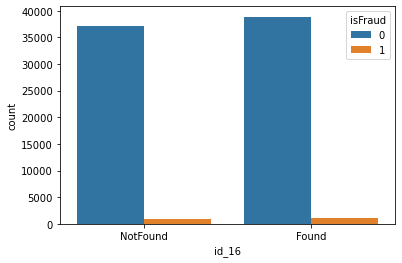

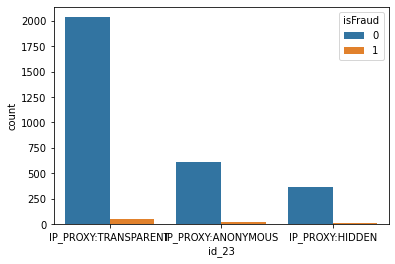

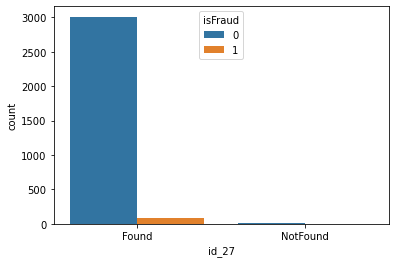

...

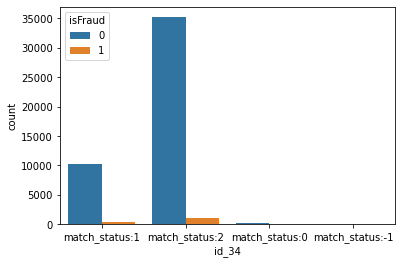

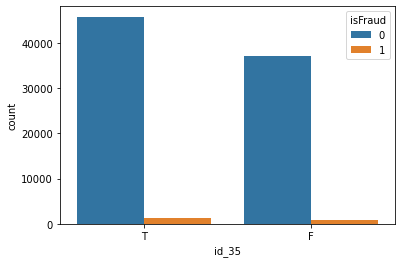

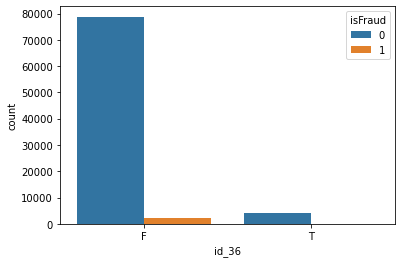

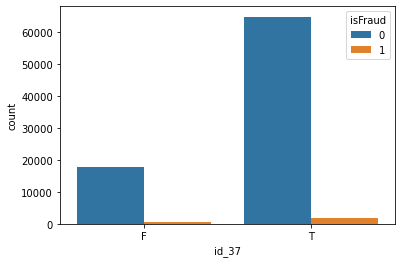

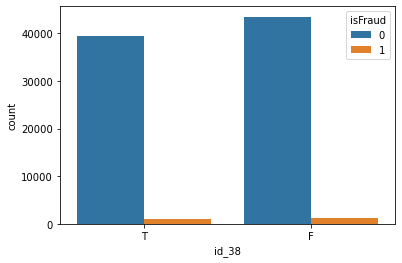

In [676]:
for i in id_cols_cat.columns:
    sns.countplot(id_cols_cat[i],hue=train['isFraud'])
    plt.show()

### percentage plots of each categorical id feature

Text(0.5, 1.0, 'Train id_12')

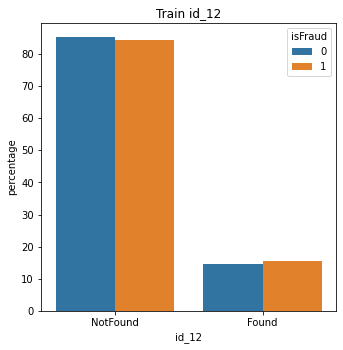

In [677]:

plt.figure(figsize=(18,18))

plt.subplot(3,3,1)

t = (train.groupby(train['isFraud'])["id_12"]
                     .value_counts(normalize=True)
                     .rename('percentage')
                     .mul(100)
                     .reset_index())
sns.barplot(x="id_12", y="percentage", hue="isFraud", data=t)
plt.title("Train id_12")

Text(0.5, 1.0, 'Train id_15')

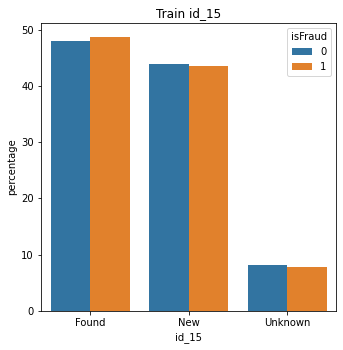

In [678]:

plt.figure(figsize=(18,18))

plt.subplot(3,3,1)

t = (train.groupby(train['isFraud'])["id_15"]
                     .value_counts(normalize=True)
                     .rename('percentage')
                     .mul(100)
                     .reset_index())
sns.barplot(x="id_15", y="percentage", hue="isFraud", data=t)
plt.title("Train id_15")

Text(0.5, 1.0, 'Train id_16')

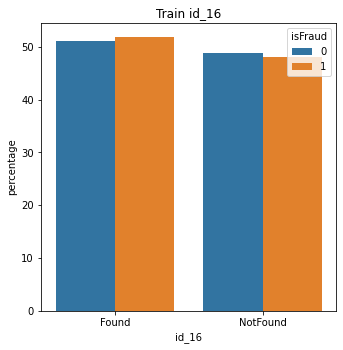

In [679]:
plt.figure(figsize=(18,18))

plt.subplot(3,3,1)

t = (train.groupby(train['isFraud'])["id_16"]
                     .value_counts(normalize=True)
                     .rename('percentage')
                     .mul(100)
                     .reset_index())
sns.barplot(x="id_16", y="percentage", hue="isFraud", data=t)
plt.title("Train id_16")

Text(0.5, 1.0, 'Train id_23')

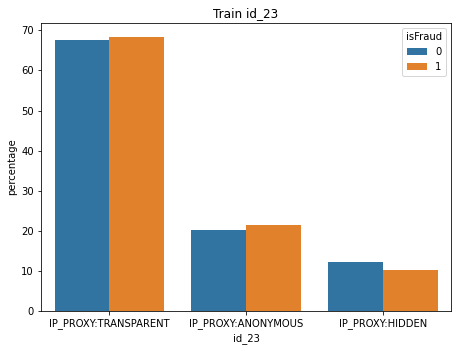

In [680]:
plt.figure(figsize=(25,18))

plt.subplot(3,3,1)

t = (train.groupby(train['isFraud'])["id_23"]
                     .value_counts(normalize=True)
                     .rename('percentage')
                     .mul(100)
                     .reset_index())
sns.barplot(x="id_23", y="percentage", hue="isFraud", data=t)
plt.title("Train id_23")

Text(0.5, 1.0, 'Train id_27')

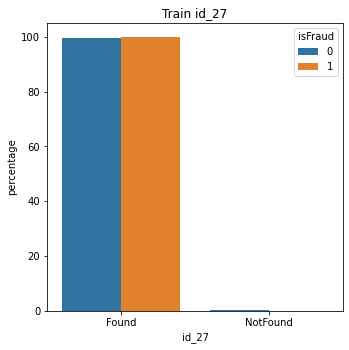

In [681]:
plt.figure(figsize=(18,18))

plt.subplot(3,3,1)

t = (train.groupby(train['isFraud'])["id_27"]
                     .value_counts(normalize=True)
                     .rename('percentage')
                     .mul(100)
                     .reset_index())
sns.barplot(x="id_27", y="percentage", hue="isFraud", data=t)
plt.title("Train id_27")

Text(0.5, 1.0, 'Train id_28')

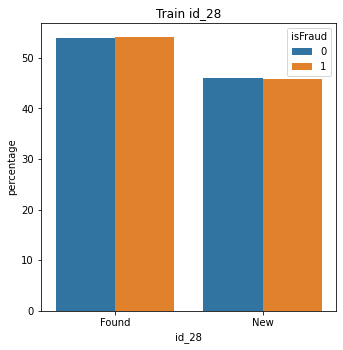

In [682]:
plt.figure(figsize=(18,18))

plt.subplot(3,3,1)

t = (train.groupby(train['isFraud'])["id_28"]
                     .value_counts(normalize=True)
                     .rename('percentage')
                     .mul(100)
                     .reset_index())
sns.barplot(x="id_28", y="percentage", hue="isFraud", data=t)
plt.title("Train id_28")

Text(0.5, 1.0, 'Train id_29')

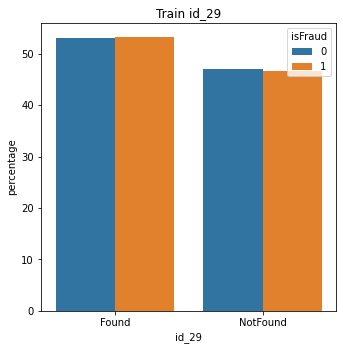

In [683]:
plt.figure(figsize=(18,18))

plt.subplot(3,3,1)

t = (train.groupby(train['isFraud'])["id_29"]
                     .value_counts(normalize=True)
                     .rename('percentage')
                     .mul(100)
                     .reset_index())
sns.barplot(x="id_29", y="percentage", hue="isFraud", data=t)
plt.title("Train id_29")

Text(0.5, 1.0, 'Train id_30')

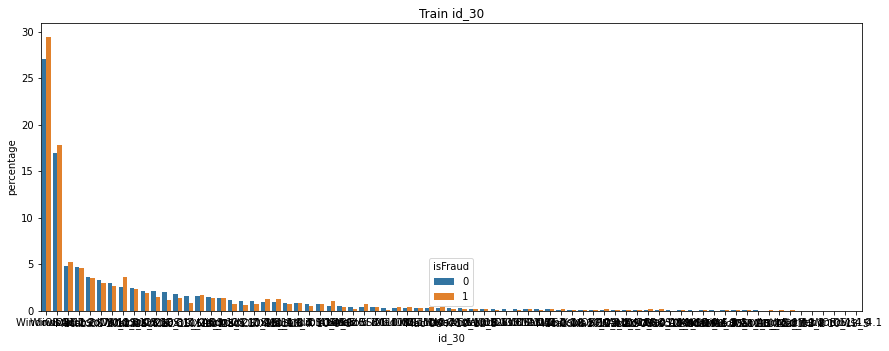

In [684]:
plt.figure(figsize=(50,18))

plt.subplot(3,3,1)

t = (train.groupby(train['isFraud'])["id_30"]
                     .value_counts(normalize=True)
                     .rename('percentage')
                     .mul(100)
                     .reset_index())
sns.barplot(x="id_30", y="percentage", hue="isFraud", data=t)
plt.title("Train id_30")

In [685]:
top = train["id_30"].value_counts()

In [686]:
top = top[0:9]

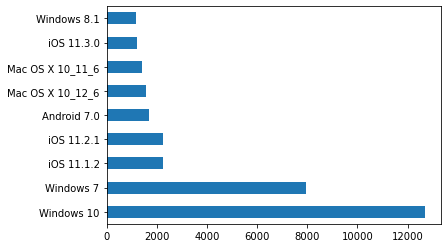

In [687]:
top.plot.barh(stacked=True)

In [688]:
top

Windows 10          12715
Windows 7            7972
iOS 11.1.2           2263
iOS 11.2.1           2236
Android 7.0          1699
Mac OS X 10_12_6     1561
Mac OS X 10_11_6     1404
iOS 11.3.0           1212
Windows 8.1          1159
Name: id_30, dtype: int64

In [689]:
df = train.loc[train['id_30'].isin(['Windows 10','Windows 7','iOS 11.1.2','iOS 11.1.1','Android 7.0','Mac OS X 10_12_6','Mac OS X 10_11_6','iOS 11.3.0','Windows 8.1'])]
df.head(10)

,TransactionID,isFraud,TransactionDT,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15,M1,M2,M3,M4,M5,M6,M7,M8,M9,V2,V3,V4,V5,V6,V7,V9,V10,V11,V12,V13,V18,V19,V20,V23,V24,V25,V26,V29,V30,V33,V34,V35,V36,V37,V38,V39,V40,V42,V43,V44,V45,V47,V48,V49,V51,V52,V53,V54,V55,V56,V58,V61,V62,V63,V64,V65,V66,V67,V68,V69,V70,V74,V75,V76,V77,V78,V79,V80,V81,V82,V83,V84,V85,V86,V87,V88,V90,V91,V94,V95,V96,V97,V99,V101,V102,V103,V105,V108,V109,V114,V115,V124,V126,V127,V128,V129,V130,V131,V132,V133,V134,V135,V136,V137,V138,V139,V140,V143,V144,V146,V147,V148,V149,V150,V151,V152,V156,V157,V158,V160,V161,V162,V164,V165,V166,V169,V170,V171,V172,V173,V174,V178,V179,V180,V185,V187,V188,V189,V194,V197,V198,V200,V201,V202,V203,V205,V206,V207,V208,V209,V210,V211,V212,V213,V214,V215,V216,V217,V218,V219,V220,V221,V222,V223,V224,V225,V226,V227,V229,V232,V233,V234,V239,V242,V243,V244,V245,V256,V257,V258,V259,V260,V261,V262,V263,V264,V265,V266,V267,V268,V269,V270,V271,V272,V273,V274,V277,V278,V279,V280,V281,V282,V283,V285,V287,V289,V290,V291,V292,V294,V295,V296,V298,V299,V300,V303,V306,V307,V308,V309,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321,V322,V323,V329,V331,V332,V333,V334,V335,V336,V337,V338,V339,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,id_10,id_11,id_12,id_13,id_14,id_15,id_16,id_17,id_18,id_19,id_20,id_21,id_22,id_23,id_24,id_25,id_26,id_27,id_28,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo,hour,LogTransactionAmt,card3Values,Logdist1,Logdist2,P_parent_emaildomain,R_parent_emaildomain
0,2987002,0,86469,W,4663,490.0,150.0,visa,166.0,debit,330.0,87.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,0.0,315.0,NaN,NaN,NaN,315.0,T,T,T,M0,F,F,F,F,F,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-5.0,98945.0,NaN,NaN,0.0,-5.0,NaN,NaN,NaN,NaN,100.0,NotFound,49.0,-300.0,New,NotFound,166.0,NaN,621.0,500.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,New,NotFound,iOS 11.1.2,mobile safari 11.0,32.0,1334x750,match_status:1,T,F,F,T,mobile,iOS Device,0,4.077537,F,5.662960,NaN,outlook,NA
2,2987005,0,86510,W,5937,555.0,150.0,visa,226.0,debit,272.0,87.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,0.0,T,T,T,M1,F,T,NaN,NaN,NaN,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Na

Text(0.5, 1.0, 'Train')

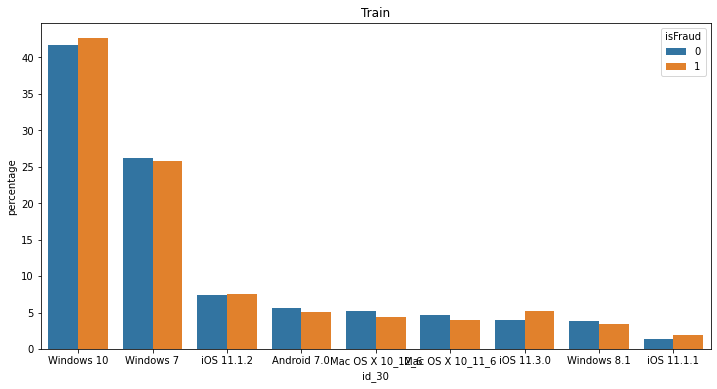

In [690]:
plt.figure(figsize=(12,6))

train_deviceInfo = (df[~df['id_30'].isnull()].groupby(['isFraud'])['id_30']
                     .value_counts(normalize=True)
                     .rename('percentage')
                     .mul(100)
                     .reset_index())
sns.barplot(x="id_30", y="percentage", hue="isFraud", data=train_deviceInfo)
plt.title('Train')

Text(0.5, 1.0, 'Train id_31')

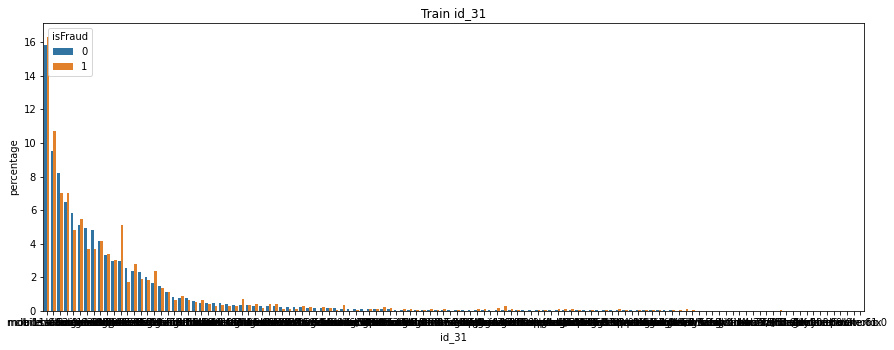

In [691]:
plt.figure(figsize=(50,18))

plt.subplot(3,3,1)

t = (train.groupby(train['isFraud'])["id_31"]
                     .value_counts(normalize=True)
                     .rename('percentage')
                     .mul(100)
                     .reset_index())
sns.barplot(x="id_31", y="percentage", hue="isFraud", data=t)
plt.title("Train id_31")

In [692]:
top = train["id_31"].value_counts()

In [693]:
top

chrome 63.0                       13423
mobile safari 11.0                 8102
mobile safari generic              6908
ie 11.0 for desktop                5488
safari generic                     4913
chrome 62.0                        4323
chrome 65.0                        4131
chrome 64.0                        4060
chrome 63.0 for android            3536
chrome generic                     2838
chrome 66.0                        2543
edge 16.0                          2512
chrome 64.0 for android            2139
firefox 57.0                       2017
chrome 65.0 for android            1947
mobile safari 10.0                 1683
chrome 66.0 for android            1410
chrome 62.0 for android            1238
edge 15.0                           942
chrome generic for android          700
firefox 59.0                        641
samsung browser 6.2                 635
firefox 58.0                        516
chrome 49.0                         418
firefox                             412


In [694]:
top = top[0:9]

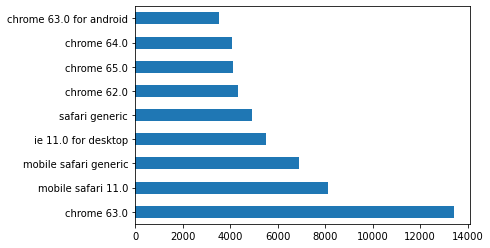

In [695]:
top.plot.barh(stacked=True)

In [696]:
l =top.keys()
l

Index(['chrome 63.0', 'mobile safari 11.0', 'mobile safari generic',
       'ie 11.0 for desktop', 'safari generic', 'chrome 62.0', 'chrome 65.0',
       'chrome 64.0', 'chrome 63.0 for android'],
      dtype='object')

#### nothing interesting only id_30 , id_31 has some useful info

In [697]:
df = train.loc[train['id_31'].isin(l)]
df.head(10)

,TransactionID,isFraud,TransactionDT,ProductCD,card1,card2,card3,card4,card5,card6,addr1,addr2,C1,C2,C3,C4,C5,C6,C7,C8,C9,C10,C11,C12,C13,C14,D1,D2,D3,D4,D5,D6,D7,D8,D9,D10,D11,D12,D13,D14,D15,M1,M2,M3,M4,M5,M6,M7,M8,M9,V2,V3,V4,V5,V6,V7,V9,V10,V11,V12,V13,V18,V19,V20,V23,V24,V25,V26,V29,V30,V33,V34,V35,V36,V37,V38,V39,V40,V42,V43,V44,V45,V47,V48,V49,V51,V52,V53,V54,V55,V56,V58,V61,V62,V63,V64,V65,V66,V67,V68,V69,V70,V74,V75,V76,V77,V78,V79,V80,V81,V82,V83,V84,V85,V86,V87,V88,V90,V91,V94,V95,V96,V97,V99,V101,V102,V103,V105,V108,V109,V114,V115,V124,V126,V127,V128,V129,V130,V131,V132,V133,V134,V135,V136,V137,V138,V139,V140,V143,V144,V146,V147,V148,V149,V150,V151,V152,V156,V157,V158,V160,V161,V162,V164,V165,V166,V169,V170,V171,V172,V173,V174,V178,V179,V180,V185,V187,V188,V189,V194,V197,V198,V200,V201,V202,V203,V205,V206,V207,V208,V209,V210,V211,V212,V213,V214,V215,V216,V217,V218,V219,V220,V221,V222,V223,V224,V225,V226,V227,V229,V232,V233,V234,V239,V242,V243,V244,V245,V256,V257,V258,V259,V260,V261,V262,V263,V264,V265,V266,V267,V268,V269,V270,V271,V272,V273,V274,V277,V278,V279,V280,V281,V282,V283,V285,V287,V289,V290,V291,V292,V294,V295,V296,V298,V299,V300,V303,V306,V307,V308,V309,V310,V311,V312,V313,V314,V315,V316,V317,V318,V319,V320,V321,V322,V323,V329,V331,V332,V333,V334,V335,V336,V337,V338,V339,id_01,id_02,id_03,id_04,id_05,id_06,id_07,id_08,id_09,id_10,id_11,id_12,id_13,id_14,id_15,id_16,id_17,id_18,id_19,id_20,id_21,id_22,id_23,id_24,id_25,id_26,id_27,id_28,id_29,id_30,id_31,id_32,id_33,id_34,id_35,id_36,id_37,id_38,DeviceType,DeviceInfo,hour,LogTransactionAmt,card3Values,Logdist1,Logdist2,P_parent_emaildomain,R_parent_emaildomain
0,2987002,0,86469,W,4663,490.0,150.0,visa,166.0,debit,330.0,87.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,0.0,315.0,NaN,NaN,NaN,315.0,T,T,T,M0,F,F,F,F,F,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-5.0,98945.0,NaN,NaN,0.0,-5.0,NaN,NaN,NaN,NaN,100.0,NotFound,49.0,-300.0,New,NotFound,166.0,NaN,621.0,500.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,New,NotFound,iOS 11.1.2,mobile safari 11.0,32.0,1334x750,match_status:1,T,F,F,T,mobile,iOS Device,0,4.077537,F,5.662960,NaN,outlook,NA
1,2987003,0,86499,W,18132,567.0,150.0,mastercard,117.0,debit,476.0,87.0,2.0,5.0,0.0,0.0,0.0,4.0,0.0,0.0,1.0,0.0,1.0,0.0,25.0,1.0,112.0,112.0,0.0,94.0,0.0,NaN,NaN,NaN,NaN,84.0,NaN,NaN,NaN,NaN,111.0,NaN,NaN,NaN,M0,T,F,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,48.0,28.0,10.0,1.0,38.0,24.0,0.0,1.0,1.0,1.0,1.0,1.0,50.0,1758.000000,925.000000,0.0,354.000000,135.000000,50.0,1404.0,790.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

Text(0.5, 1.0, 'Train')

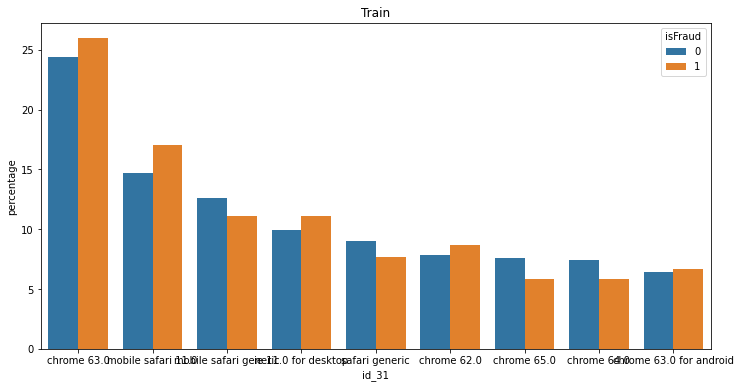

In [698]:
plt.figure(figsize=(12,6))

train_deviceInfo = (df[~df['id_31'].isnull()].groupby(['isFraud'])['id_31']
                     .value_counts(normalize=True)
                     .rename('percentage')
                     .mul(100)
                     .reset_index())
sns.barplot(x="id_31", y="percentage", hue="isFraud", data=train_deviceInfo)
plt.title('Train')

### non categorical distplots

In [699]:
id_cols_noncat

['id_01',
 'id_02',
 'id_03',
 'id_04',
 'id_05',
 'id_06',
 'id_07',
 'id_08',
 'id_09',
 'id_10',
 'id_11',
 'id_13',
 'id_14',
 'id_17',
 'id_18',
 'id_19',
 'id_20',
 'id_21',
 'id_22',
 'id_24',
 'id_25',
 'id_26',
 'id_32']

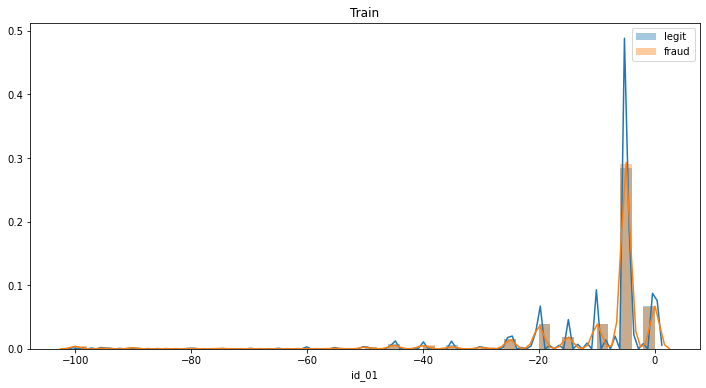

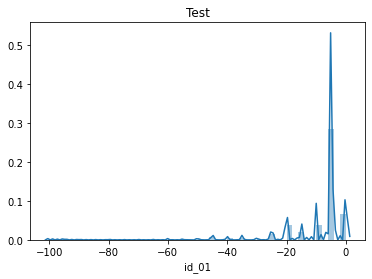

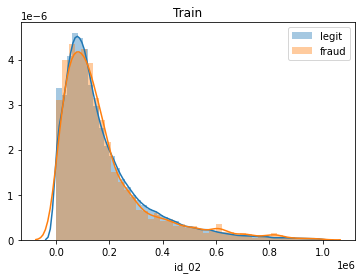

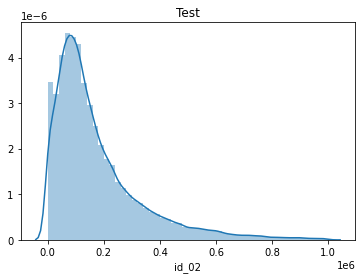

C:\Users\shivam\anaconda\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\shivam\anaconda\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


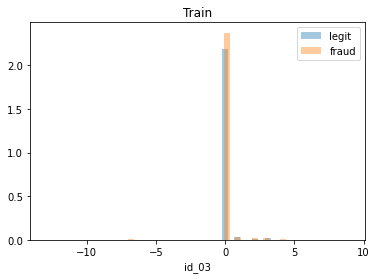

C:\Users\shivam\anaconda\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


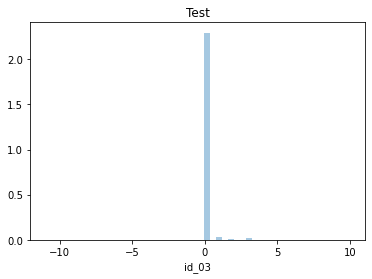

C:\Users\shivam\anaconda\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\shivam\anaconda\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


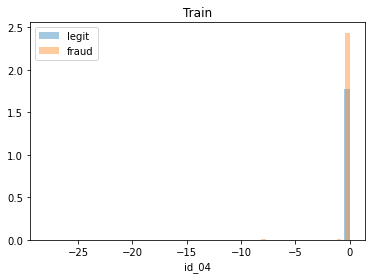

C:\Users\shivam\anaconda\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


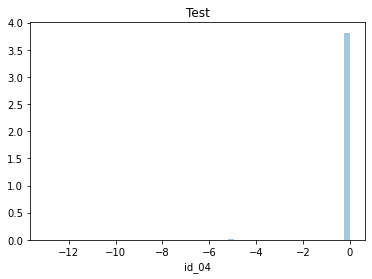

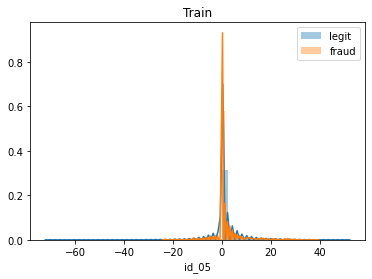

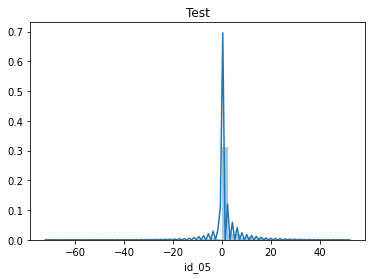

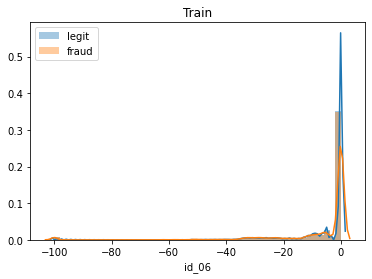

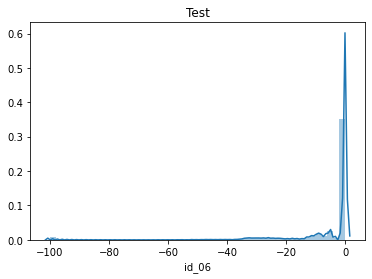

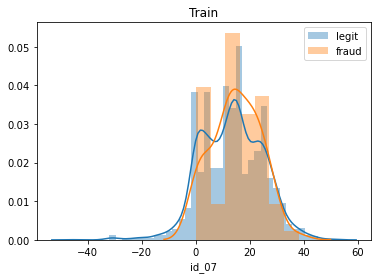

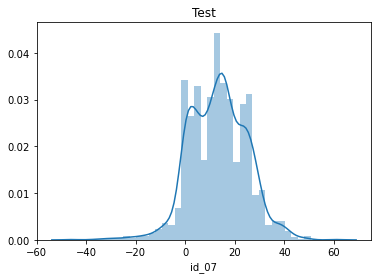

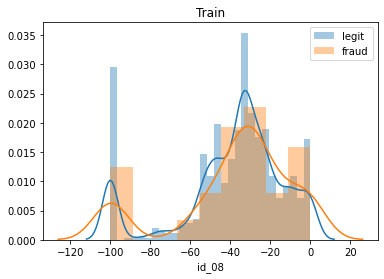

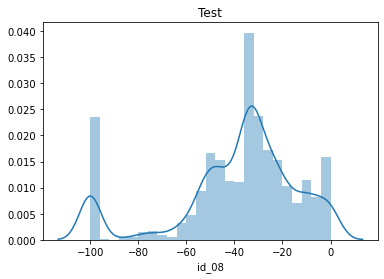

C:\Users\shivam\anaconda\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\shivam\anaconda\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


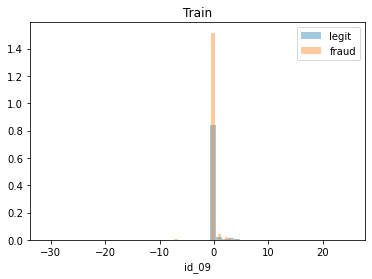

C:\Users\shivam\anaconda\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


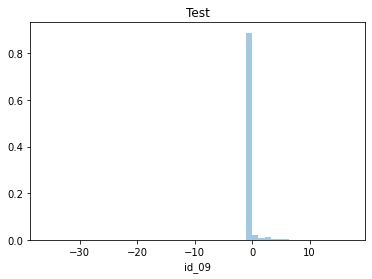

C:\Users\shivam\anaconda\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\shivam\anaconda\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


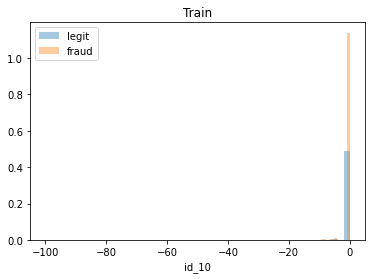

C:\Users\shivam\anaconda\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


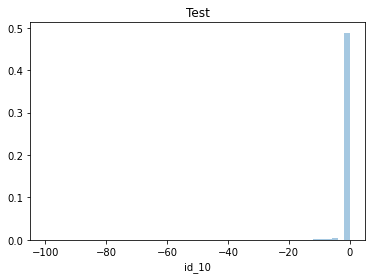

C:\Users\shivam\anaconda\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\shivam\anaconda\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


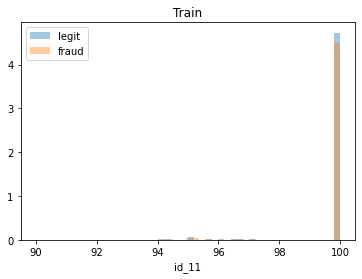

C:\Users\shivam\anaconda\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


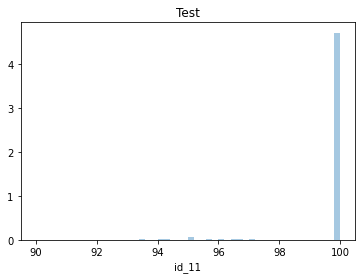

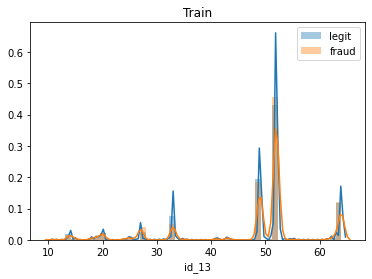

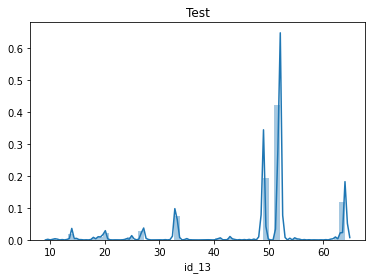

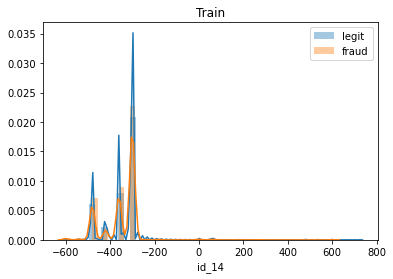

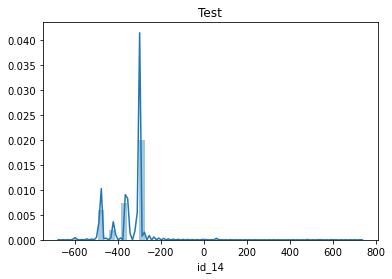

...

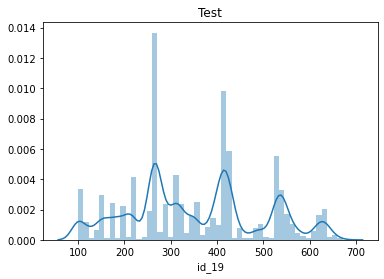

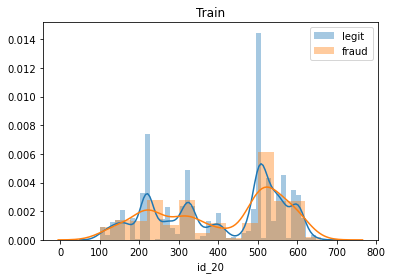

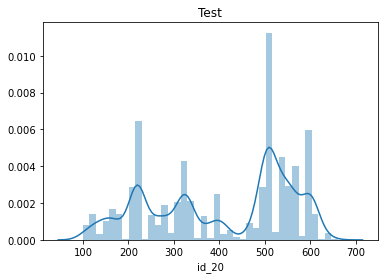

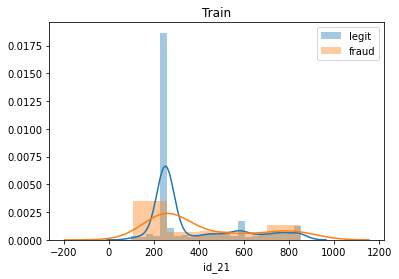

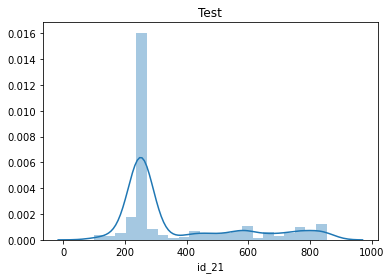

C:\Users\shivam\anaconda\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\shivam\anaconda\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


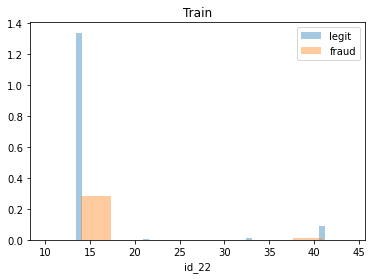

C:\Users\shivam\anaconda\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


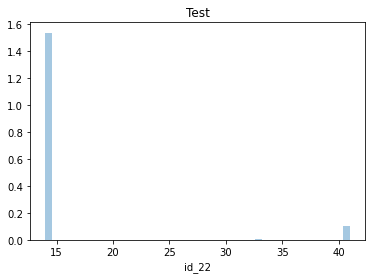

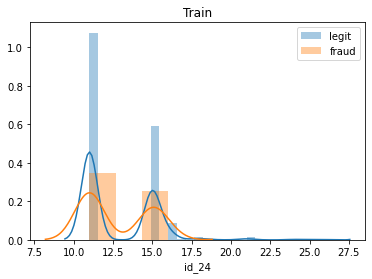

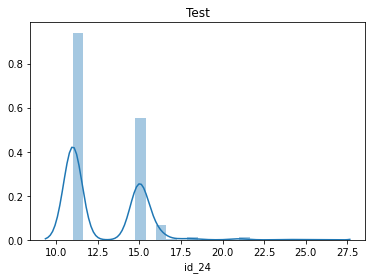

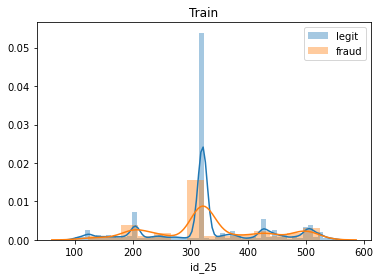

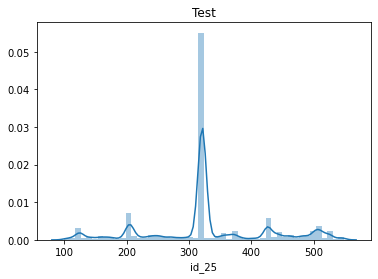

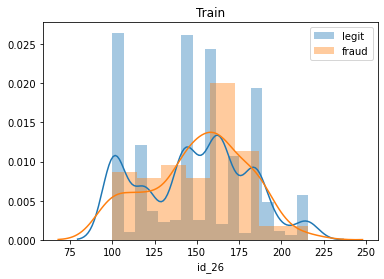

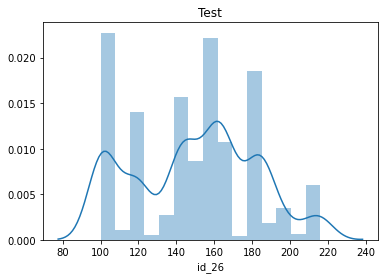

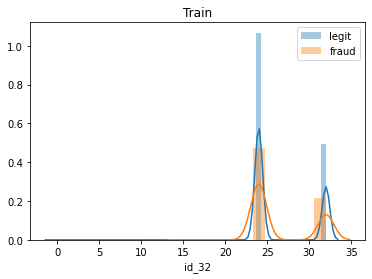

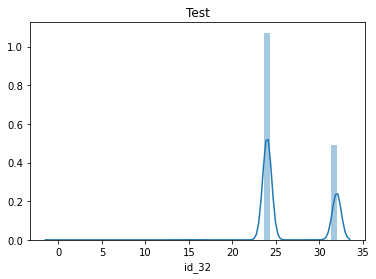

In [700]:
plt.figure(figsize=(12,6))
i = 1
j1 = i+1

for j in id_cols_noncat:
    
    sns.distplot(train[(train['isFraud']==0)][j])
    sns.distplot(train[(train['isFraud']==1)][j])
    plt.legend(['legit','fraud'])
    plt.title('Train')
    plt.show()
    sns.distplot(test[j])
    plt.title('Test')
    plt.show()

# Conclusion From EDA

### After analyzing all features of dataset we have observed various points :


- is Fraud feature is  highly imbalaced since there are very few transactions which are fraud so we have to take care while  training model and use appropiate performance metrics.

-  Transaction DT plays an important role in predicting transaction is fraud and legit as we have observed time interval for    which rate of fraud transaction is high(in hours) i.e 3 - 11.

- Transaction amount  plays an important role in predicting transaction is fraud and legit as we have observed amount interval for which rate of fraud transaction is high and we have also transformed transaction amount since data is highly skewed.

- product cd is a categorical feature with no null values and will be useful for model since rate of fraud transcaton using  "c" is high and since it is a categorical feature we need to encode it.

- Card features have 6 columns out of which 4 are numerical(card1,2,3,5) 2 are categorical(card4,6).
 
  - card features contains null values we have to see how to manage them before giving it to model.
  
  - card3 contains majority two values 150 and 180 and for values above 150 rate of fraud transaction is high so for null values in card 3 if it is fraud we can replace it with 180 else with median or mode.
  
  - card 4 most of the transaction happend through visa card type.
     percentage of fraud in card discover is more than the legit transaction.
  
  - card 6  Debit or credit and charge card are almost 0% in the dataset so we merge them in debit card and rate of fraud trasaction through credit card is high.

- Device type and Device info contains high null values count and doesnot provide any interesting result so we have to check whether they affect model accuracy or not otherwise we can drop them.

- addr1 we have observed for certain interval fraud rate is high and addr1 contain Null values and data is distributed so we can replace null value with mean.
- addr2 conatins null values and majorly have 1 value(87) for all rows so we can replace null values with 87 and for rows having value 60 fraud rate is high
- dist1 and dist2 contains high null value count and are skewed so we first transform them using log tranformation
  - after tranforming dist1 we have observed for value>4 rate of fraud is high so it will be helpful to predict transacton and we can replace null values with mean.
  - after tranforming dist2 we have not found any interseting results and morever it contains more than 85% NULL values so we    can drop it.
- P_emaildomain and R_emaildomain are categorical features which provides us interesting results in which rate of fraud for a protonmail domain is high.
- c columns while analyzing them we have observed that some columns contains outliers which need to be handled and many c columns are highly correlated which can be dropped but before dropping we need to confirm .
  - c colums contains 0 null values 
- M colums contains two unique values(T,F) and doesnot have any interesting results except for column M4 in which rate of M2 is high.
- D columns have large null value count and some dcolumns conatins -ve value outlier that need to be handled
  -Some D columns are highly correlated which can be dropped but before dropping we need to confirm.
  - D colums doesnot show any important analysis.
  - Null values can be replaced with mean.
- v columns some of them contribute very less to model so we have seen after removing them accuracy remains same
  - v columns conatins null values which can be replaced by mean.
- id columns contains both categorical and numerical features 
  - id 30 and id 31 shows some interesting results
  - numercal id columns null vlues can be replaced by mean

In [33]:
train.to_csv("train1.csv",index=False)
test.to_csv("test1.csv",index=False)

In [ ]:
#end----------------------------------------------------------------------------------------------------------------